### Imports

In [1]:
import pandas as pd
from auto_ts import auto_timeseries
import dill
import talib
import numpy as np

Imported auto_timeseries version:0.0.90. Call by using:
model = auto_timeseries(score_type='rmse',
        time_interval='M', non_seasonal_pdq=None, seasonality=False,
        seasonal_period=12, model_type=['best'], verbose=2, dask_xgboost_flag=0)
model.fit(traindata, ts_column,target)
model.predict(testdata, model='best')



In [2]:
# Evito que ciertas columnas se transformen a notacion cientifica en las predicciones
pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.set_option('display.max_columns', None)

### Dataset

In [3]:
columns = [
    'Open_time',
    'Open',
    'High',
    'Low',
    'Close',
    'Number of trades',
    'Close_BTCUSDT',
    'Volume_BTCUSDT',
    'Number_of_trades_BTCUSDT',
    'Close_ETHUSDT',
    'Volume_ETHUSDT',
    'Number_of_trades_ETHUSDT',
    'Close_BNBUSDT',
    'Volume_BNBUSDT',
    'Number_of_trades_BNBUSDT',
    'SMA_20',
    'EMA_20',
    'Upper_Band',
    'Middle_Band',
    'Lower_Band',
    'RSI',
    'buy_1000x_high_coinbase',
    'sell_1000x_high_coinbase',
    'total_trades_coinbase',	
    'Tweets_Utilizados',
    'Tweets_Utilizados_coin',
    'Tweets_Utilizados_referentes',
    'Tweets_Utilizados_whale_alert',
    'Buy_1000x_high',
    'sell_1000x_high',
    'total_trades_binance'
]
columns_to_model=[
    'Open',
    'High',
    'Low',
    'Close',
    'Number of trades',
    'Close_BTCUSDT',
    'Volume_BTCUSDT',
    'Number_of_trades_BTCUSDT',
    'Close_ETHUSDT',
    'Volume_ETHUSDT',
    'Number_of_trades_ETHUSDT',
    'Close_BNBUSDT',
    'Volume_BNBUSDT',
    'Number_of_trades_BNBUSDT',
    # 'SMA_20',
    # 'EMA_20',
    # 'Upper_Band',
    # 'Middle_Band',
    # 'Lower_Band',
    # 'RSI',
    'buy_1000x_high_coinbase',
    'sell_1000x_high_coinbase',
    'total_trades_coinbase',	
    'Tweets_Utilizados',
    'Tweets_Utilizados_coin',
    'Tweets_Utilizados_referentes',
    'Tweets_Utilizados_whale_alert',
    'Buy_1000x_high',
    'sell_1000x_high',
    'total_trades_binance'
]

In [4]:
dataset = pd.read_csv('/Users/mmarchetta/Desktop/Tesis-2024/data-visualization/final_dataset.csv') 
dataset['Open_time'] = pd.to_datetime(dataset['Open_time'])

In [5]:
display(dataset.head())

,Open_time,Open,High,Low,Close,Volume,Quote asset volume,Number of trades,Open_BTCUSDT,High_BTCUSDT,Low_BTCUSDT,Close_BTCUSDT,Volume_BTCUSDT,Quote_asset_volume_BTCUSDT,Number_of_trades_BTCUSDT,Open_ETHUSDT,High_ETHUSDT,Low_ETHUSDT,Close_ETHUSDT,Volume_ETHUSDT,Quote_asset_volume_ETHUSDT,Number_of_trades_ETHUSDT,Open_BNBUSDT,High_BNBUSDT,Low_BNBUSDT,Close_BNBUSDT,Volume_BNBUSDT,Quote_asset_volume_BNBUSDT,Number_of_trades_BNBUSDT,SMA_20,EMA_20,Upper_Band,Middle_Band,Lower_Band,RSI,MACD,Signal,ADX,SlowK,SlowD,CCI,ATR,MFI,buy_1000x_high_coinbase,sell_1000x_high_coinbase,total_trades_coinbase,Sentimiento,Tweets_Utilizados,Cantidad_pos,Cantidad_neg,Cantidad_neu,Compound total,Sentimiento_coin,Tweets_Utilizados_coin,Cantidad_pos_coin,Cantidad_neg_coin,Cantidad_neu_coin,Compound total coin,Sentimiento_referentes,Tweets_Utilizados_referentes,Cantidad_pos_referentes,Cantidad_neg_referentes,Cantidad_neu_referentes,Compound total referentes,Tweets_Utilizados_whale_alert,Buy_1000x_high,sell_1000x_high,total_trades_binance,Tendencia
0,2021-09-27,28.84,30.26,27.50,27.71,11094418.10,320340017.82,449178.00,43160.90,44350.00,42098.00,42147.35,39776.84,1728912299.80,1001487.00,3059.36,3164.94,2922.71,2925.59,510130.73,1564096695.37,1043885.00,344.00,357.60,335.00,335.50,956544.07,332372476.51,457187.00,31.85,30.83,38.30,31.85,25.39,44.11,0.02,0.96,21.20,24.79,33.78,-86.30,4.00,29.23,0.00,0.00,0.00,pos,139,61.00,28.00,50.00,17.83,pos,135,71.00,26.00,38.00,30.62,neu,1.00,0.00,0.00,1.00,0.00,81.00,525.00,364.00,270000.00,Lateral
1,2021-09-28,27.72,28.38,26.14,26.31,9784154.53,267560973.69,362304.00,42147.35,42787.38,40888.00,41026.54,43372.26,1816305387.84,1045389.00,2924.76,2970.82,2789.00,2804.91,511325.46,1477983245.67,928494.00,335.50,344.60,330.00,333.00,922077.23,310828343.70,417006.00,31.77,30.40,38.44,31.77,25.11,41.83,-0.33,0.70,21.98,16.10,24.47,-109.46,3.88,19.19,4.00,2.00,5273.00,pos,93,40.00,21.00,32.00,10.18,pos,122,57.00,23.00,42.00,19.89,neu,2.00,1.00,1.00,0.00,0.02,87.00,472.00,331.00,204000.00,Bajista
2,2021-09-29,26.31,28.59,26.11,27.28,10207287.33,280535376.38,376232.00,41025.01,42590.00,40753.88,41524.28,33511.53,1399625476.06,884909.00,2805.15,2950.00,2782.00,2850.45,411305.09,1180681056.16,748804.00,332.90,375.40,331.20,367.70,1696420.04,612547661.88,653011.00,31.65,30.10,38.55,31.65,24.74,43.99,-0.52,0.46,22.61,12.88,17.92,-92.93,3.78,23.82,22.00,40.00,54144.00,pos,112,61.00,19.00,32.00,23.13,pos,145,71.00,20.00,54.00,30.30,neu,0.00,0.00,0.00,0.00,0.00,64.00,594.00,495.00,216000.00,Alcista
3,2021-09-30,27.28,28.99,27.13,28.62,8201551.44,230622998.43,339737.00,41524.29,44141.37,41410.17,43824.10,46381.23,2005486003.56,1197815.00,2850.45,3048.42,2837.19,3000.61,506896.76,1514341937.31,992243.00,367.70,388.80,366.40,387.50,1163674.21,439628574.42,551245.00,31.62,29.96,38.56,31.62,24.67,46.92,-0.56,0.26,22.99,16.42,15.13,-60.03,3.64,28.34,15.00,23.00,39220.00,pos,116,46.00,28.00,42.00,7.68,pos,147,73.00,26.00,48.00,30.90,pos,2.00,1.00,0.00,1.00,0.75,77.00,419.00,464.00,202000.00,Alcista
4,2021-10-01,28.61,32.33,28.50,31.94,13176348.21,402700970.65,735059.00,43820.01,48495.00,43283.03,48141.61,66244.87,3076094886.59,1771237.00,3000.62,3330.00,2969.07,3309.91,648714.62,2063112280.67,1446386.00,387.50,423.40,381.50,421.50,1440336.04,584311192.72,727854.00,31.64,30.15,38.58,31.64,24.69,53.42,-0.31,0.14,21.86,34.90,21.40,34.17,3.65,35.02,24.00,35.00,63183.00,pos,171,72.00,21.00,78.00,30.72,pos,141,70.00,18.00,53.00,30.43,pos,1.00,1.00,0.00,0.00,0.82,71.00,477.00,664.00,492000.00,Alcista


In [6]:
dates = dataset['Open_time'][:-5]

dataset = dataset.round(2)

feature_dataset = dataset[columns]
# feature_dataset['Open_time'] = dataset['Open_time']
# feature_dataset.set_index('Open_time', inplace=True)

validation = feature_dataset[-5:]
feature_dataset = feature_dataset[:-5]

n_days_to_predict = 5

In [7]:
display(feature_dataset.head())
print(feature_dataset.shape)

display(validation.head())
display(validation.shape)

,Open_time,Open,High,Low,Close,Number of trades,Close_BTCUSDT,Volume_BTCUSDT,Number_of_trades_BTCUSDT,Close_ETHUSDT,Volume_ETHUSDT,Number_of_trades_ETHUSDT,Close_BNBUSDT,Volume_BNBUSDT,Number_of_trades_BNBUSDT,SMA_20,EMA_20,Upper_Band,Middle_Band,Lower_Band,RSI,buy_1000x_high_coinbase,sell_1000x_high_coinbase,total_trades_coinbase,Tweets_Utilizados,Tweets_Utilizados_coin,Tweets_Utilizados_referentes,Tweets_Utilizados_whale_alert,Buy_1000x_high,sell_1000x_high,total_trades_binance
0,2021-09-27,28.84,30.26,27.50,27.71,449178.00,42147.35,39776.84,1001487.00,2925.59,510130.73,1043885.00,335.50,956544.07,457187.00,31.85,30.83,38.30,31.85,25.39,44.11,0.00,0.00,0.00,139,135,1.00,81.00,525.00,364.00,270000.00
1,2021-09-28,27.72,28.38,26.14,26.31,362304.00,41026.54,43372.26,1045389.00,2804.91,511325.46,928494.00,333.00,922077.23,417006.00,31.77,30.40,38.44,31.77,25.11,41.83,4.00,2.00,5273.00,93,122,2.00,87.00,472.00,331.00,204000.00
2,2021-09-29,26.31,28.59,26.11,27.28,376232.00,41524.28,33511.53,884909.00,2850.45,411305.09,748804.00,367.70,1696420.04,653011.00,31.65,30.10,38.55,31.65,24.74,43.99,22.00,40.00,54144.00,112,145,0.00,64.00,594.00,495.00,216000.00
3,2021-09-30,27.28,28.99,27.13,28.62,339737.00,43824.10,46381.23,1197815.00,3000.61,506896.76,992243.00,387.50,1163674.21,551245.00,31.62,29.96,38.56,31.62,24.67,46.92,15.00,23.00,39220.00,116,147,2.00,77.00,419.00,464.00,202000.00
4,2021-10-01,28.61,32.33,28.50,31.94,735059.00,48141.61,66244.87,1771237.00,3309.91,648714.62,1446386.00,421.50,1440336.04,727854.00,31.64,30.15,38.58,31.64,24.69,53.42,24.00,35.00,63183.00,171,141,1.00,71.00,477.00,664.00,492000.00


(903, 31)


,Open_time,Open,High,Low,Close,Number of trades,Close_BTCUSDT,Volume_BTCUSDT,Number_of_trades_BTCUSDT,Close_ETHUSDT,Volume_ETHUSDT,Number_of_trades_ETHUSDT,Close_BNBUSDT,Volume_BNBUSDT,Number_of_trades_BNBUSDT,SMA_20,EMA_20,Upper_Band,Middle_Band,Lower_Band,RSI,buy_1000x_high_coinbase,sell_1000x_high_coinbase,total_trades_coinbase,Tweets_Utilizados,Tweets_Utilizados_coin,Tweets_Utilizados_referentes,Tweets_Utilizados_whale_alert,Buy_1000x_high,sell_1000x_high,total_trades_binance
903,2024-03-18,10.08,10.46,9.60,9.90,245319.00,67609.99,55691.08,2464515.00,3520.46,570901.29,1906387.00,555.40,2284301.81,994512.00,10.06,9.95,11.86,10.06,8.26,52.48,34.00,43.00,84706.00,696,471,0.00,43.00,343.00,228.00,154000.00
904,2024-03-19,9.90,9.99,8.60,8.77,341363.00,61937.40,101005.32,3593832.00,3158.64,1049629.69,2647385.00,507.70,2551361.51,1213572.00,10.08,9.84,11.81,10.08,8.35,42.93,120.00,126.00,135180.00,961,509,1.00,56.00,534.00,433.00,221000.00
905,2024-03-20,8.77,9.57,8.49,9.48,267797.00,67840.51,90420.59,3549793.00,3516.53,1207322.82,2987953.00,556.80,1425296.58,809335.00,10.14,9.80,11.68,10.14,8.60,49.21,185.00,117.00,112997.00,866,555,1.00,40.00,473.00,386.00,171000.00
906,2024-03-21,9.48,9.58,9.07,9.18,156774.00,65501.27,53357.48,2388390.00,3492.85,602755.21,1791989.00,553.80,953921.37,563996.00,10.17,9.74,11.63,10.17,8.71,46.85,64.00,81.00,66543.00,692,533,0.00,24.00,350.00,290.00,101000.00
907,2024-03-22,9.18,9.37,8.69,8.94,147578.00,63796.64,51482.38,2492881.00,3336.35,558848.89,1747756.00,553.80,1181298.51,712381.00,10.14,9.67,11.67,10.14,8.62,45.00,57.00,66.00,68616.00,681,546,0.00,41.00,252.00,206.00,92000.00


(5, 31)

### Models

#### Generacion de los modelos

Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------------------------+
|        Test Statistic       |     -1.7525595399220926      |
|           p-value           |      0.4042556812228438      |
|          #Lags Used         |             0.0              |
| Number of Observations Used |            902.0             |
|     Critical Value (1%)     |

After differencing=1, results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------------------------+
|        Test Statistic       |     -31.098918987015185      |
|           p-value           |             0.0              |
|          #Lags Used         |             0.0              |
| Number of Observations Used |            901.0             |
|     Critical Value (1%)     |      -3.437628610719785      |
|     Critical Value (5%)     |     -2.8647531504389767      |
|     Critical Value (10%)    |     -2.5684808963896324      |
+-----------------------------+------------------------------+
this series is stationary
There is some differencing needed in this datasets for stat models


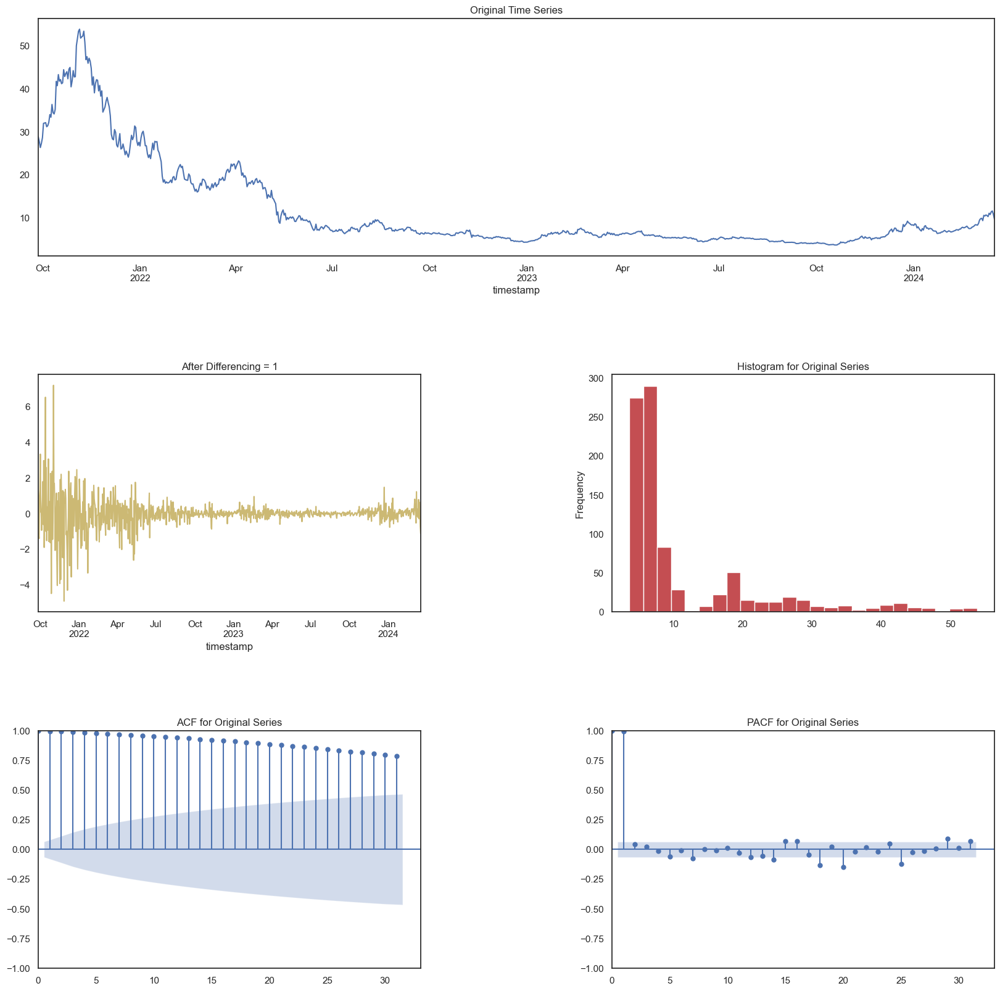

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:45:00 - cmdstanpy - INFO - Chain [1] start processing
19:45:00 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 0.21
    Std Deviation of actuals = 0.19
    Normalized RMSE (as pct of std dev) = 111%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:45:01 - cmdstanpy - INFO - Chain [1] start processing
19:45:01 - cmdstanpy - INFO - Chain [1] done processing
19:45:02 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 0.89
    Std Deviation of actuals = 0.18
    Normalized RMSE (as pct of std dev) = 493%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:45:02 - cmdstanpy - INFO - Chain [1] done processing
19:45:03 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 1.81
    Std Deviation of actuals = 0.42
    Normalized RMSE (as pct of std dev) = 427%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:45:03 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 1.74
    Std Deviation of actuals = 0.27
    Normalized RMSE (as pct of std dev) = 652%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:45:04 - cmdstanpy - INFO - Chain [1] start processing
19:45:04 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 1.05
    Std Deviation of actuals = 0.66
    Normalized RMSE (as pct of std dev) = 160%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 1.11
    MSE (Mean Squared Error = 1.65
    MAPE (Mean Absolute Percent Error) = 11%
    RMSE (Root Mean Squared Error) = 1.2842
    Normalized RMSE (MinMax) = 31%
    Normalized RMSE (as Std Dev of Actuals)= 97%
Time Taken = 5 seconds


19:45:05 - cmdstanpy - INFO - Chain [1] start processing
19:45:05 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 1.14


--------------------------------------------------
Total time taken: 11 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet  1.14
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------------

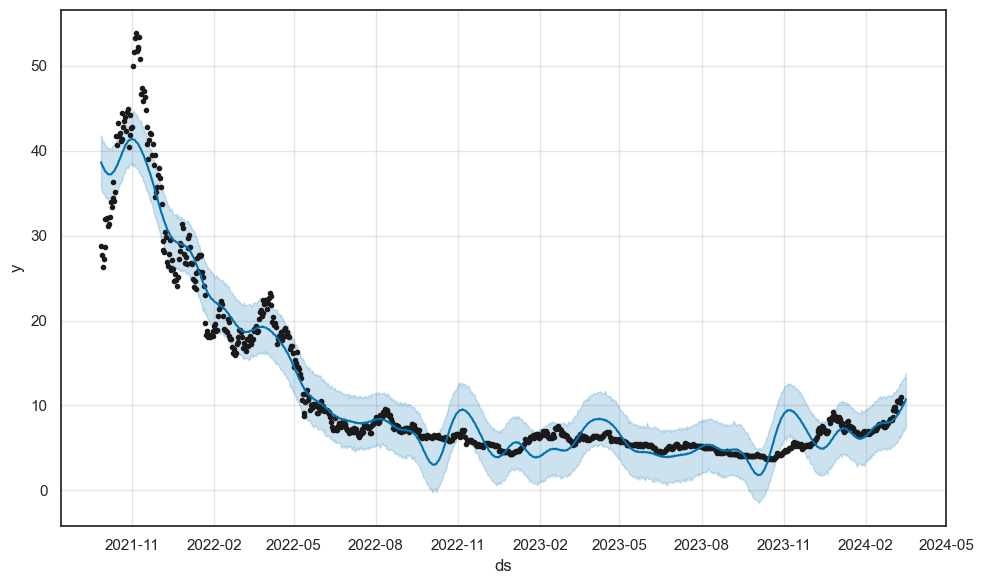

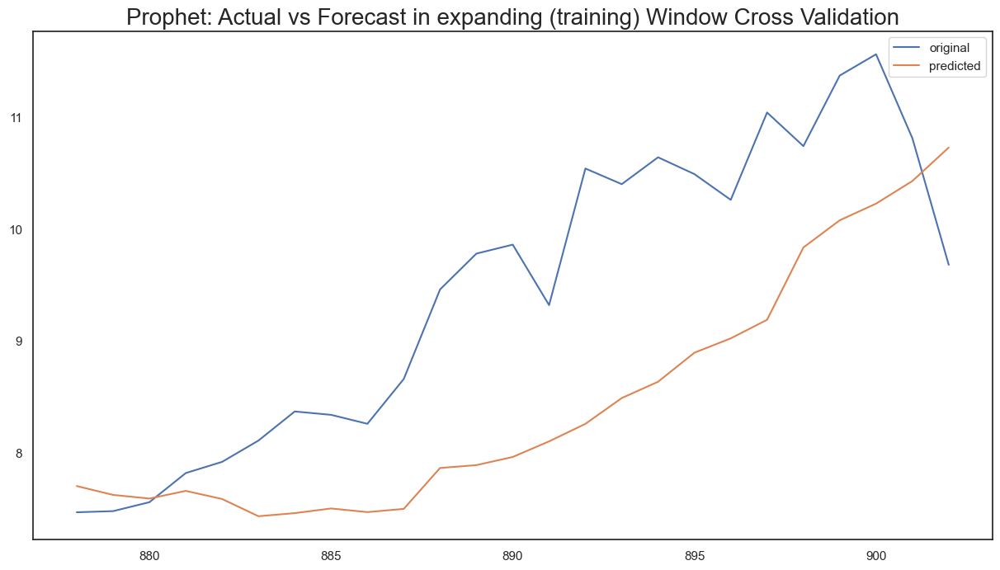

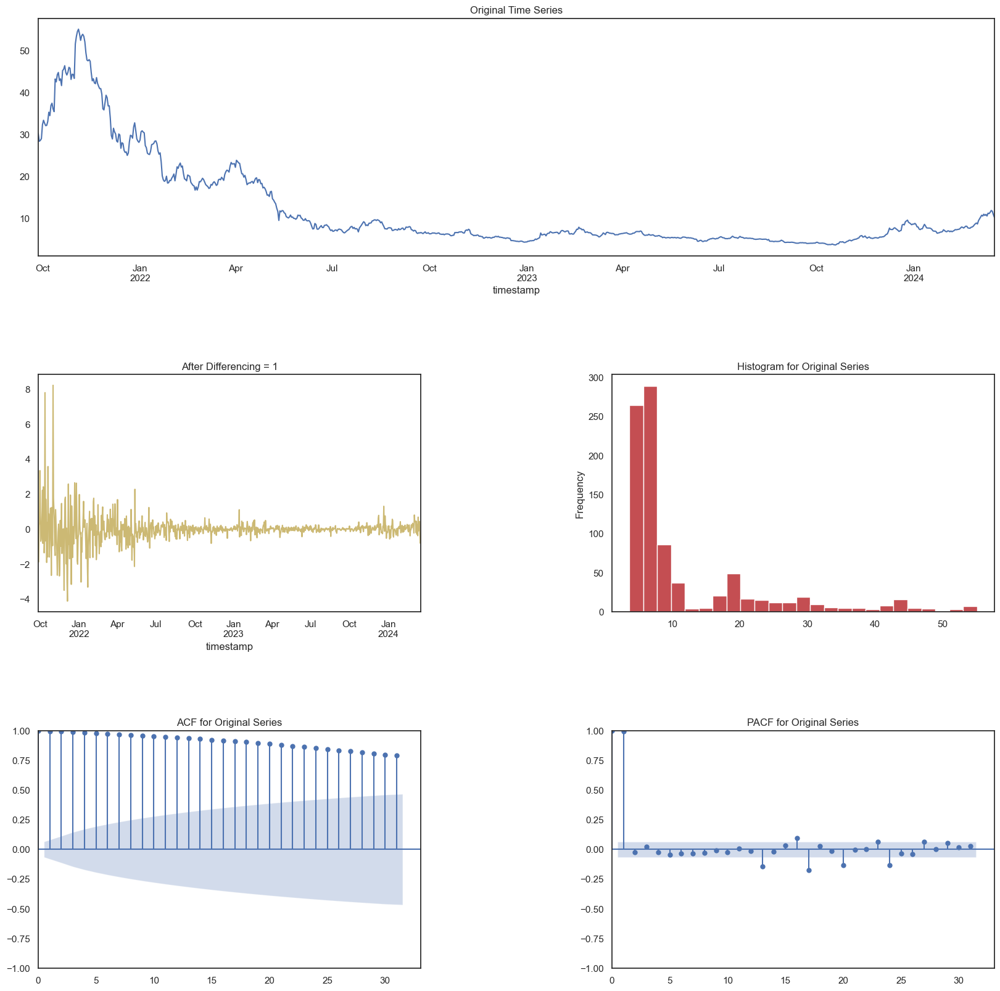

19:45:10 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:45:10 - cmdstanpy - INFO - Chain [1] done processing
19:45:11 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 0.26
    Std Deviation of actuals = 0.17
    Normalized RMSE (as pct of std dev) = 147%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:45:11 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 0.69
    Std Deviation of actuals = 0.35
    Normalized RMSE (as pct of std dev) = 201%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:45:12 - cmdstanpy - INFO - Chain [1] start processing
19:45:12 - cmdstanpy - INFO - Chain [1] done processing
19:45:13 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 2.27
    Std Deviation of actuals = 0.38
    Normalized RMSE (as pct of std dev) = 598%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:45:13 - cmdstanpy - INFO - Chain [1] done processing
19:45:14 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 1.45
    Std Deviation of actuals = 0.26
    Normalized RMSE (as pct of std dev) = 563%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:45:14 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 0.93
    Std Deviation of actuals = 0.60
    Normalized RMSE (as pct of std dev) = 156%
Cross Validation window: 5 completed


19:45:15 - cmdstanpy - INFO - Chain [1] start processing



-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 1.07
    MSE (Mean Squared Error = 1.73
    MAPE (Mean Absolute Percent Error) = 10%
    RMSE (Root Mean Squared Error) = 1.3160
    Normalized RMSE (MinMax) = 31%
    Normalized RMSE (as Std Dev of Actuals)= 95%
Time Taken = 4 seconds


19:45:15 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 1.12


--------------------------------------------------
Total time taken: 10 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet  1.12
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------------

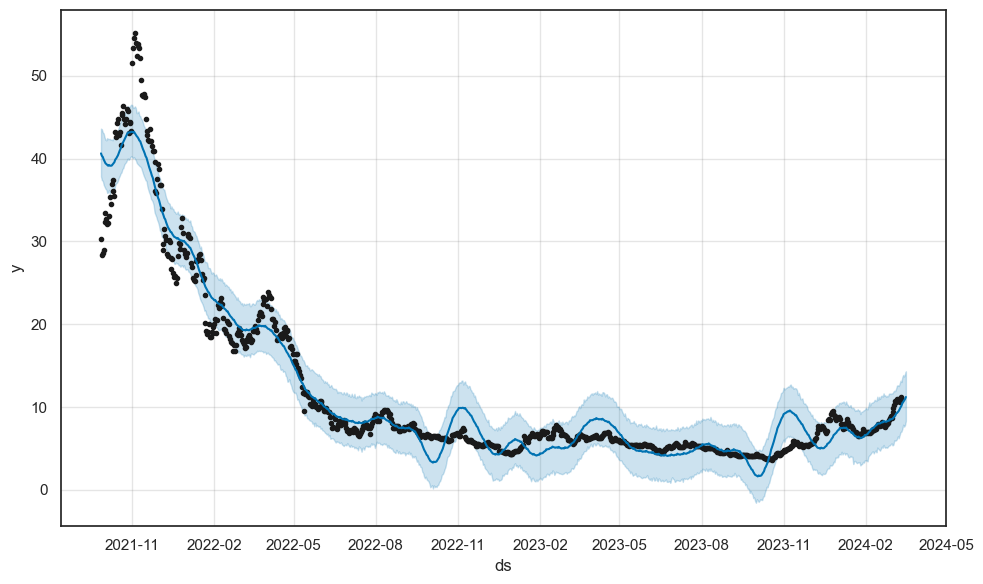

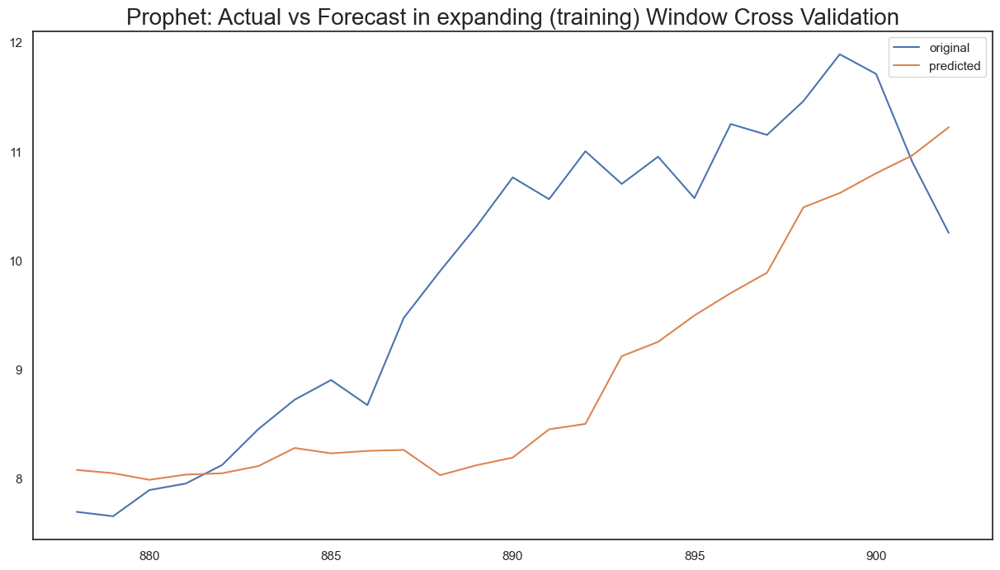

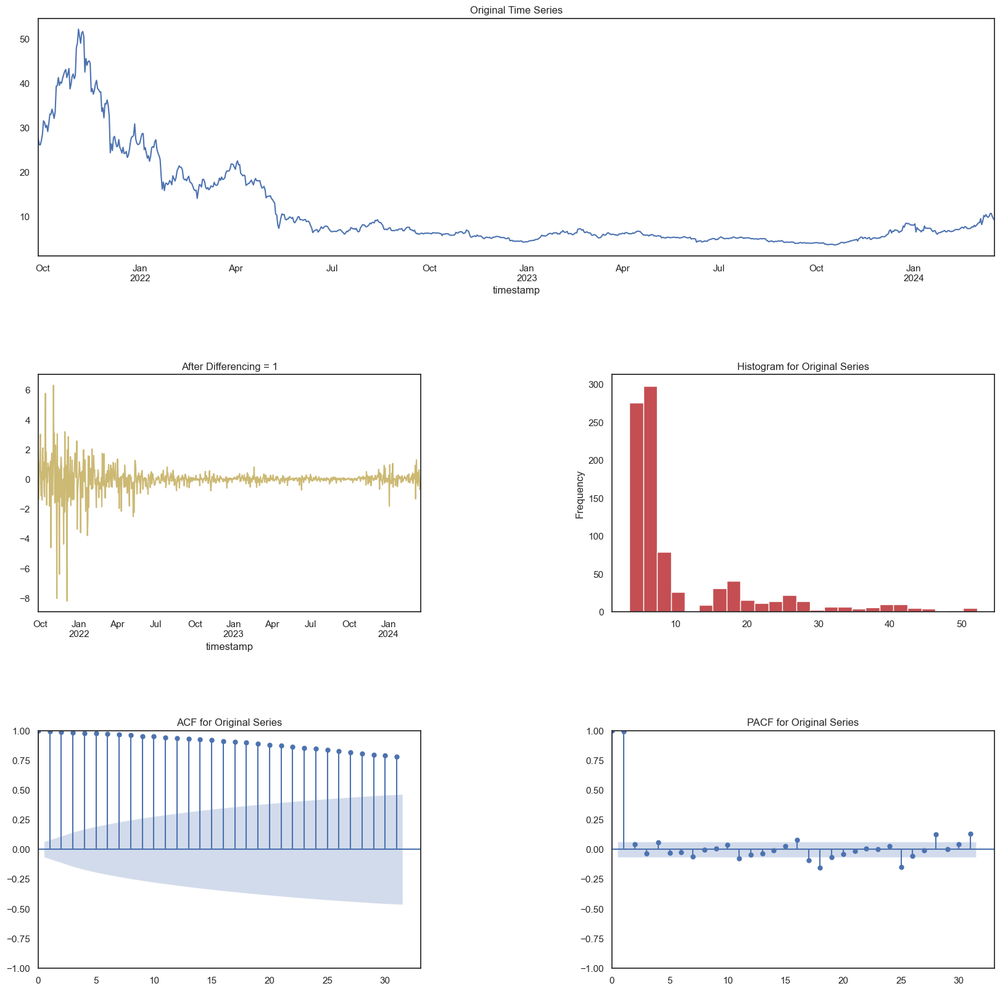

19:45:19 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:45:20 - cmdstanpy - INFO - Chain [1] done processing
19:45:20 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 0.21
    Std Deviation of actuals = 0.16
    Normalized RMSE (as pct of std dev) = 128%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:45:20 - cmdstanpy - INFO - Chain [1] done processing
19:45:21 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 0.97
    Std Deviation of actuals = 0.29
    Normalized RMSE (as pct of std dev) = 333%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:45:21 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 1.36
    Std Deviation of actuals = 0.72
    Normalized RMSE (as pct of std dev) = 190%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:45:22 - cmdstanpy - INFO - Chain [1] start processing
19:45:22 - cmdstanpy - INFO - Chain [1] done processing
19:45:22 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 1.25
    Std Deviation of actuals = 0.21
    Normalized RMSE (as pct of std dev) = 608%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:45:22 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 0.96
    Std Deviation of actuals = 0.60
    Normalized RMSE (as pct of std dev) = 161%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 0.87
    MSE (Mean Squared Error = 1.07
    MAPE (Mean Absolute Percent Error) = 9%
    RMSE (Root Mean Squared Error) = 1.0323
    Normalized RMSE (MinMax) = 30%
    Normalized RMSE (as Std Dev of Actuals)= 90%
Time Taken = 4 seconds


19:45:23 - cmdstanpy - INFO - Chain [1] start processing
19:45:23 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 0.95


--------------------------------------------------
Total time taken: 9 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet  0.95
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+-------------------

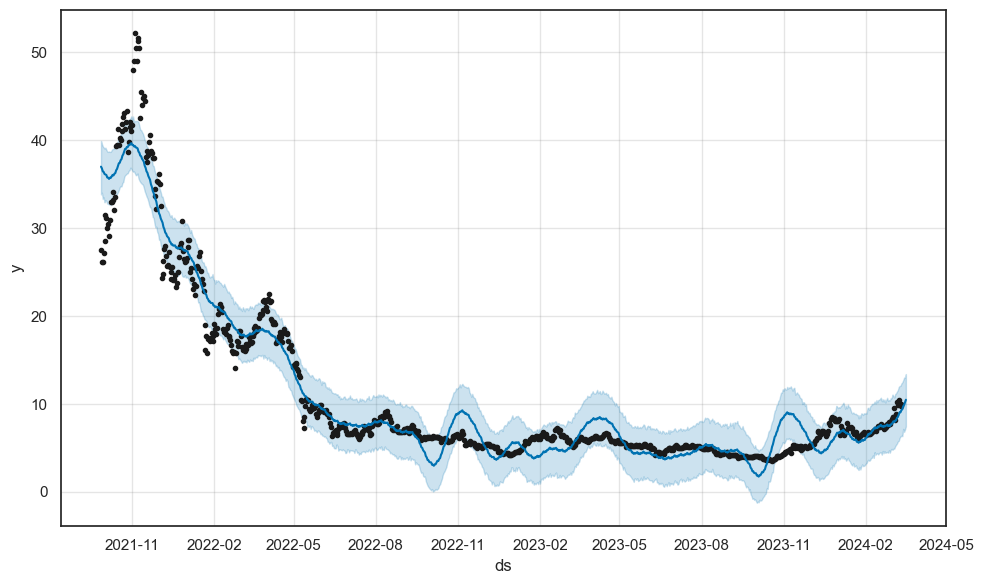

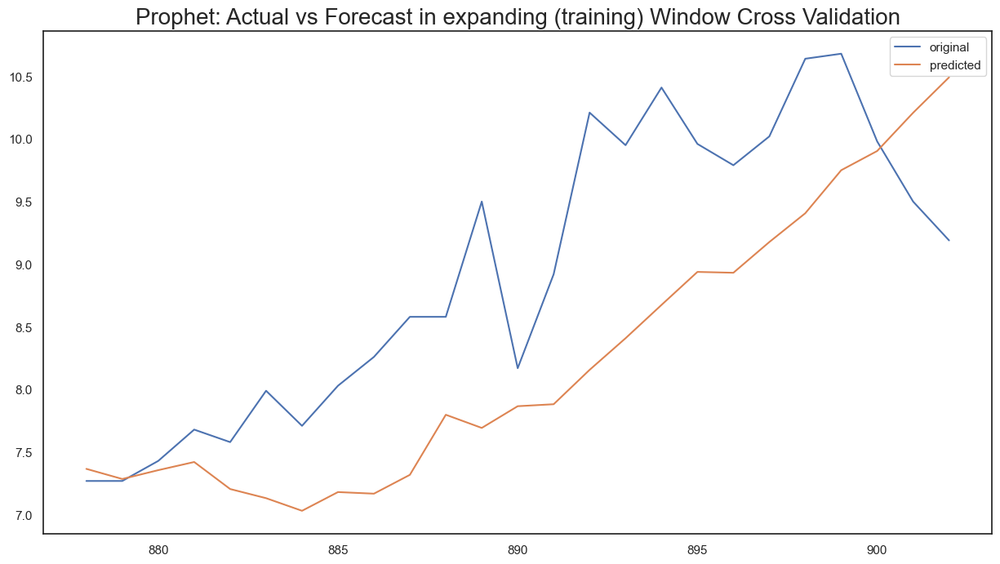

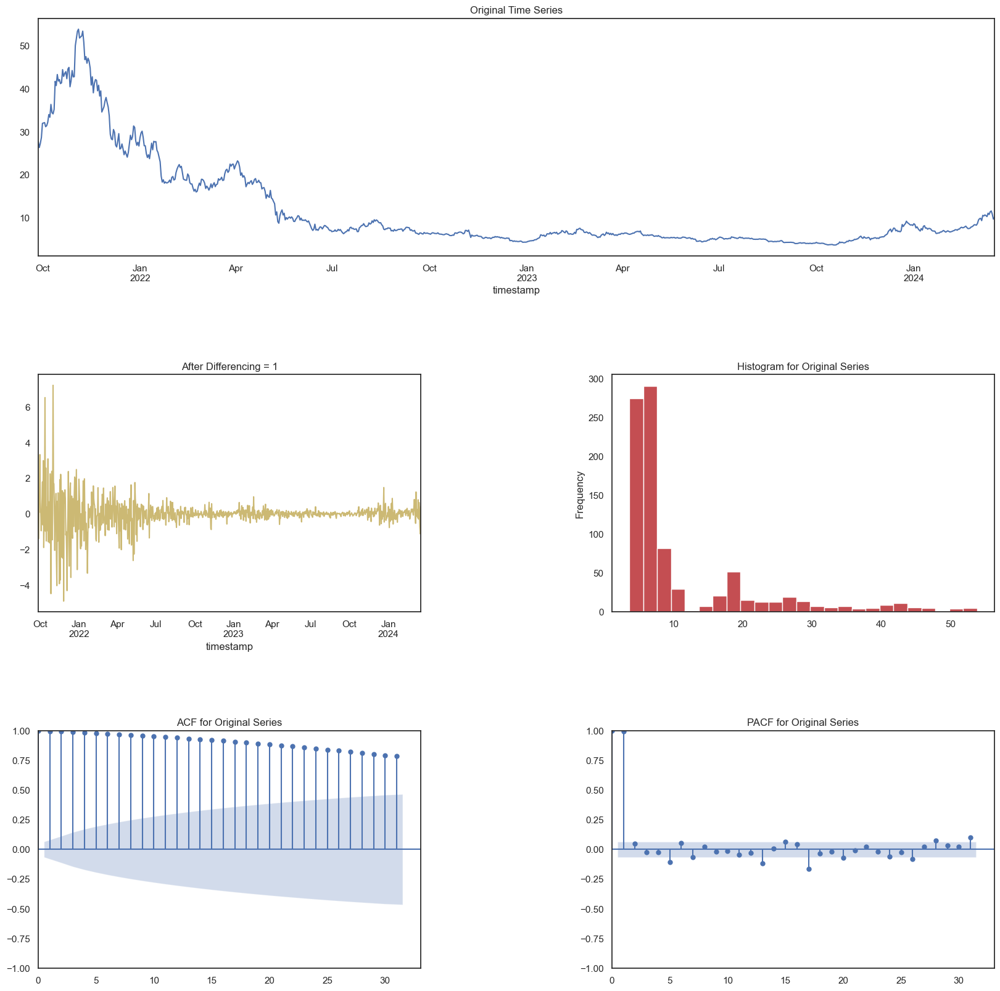

19:45:29 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:45:29 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 0.32
    Std Deviation of actuals = 0.23
    Normalized RMSE (as pct of std dev) = 136%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:45:30 - cmdstanpy - INFO - Chain [1] start processing
19:45:30 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 1.44
    Std Deviation of actuals = 0.44
    Normalized RMSE (as pct of std dev) = 325%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:45:31 - cmdstanpy - INFO - Chain [1] start processing
19:45:31 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 1.02
    Std Deviation of actuals = 0.44
    Normalized RMSE (as pct of std dev) = 230%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:45:32 - cmdstanpy - INFO - Chain [1] start processing
19:45:32 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 1.10
    Std Deviation of actuals = 0.26
    Normalized RMSE (as pct of std dev) = 425%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:45:34 - cmdstanpy - INFO - Chain [1] start processing
19:45:34 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 1.04
    Std Deviation of actuals = 0.72
    Normalized RMSE (as pct of std dev) = 144%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 0.91
    MSE (Mean Squared Error = 1.10
    MAPE (Mean Absolute Percent Error) = 9%
    RMSE (Root Mean Squared Error) = 1.0488
    Normalized RMSE (MinMax) = 26%
    Normalized RMSE (as Std Dev of Actuals)= 83%
Time Taken = 7 seconds


19:45:36 - cmdstanpy - INFO - Chain [1] start processing
19:45:36 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 0.98


--------------------------------------------------
Total time taken: 13 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet  0.98
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------------

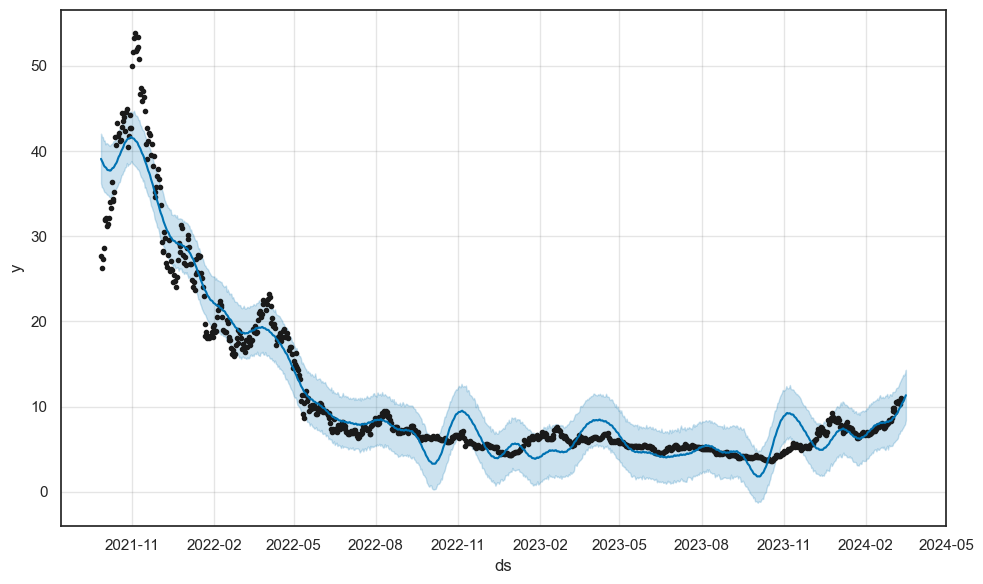

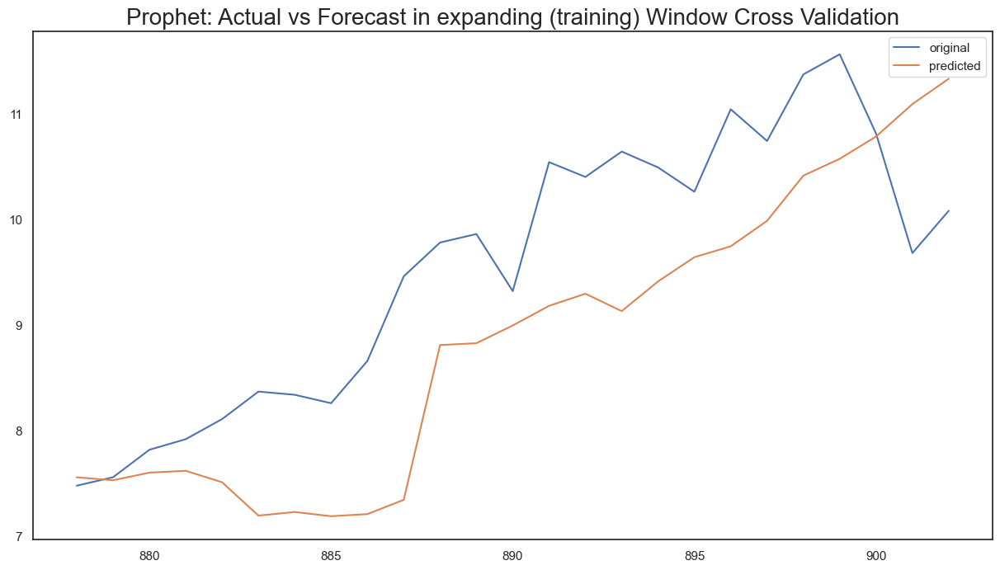

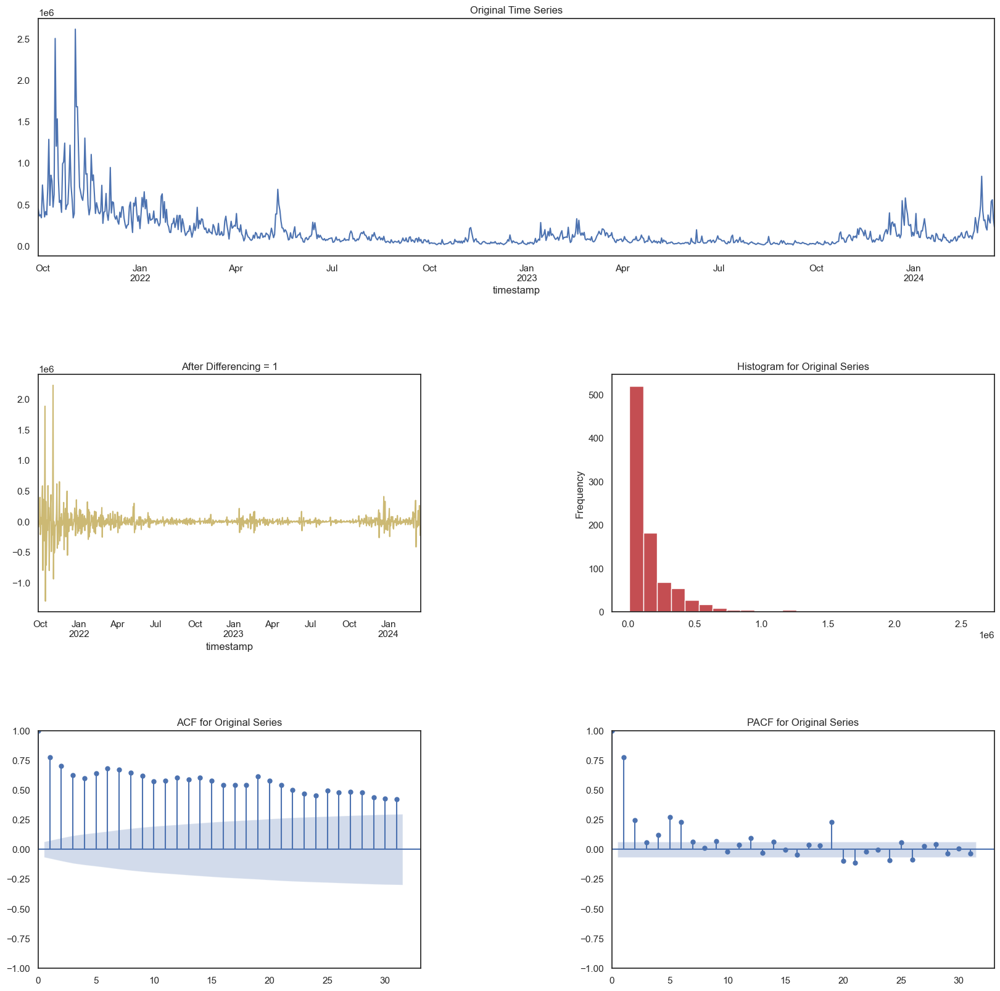

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:45:52 - cmdstanpy - INFO - Chain [1] start processing
19:45:52 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 53,067.98
    Std Deviation of actuals = 20,538.64
    Normalized RMSE (as pct of std dev) = 258%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:45:54 - cmdstanpy - INFO - Chain [1] start processing
19:45:54 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 89,263.68
    Std Deviation of actuals = 68,505.83
    Normalized RMSE (as pct of std dev) = 130%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:45:56 - cmdstanpy - INFO - Chain [1] start processing
19:45:56 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 339,354.84
    Std Deviation of actuals = 187,865.52
    Normalized RMSE (as pct of std dev) = 181%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:45:57 - cmdstanpy - INFO - Chain [1] start processing
19:45:57 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 65,418.32
    Std Deviation of actuals = 65,385.18
    Normalized RMSE (as pct of std dev) = 100%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:45:59 - cmdstanpy - INFO - Chain [1] start processing
19:45:59 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 191,350.58
    Std Deviation of actuals = 135,353.03
    Normalized RMSE (as pct of std dev) = 141%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 120453.80
    MSE (Mean Squared Error = 33368104433.18
    MAPE (Mean Absolute Percent Error) = 34%
    RMSE (Root Mean Squared Error) = 182669.3856
    Normalized RMSE (MinMax) = 24%
    Normalized RMSE (as Std Dev of Actuals)= 106%
Time Taken = 9 seconds


19:46:01 - cmdstanpy - INFO - Chain [1] start processing
19:46:01 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 147691.08


--------------------------------------------------
Total time taken: 25 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name      rmse
0  Prophet 147691.08
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+-----

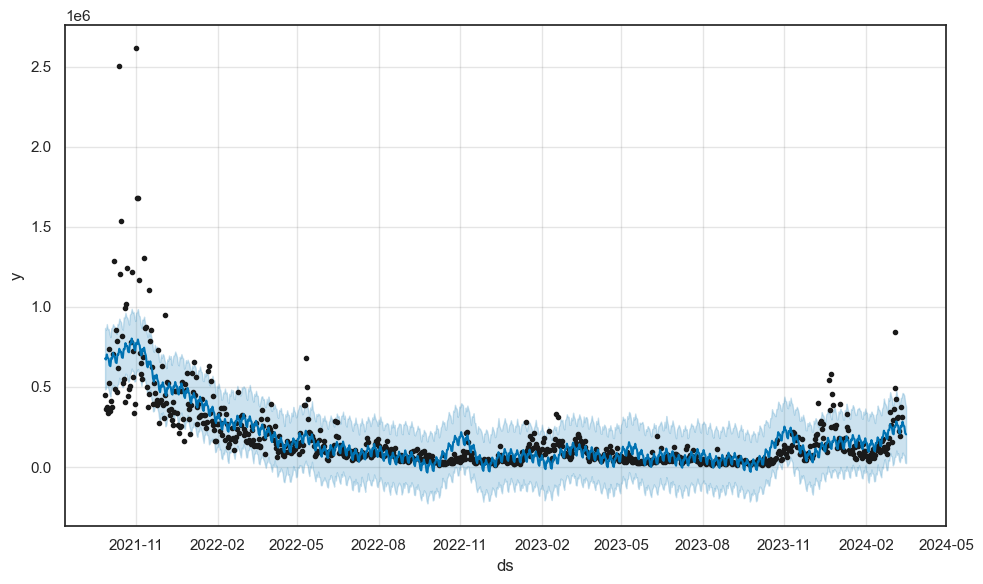

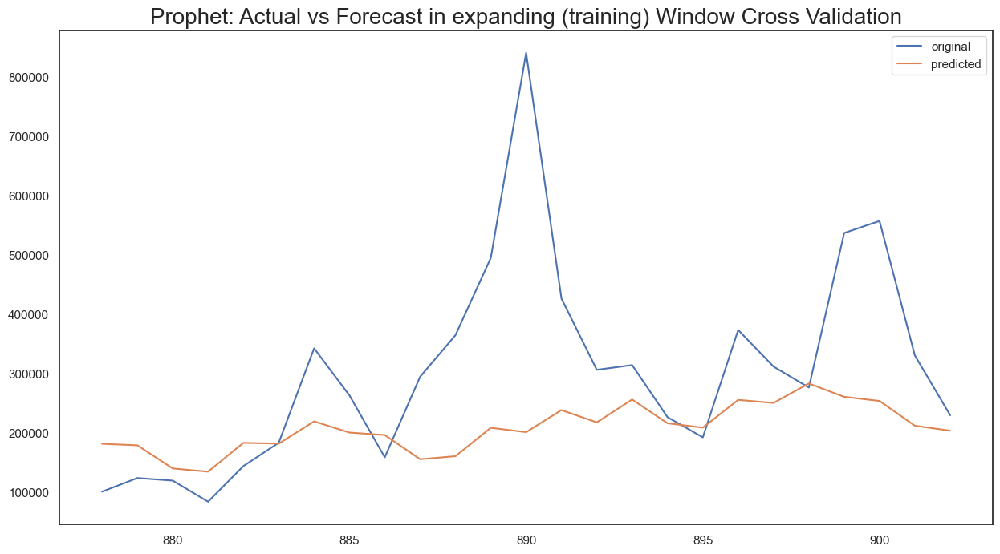

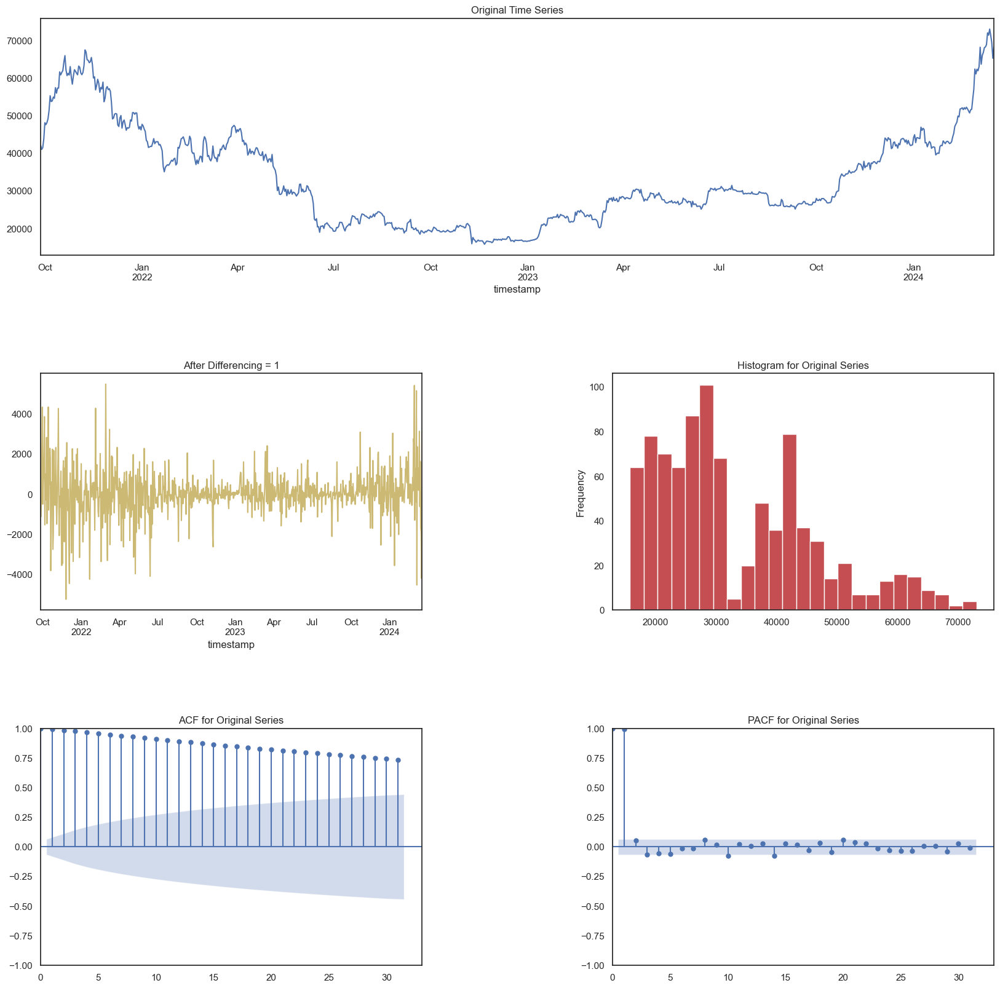

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:46:16 - cmdstanpy - INFO - Chain [1] start processing
19:46:16 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 1,616.46
    Std Deviation of actuals = 1,301.45
    Normalized RMSE (as pct of std dev) = 124%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:46:17 - cmdstanpy - INFO - Chain [1] start processing
19:46:18 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 9,818.36
    Std Deviation of actuals = 2,033.30
    Normalized RMSE (as pct of std dev) = 483%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:46:19 - cmdstanpy - INFO - Chain [1] start processing
19:46:19 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 11,304.60
    Std Deviation of actuals = 1,919.39
    Normalized RMSE (as pct of std dev) = 589%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:46:21 - cmdstanpy - INFO - Chain [1] start processing
19:46:21 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 12,764.73
    Std Deviation of actuals = 1,652.21
    Normalized RMSE (as pct of std dev) = 773%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:46:22 - cmdstanpy - INFO - Chain [1] start processing
19:46:22 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 7,341.14
    Std Deviation of actuals = 2,652.71
    Normalized RMSE (as pct of std dev) = 277%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 8239.76
    MSE (Mean Squared Error = 88727564.77
    MAPE (Mean Absolute Percent Error) = 12%
    RMSE (Root Mean Squared Error) = 9419.5310
    Normalized RMSE (MinMax) = 42%
    Normalized RMSE (as Std Dev of Actuals)= 134%
Time Taken = 8 seconds


19:46:24 - cmdstanpy - INFO - Chain [1] start processing
19:46:24 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 8569.06


--------------------------------------------------
Total time taken: 23 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name    rmse
0  Prophet 8569.06
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+-----------

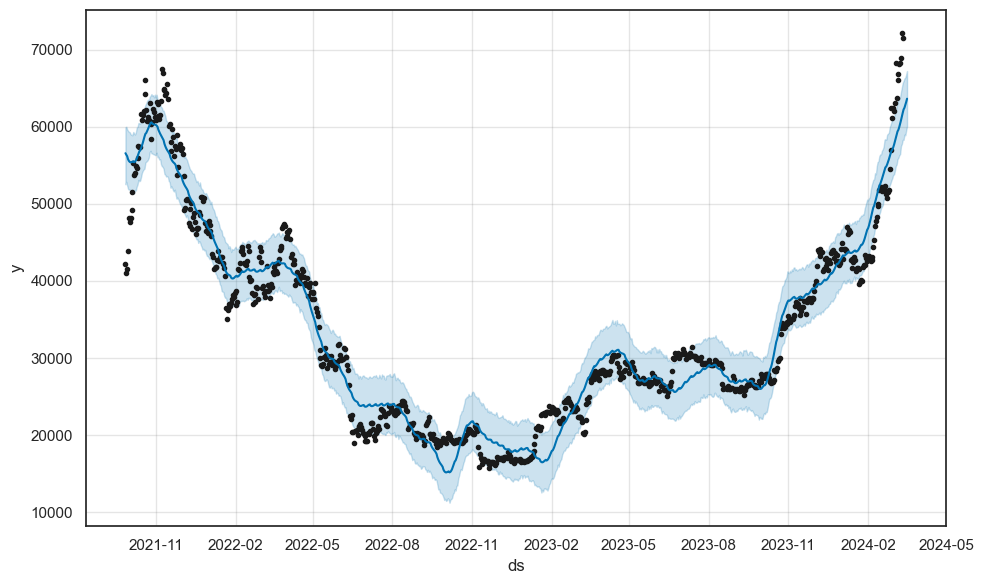

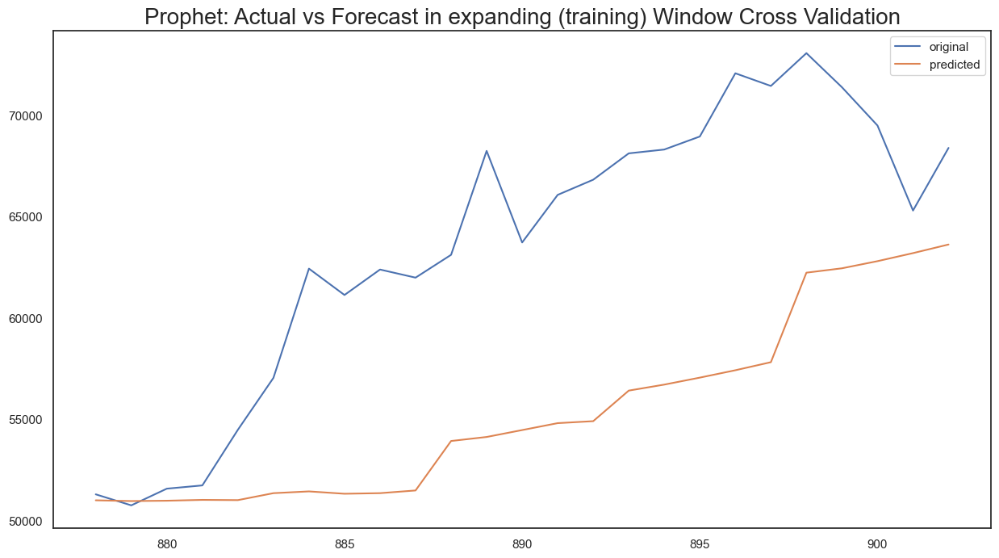

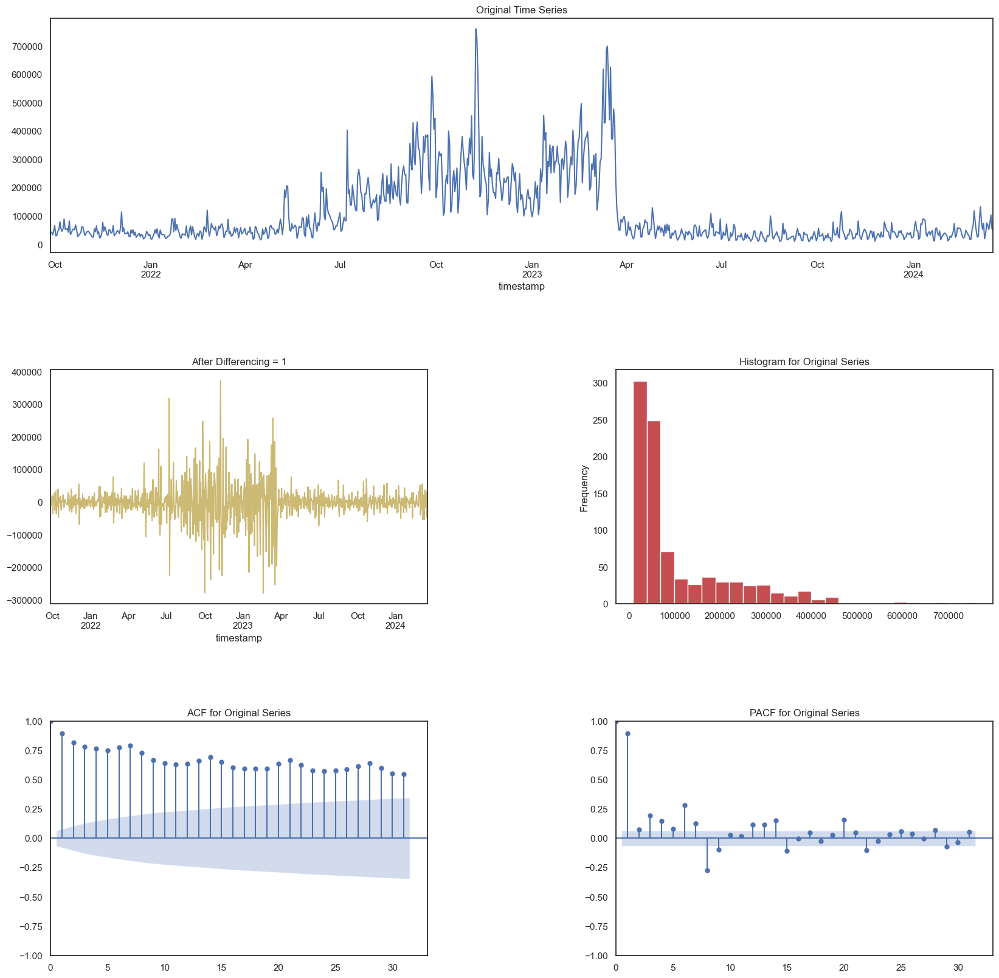

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:46:33 - cmdstanpy - INFO - Chain [1] start processing
19:46:34 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 13,122.63
    Std Deviation of actuals = 12,546.03
    Normalized RMSE (as pct of std dev) = 105%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:46:35 - cmdstanpy - INFO - Chain [1] start processing
19:46:35 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 25,095.12
    Std Deviation of actuals = 31,301.79
    Normalized RMSE (as pct of std dev) = 80%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:46:36 - cmdstanpy - INFO - Chain [1] start processing
19:46:36 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 26,699.75
    Std Deviation of actuals = 34,742.63
    Normalized RMSE (as pct of std dev) = 77%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:46:38 - cmdstanpy - INFO - Chain [1] start processing
19:46:38 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 18,775.26
    Std Deviation of actuals = 22,278.25
    Normalized RMSE (as pct of std dev) = 84%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:46:39 - cmdstanpy - INFO - Chain [1] start processing
19:46:40 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 27,555.47
    Std Deviation of actuals = 19,841.30
    Normalized RMSE (as pct of std dev) = 139%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 18901.83
    MSE (Mean Squared Error = 525331888.57
    MAPE (Mean Absolute Percent Error) = 38%
    RMSE (Root Mean Squared Error) = 22920.1197
    Normalized RMSE (MinMax) = 20%
    Normalized RMSE (as Std Dev of Actuals)= 75%
Time Taken = 9 seconds


19:46:42 - cmdstanpy - INFO - Chain [1] start processing
19:46:43 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 22249.65


--------------------------------------------------
Total time taken: 19 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name     rmse
0  Prophet 22249.65
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+--------

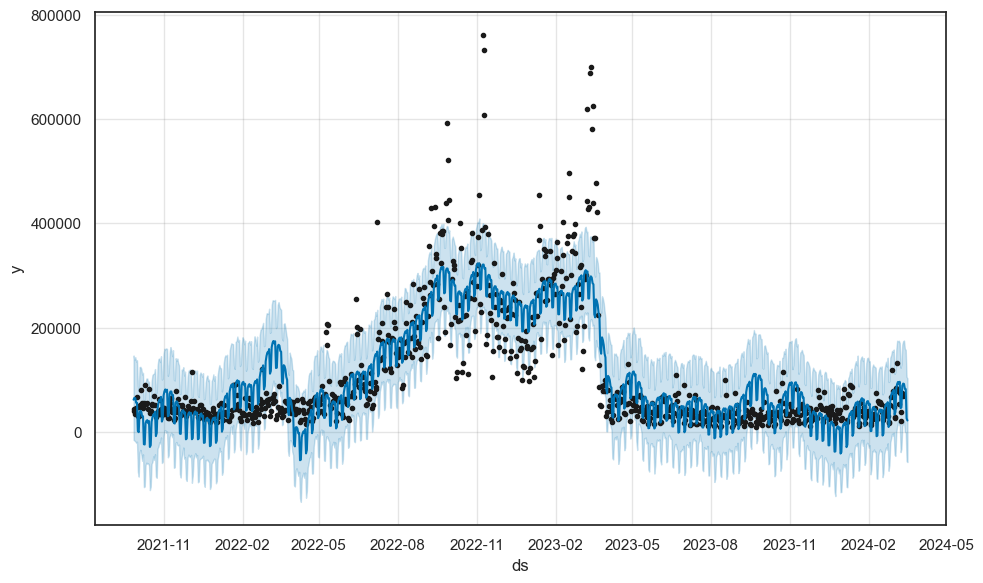

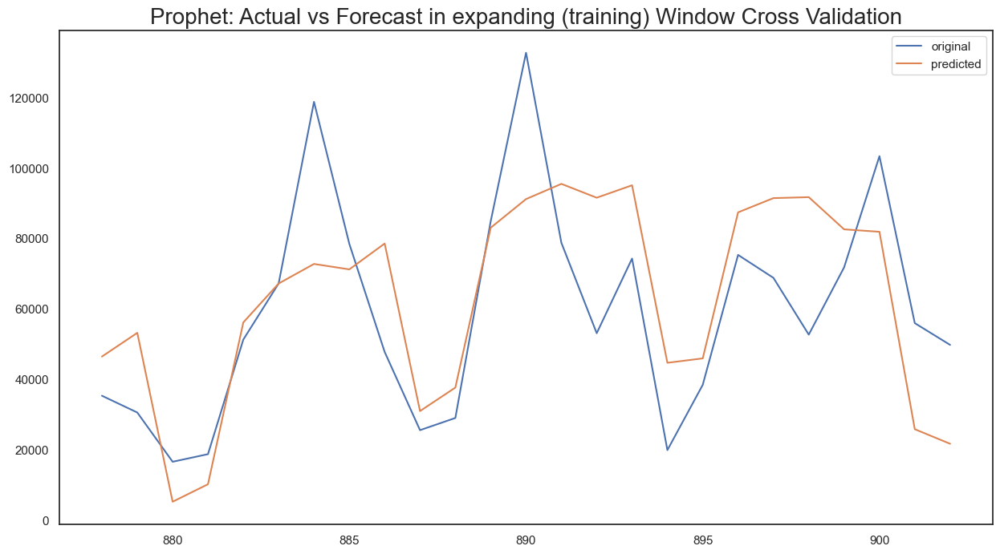

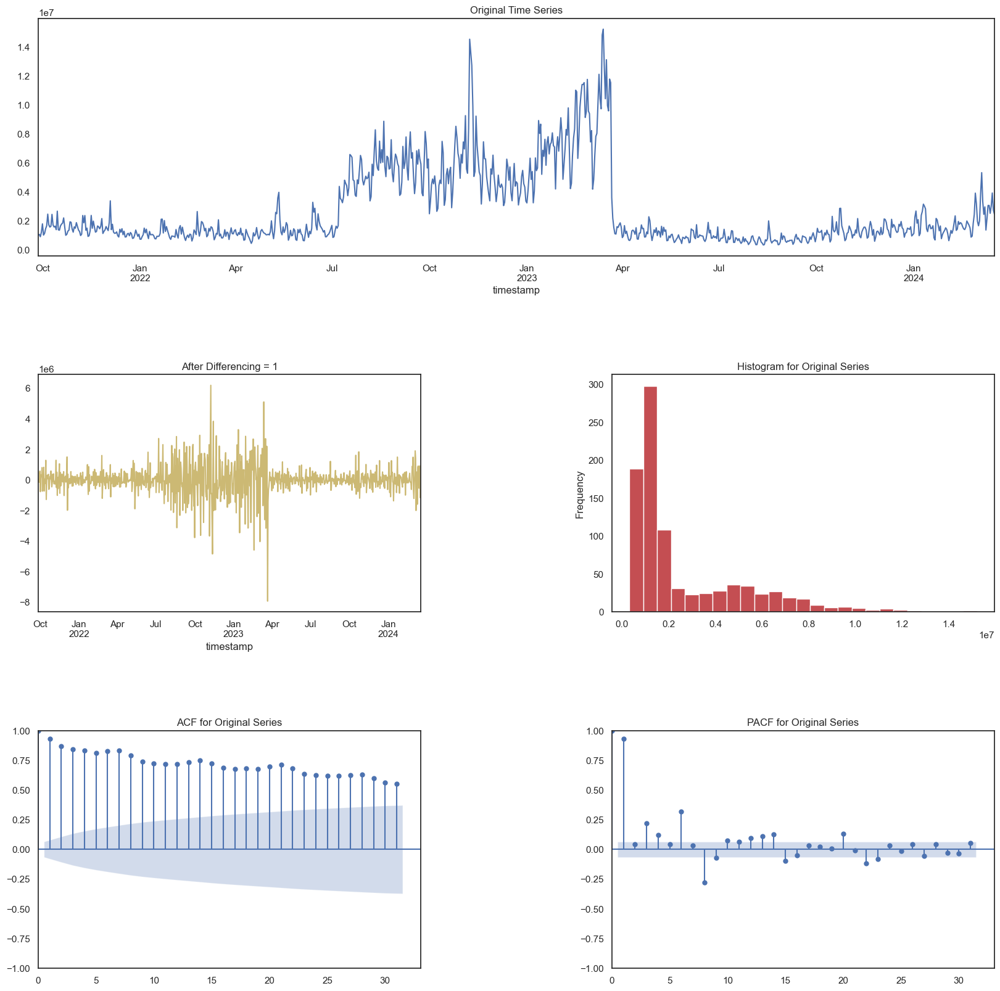

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:47:08 - cmdstanpy - INFO - Chain [1] start processing
19:47:08 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 1,051,629.86
    Std Deviation of actuals = 392,480.32
    Normalized RMSE (as pct of std dev) = 268%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:47:09 - cmdstanpy - INFO - Chain [1] start processing
19:47:10 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 744,065.72
    Std Deviation of actuals = 822,062.53
    Normalized RMSE (as pct of std dev) = 91%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:47:11 - cmdstanpy - INFO - Chain [1] start processing
19:47:11 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 1,049,165.55
    Std Deviation of actuals = 1,168,226.24
    Normalized RMSE (as pct of std dev) = 90%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:47:12 - cmdstanpy - INFO - Chain [1] start processing
19:47:12 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 472,291.01
    Std Deviation of actuals = 671,663.21
    Normalized RMSE (as pct of std dev) = 70%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:47:13 - cmdstanpy - INFO - Chain [1] start processing
19:47:13 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 945,839.81
    Std Deviation of actuals = 530,699.58
    Normalized RMSE (as pct of std dev) = 178%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 727142.54
    MSE (Mean Squared Error = 775595848874.11
    MAPE (Mean Absolute Percent Error) = 37%
    RMSE (Root Mean Squared Error) = 880679.1975
    Normalized RMSE (MinMax) = 20%
    Normalized RMSE (as Std Dev of Actuals)= 85%
Time Taken = 7 seconds


19:47:15 - cmdstanpy - INFO - Chain [1] start processing
19:47:15 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 852598.39


--------------------------------------------------
Total time taken: 32 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name      rmse
0  Prophet 852598.39
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+-----

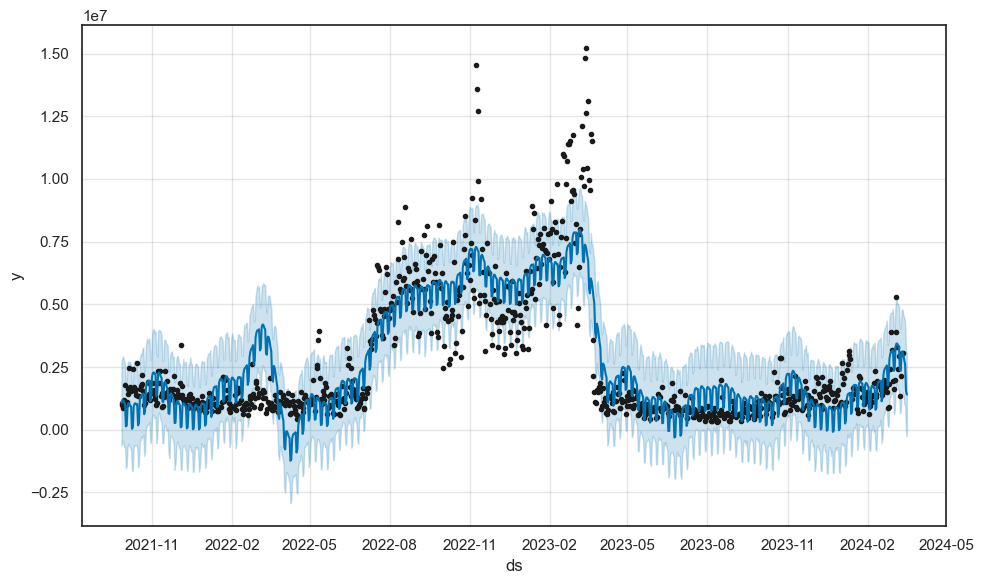

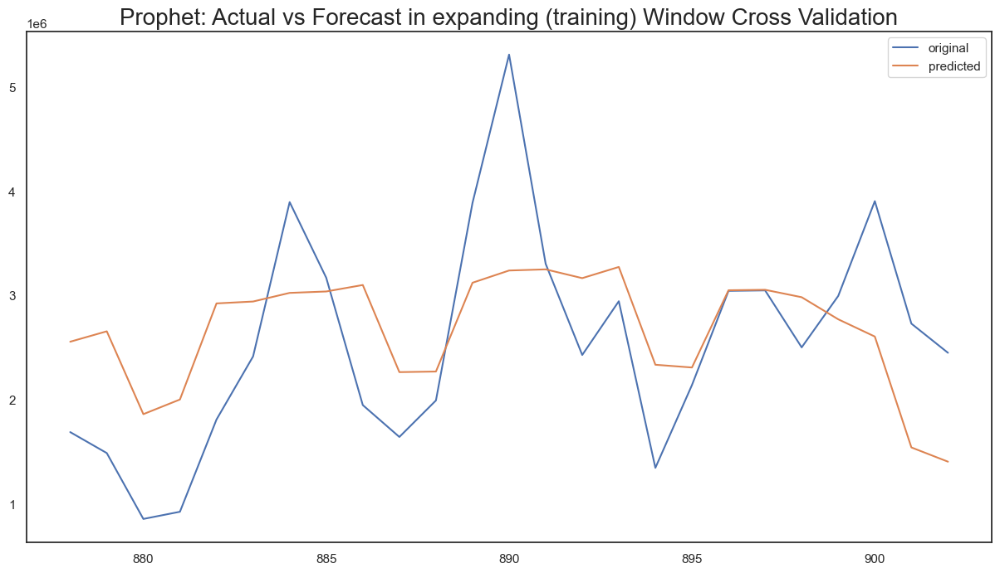

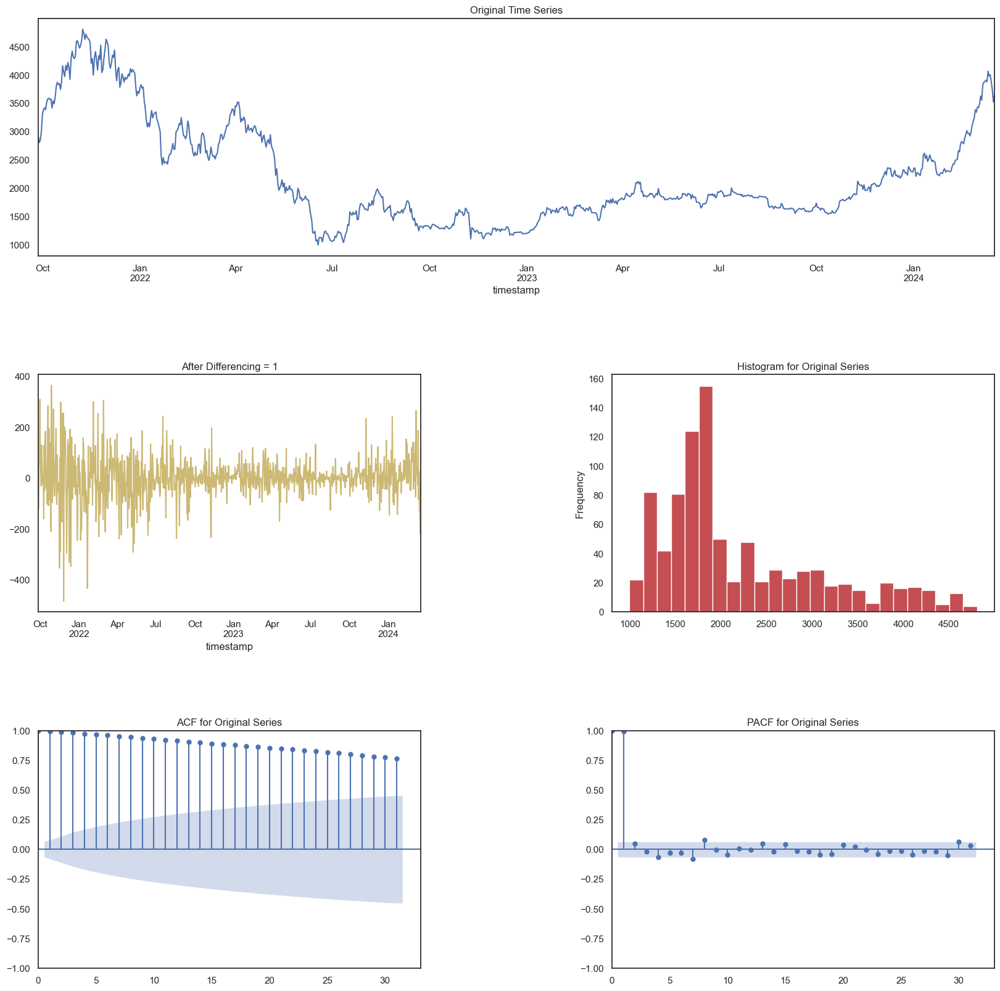

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:47:35 - cmdstanpy - INFO - Chain [1] start processing
19:47:36 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 509.85
    Std Deviation of actuals = 94.28
    Normalized RMSE (as pct of std dev) = 541%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:47:37 - cmdstanpy - INFO - Chain [1] start processing
19:47:37 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 729.87
    Std Deviation of actuals = 69.06
    Normalized RMSE (as pct of std dev) = 1057%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:47:39 - cmdstanpy - INFO - Chain [1] start processing
19:47:39 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 924.25
    Std Deviation of actuals = 148.39
    Normalized RMSE (as pct of std dev) = 623%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:47:40 - cmdstanpy - INFO - Chain [1] start processing
19:47:40 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 923.14
    Std Deviation of actuals = 71.20
    Normalized RMSE (as pct of std dev) = 1297%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:47:41 - cmdstanpy - INFO - Chain [1] start processing
19:47:42 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 491.37
    Std Deviation of actuals = 169.98
    Normalized RMSE (as pct of std dev) = 289%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 701.40
    MSE (Mean Squared Error = 548104.85
    MAPE (Mean Absolute Percent Error) = 20%
    RMSE (Root Mean Squared Error) = 740.3410
    Normalized RMSE (MinMax) = 65%
    Normalized RMSE (as Std Dev of Actuals)= 213%
Time Taken = 8 seconds


19:47:44 - cmdstanpy - INFO - Chain [1] start processing
19:47:45 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 715.70


--------------------------------------------------
Total time taken: 30 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name   rmse
0  Prophet 715.70
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+--------------

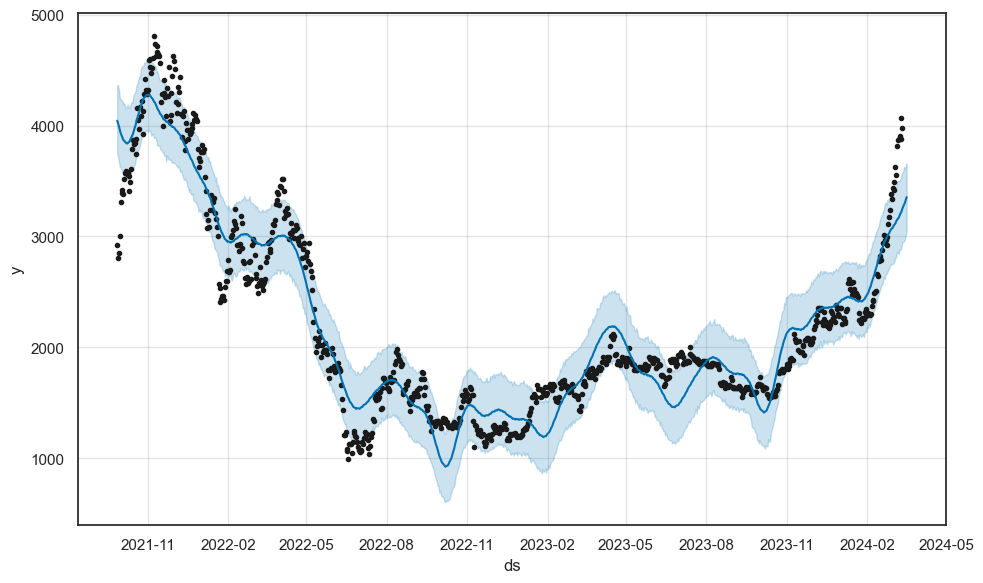

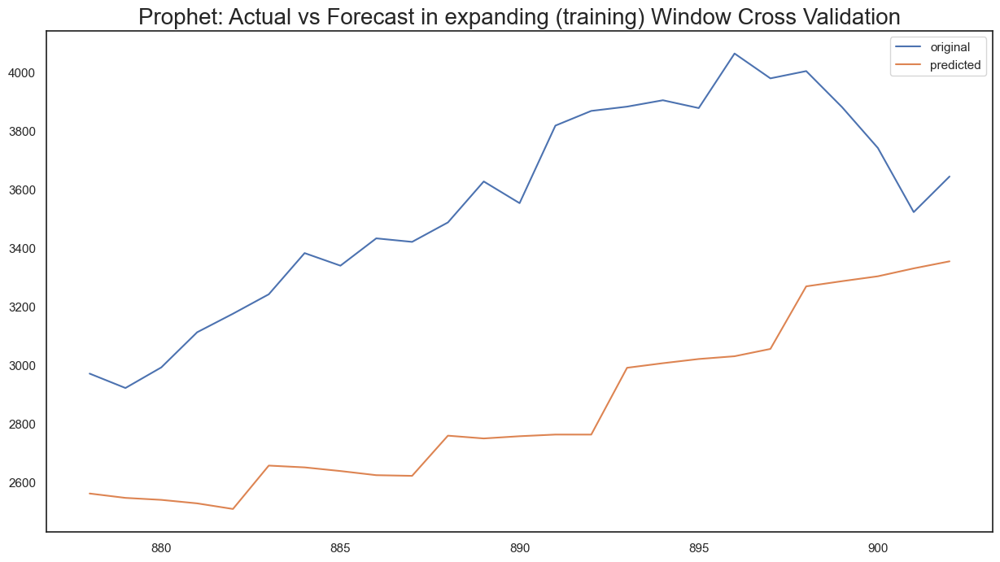

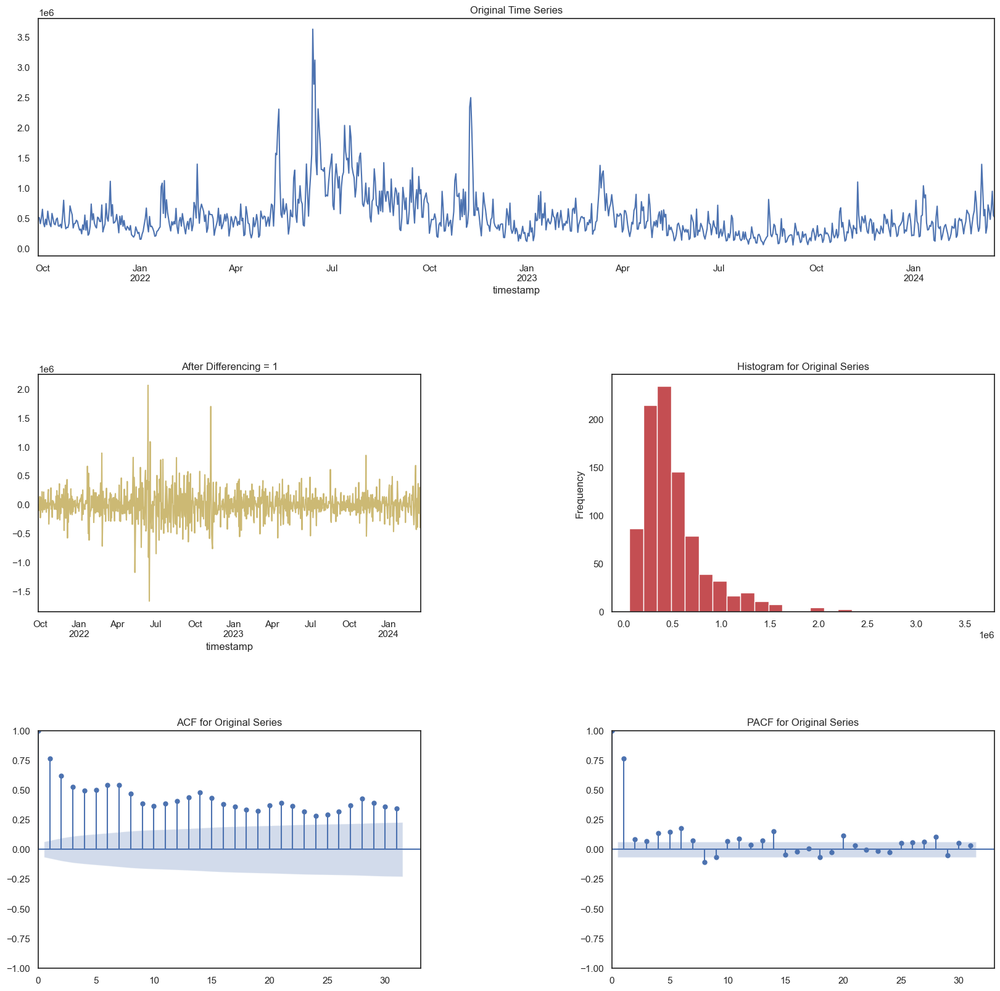

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:47:57 - cmdstanpy - INFO - Chain [1] start processing
19:47:57 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 116,723.86
    Std Deviation of actuals = 114,898.99
    Normalized RMSE (as pct of std dev) = 102%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:47:58 - cmdstanpy - INFO - Chain [1] start processing
19:47:59 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 179,614.90
    Std Deviation of actuals = 237,357.86
    Normalized RMSE (as pct of std dev) = 76%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:47:59 - cmdstanpy - INFO - Chain [1] start processing
19:48:00 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 367,878.23
    Std Deviation of actuals = 364,529.15
    Normalized RMSE (as pct of std dev) = 101%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:48:01 - cmdstanpy - INFO - Chain [1] start processing
19:48:01 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 115,892.31
    Std Deviation of actuals = 182,362.67
    Normalized RMSE (as pct of std dev) = 64%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:48:02 - cmdstanpy - INFO - Chain [1] start processing
19:48:02 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 167,267.39
    Std Deviation of actuals = 168,663.61
    Normalized RMSE (as pct of std dev) = 99%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 148516.27
    MSE (Mean Squared Error = 44525955099.48
    MAPE (Mean Absolute Percent Error) = 27%
    RMSE (Root Mean Squared Error) = 211011.7416
    Normalized RMSE (MinMax) = 18%
    Normalized RMSE (as Std Dev of Actuals)= 80%
Time Taken = 7 seconds


19:48:03 - cmdstanpy - INFO - Chain [1] start processing
19:48:04 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 189475.34


--------------------------------------------------
Total time taken: 19 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name      rmse
0  Prophet 189475.34
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+-----

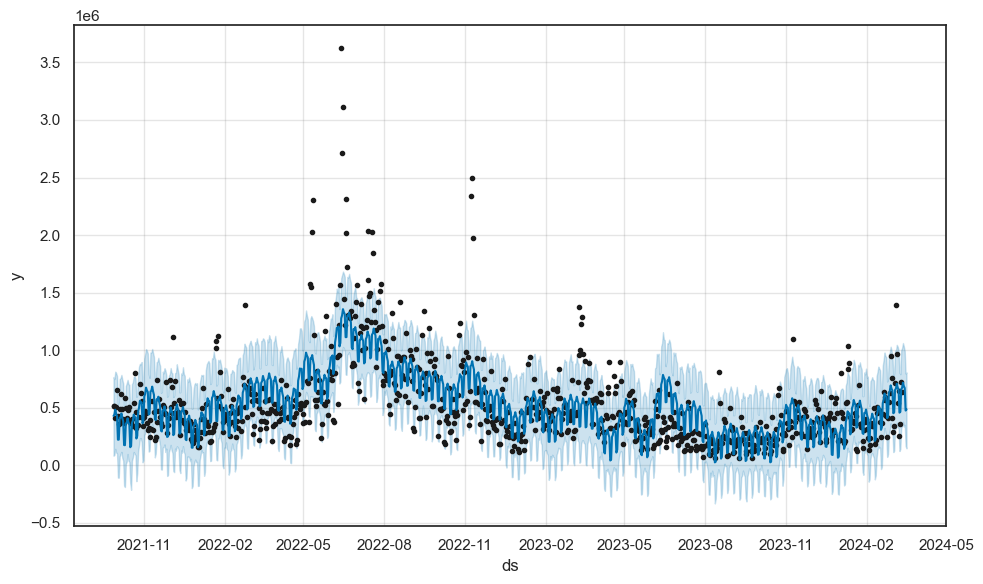

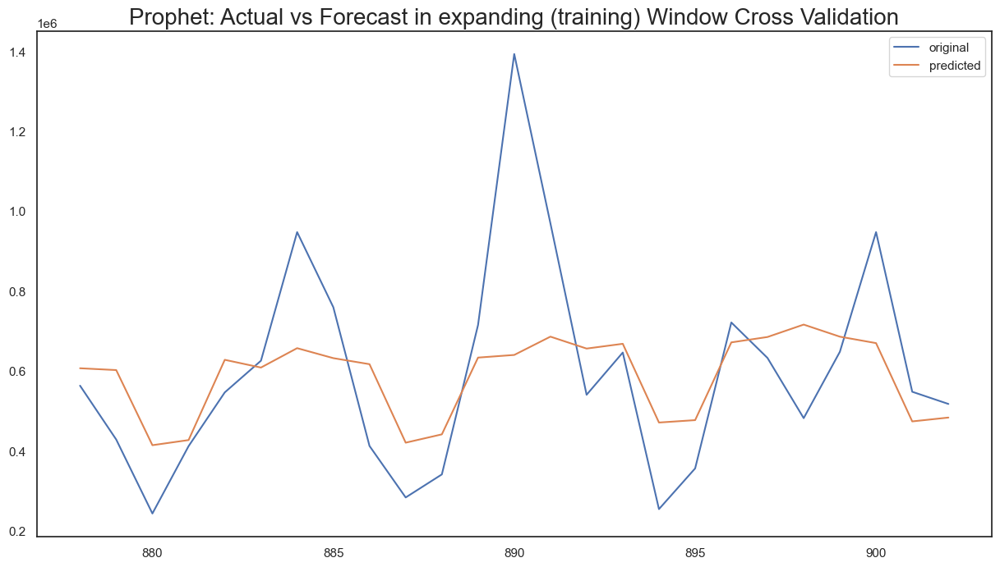

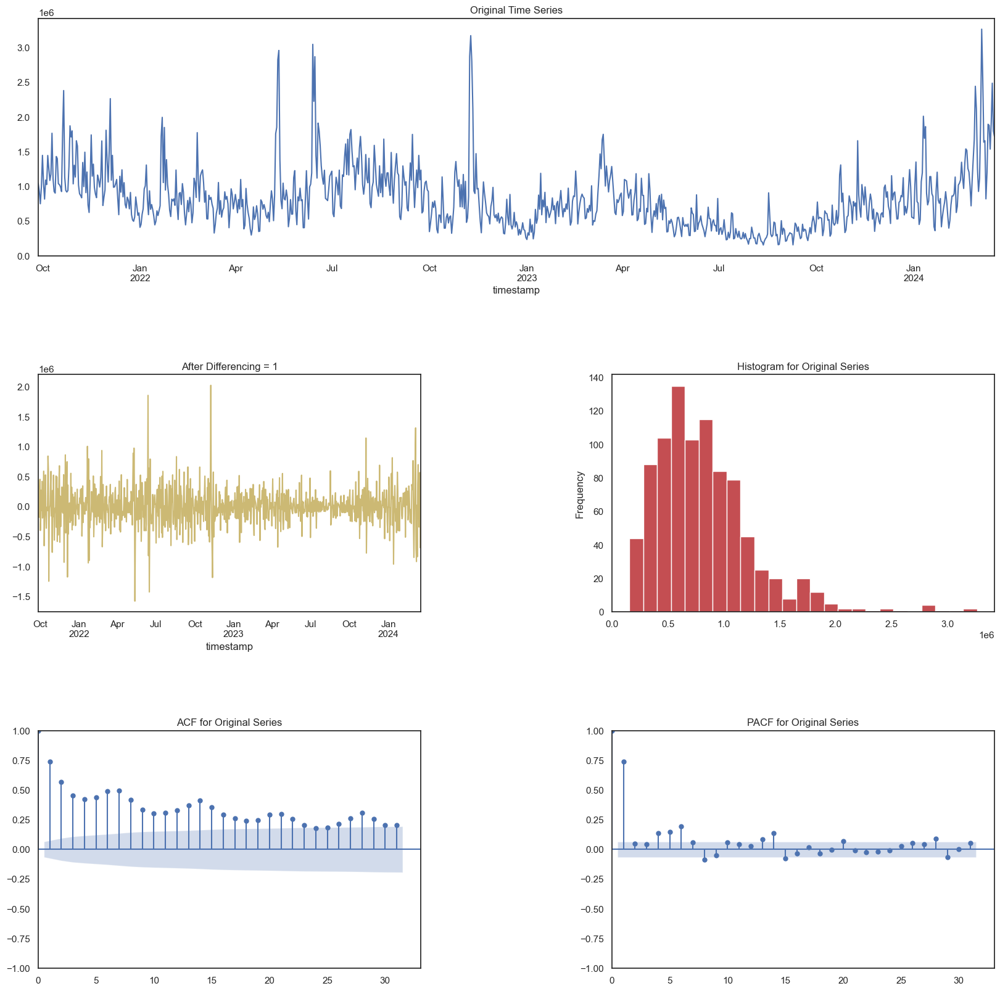

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:48:15 - cmdstanpy - INFO - Chain [1] start processing
19:48:16 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 173,906.17
    Std Deviation of actuals = 223,404.48
    Normalized RMSE (as pct of std dev) = 78%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:48:17 - cmdstanpy - INFO - Chain [1] start processing
19:48:17 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 719,548.02
    Std Deviation of actuals = 549,725.94
    Normalized RMSE (as pct of std dev) = 131%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:48:18 - cmdstanpy - INFO - Chain [1] start processing
19:48:18 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 1,122,058.75
    Std Deviation of actuals = 744,112.94
    Normalized RMSE (as pct of std dev) = 151%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:48:20 - cmdstanpy - INFO - Chain [1] start processing
19:48:20 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 373,202.63
    Std Deviation of actuals = 419,297.58
    Normalized RMSE (as pct of std dev) = 89%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:48:21 - cmdstanpy - INFO - Chain [1] start processing
19:48:21 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 625,047.16
    Std Deviation of actuals = 322,293.80
    Normalized RMSE (as pct of std dev) = 194%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 493621.33
    MSE (Mean Squared Error = 467394538165.80
    MAPE (Mean Absolute Percent Error) = 26%
    RMSE (Root Mean Squared Error) = 683662.5909
    Normalized RMSE (MinMax) = 27%
    Normalized RMSE (as Std Dev of Actuals)= 112%
Time Taken = 8 seconds


19:48:23 - cmdstanpy - INFO - Chain [1] start processing
19:48:23 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 602752.54


--------------------------------------------------
Total time taken: 20 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name      rmse
0  Prophet 602752.54
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+-----

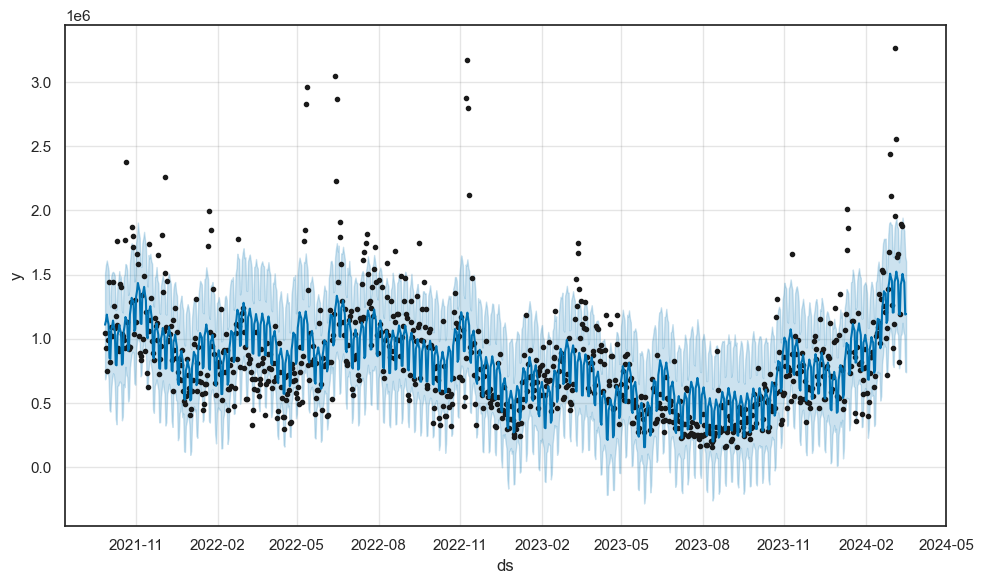

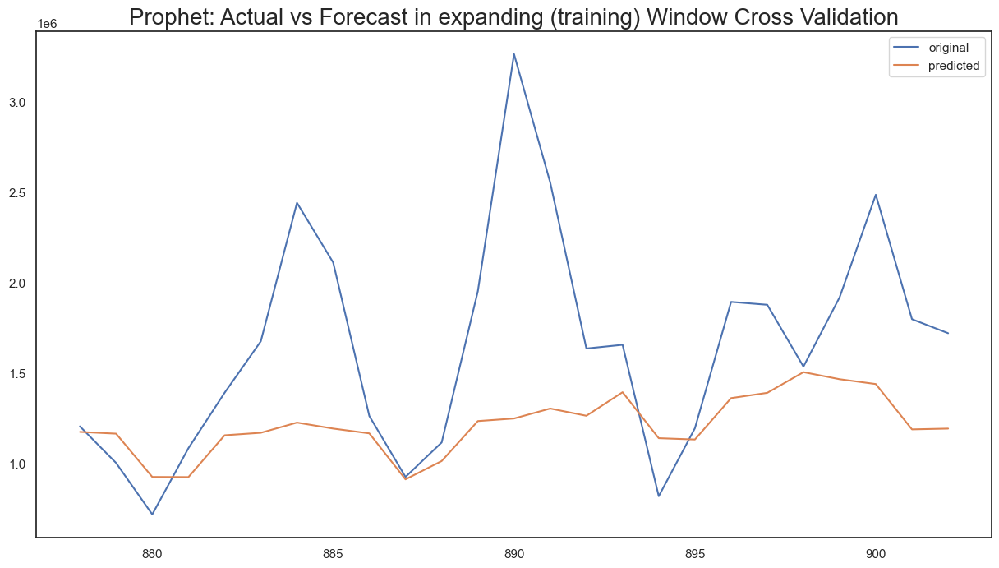

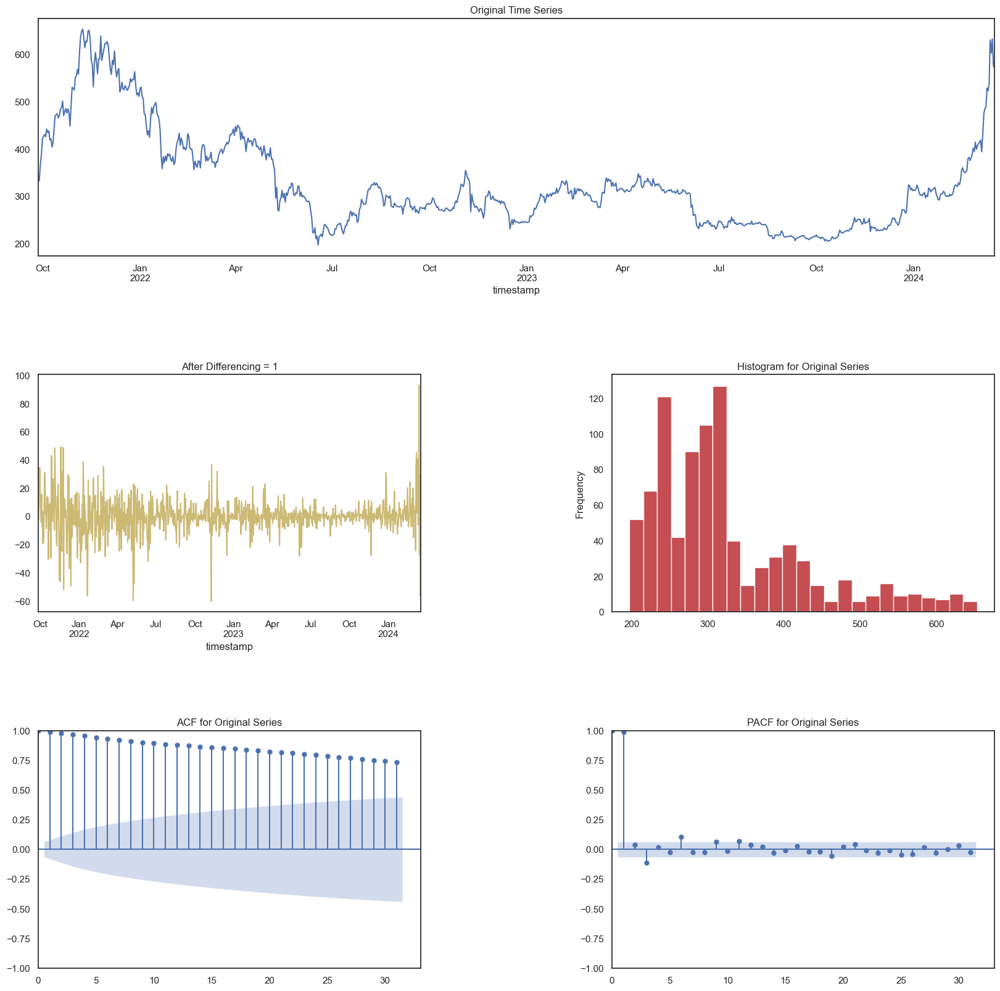

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:48:46 - cmdstanpy - INFO - Chain [1] start processing
19:48:47 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 84.64
    Std Deviation of actuals = 8.83
    Normalized RMSE (as pct of std dev) = 959%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:48:48 - cmdstanpy - INFO - Chain [1] start processing
19:48:49 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 86.40
    Std Deviation of actuals = 7.37
    Normalized RMSE (as pct of std dev) = 1172%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:48:50 - cmdstanpy - INFO - Chain [1] start processing
19:48:50 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 102.96
    Std Deviation of actuals = 26.76
    Normalized RMSE (as pct of std dev) = 385%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:48:51 - cmdstanpy - INFO - Chain [1] start processing
19:48:51 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 159.17
    Std Deviation of actuals = 21.46
    Normalized RMSE (as pct of std dev) = 742%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:48:53 - cmdstanpy - INFO - Chain [1] start processing
19:48:53 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 208.41
    Std Deviation of actuals = 25.79
    Normalized RMSE (as pct of std dev) = 808%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 126.78
    MSE (Mean Squared Error = 18800.49
    MAPE (Mean Absolute Percent Error) = 26%
    RMSE (Root Mean Squared Error) = 137.1149
    Normalized RMSE (MinMax) = 53%
    Normalized RMSE (as Std Dev of Actuals)= 162%
Time Taken = 8 seconds


19:48:54 - cmdstanpy - INFO - Chain [1] start processing
19:48:55 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 128.32


--------------------------------------------------
Total time taken: 31 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name   rmse
0  Prophet 128.32
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+--------------

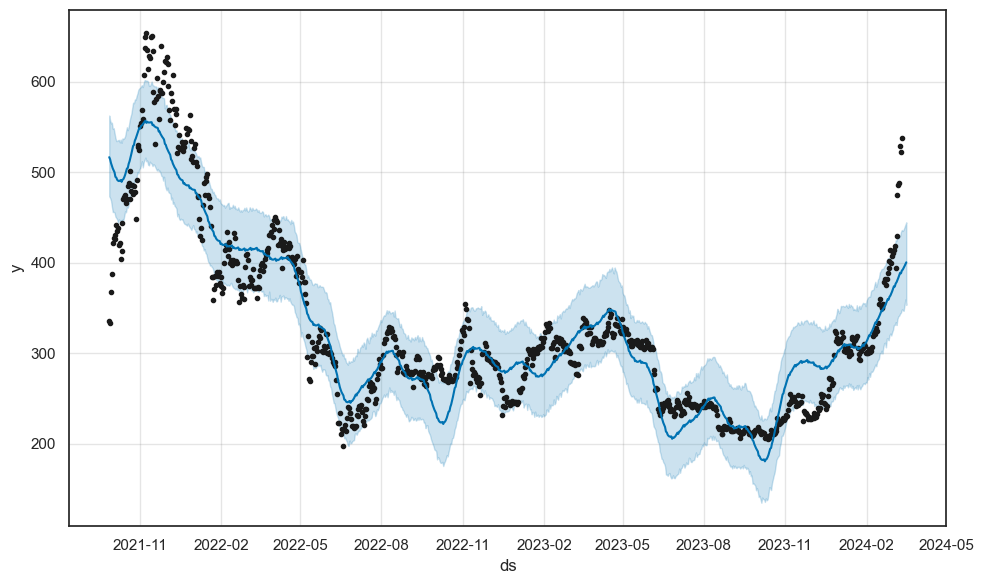

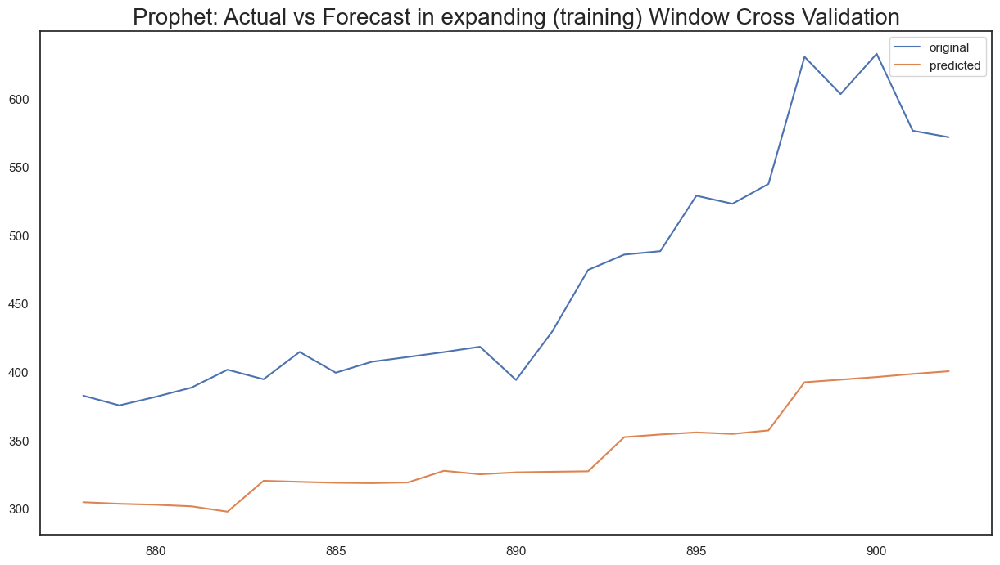

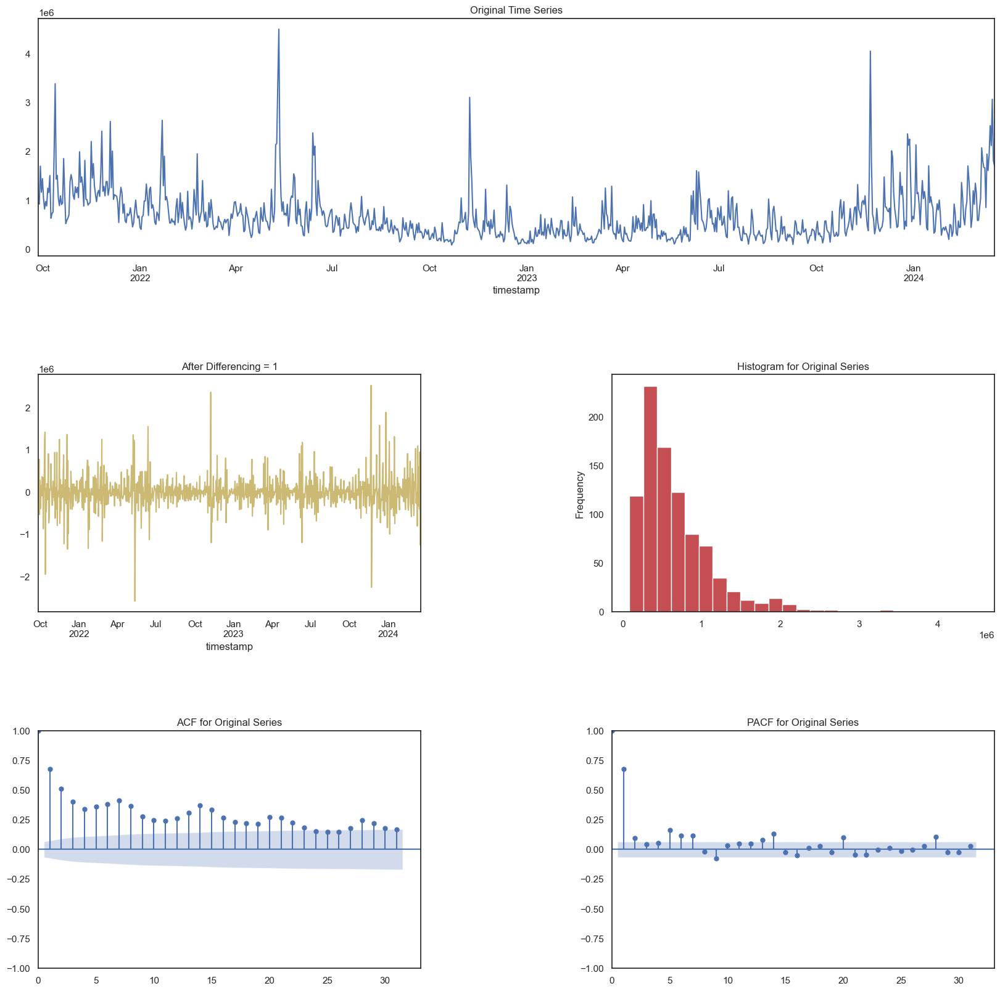

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:49:03 - cmdstanpy - INFO - Chain [1] start processing
19:49:03 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 294,016.49
    Std Deviation of actuals = 354,263.58
    Normalized RMSE (as pct of std dev) = 83%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:49:05 - cmdstanpy - INFO - Chain [1] start processing
19:49:05 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 237,907.76
    Std Deviation of actuals = 301,435.09
    Normalized RMSE (as pct of std dev) = 79%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:49:06 - cmdstanpy - INFO - Chain [1] start processing
19:49:06 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 757,264.96
    Std Deviation of actuals = 467,937.86
    Normalized RMSE (as pct of std dev) = 162%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:49:08 - cmdstanpy - INFO - Chain [1] start processing
19:49:08 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 827,171.27
    Std Deviation of actuals = 396,748.27
    Normalized RMSE (as pct of std dev) = 208%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:49:10 - cmdstanpy - INFO - Chain [1] start processing
19:49:10 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 1,343,399.54
    Std Deviation of actuals = 497,989.63
    Normalized RMSE (as pct of std dev) = 270%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 621133.38
    MSE (Mean Squared Error = 641086126592.55
    MAPE (Mean Absolute Percent Error) = 37%
    RMSE (Root Mean Squared Error) = 800678.5414
    Normalized RMSE (MinMax) = 31%
    Normalized RMSE (as Std Dev of Actuals)= 123%
Time Taken = 9 seconds


19:49:12 - cmdstanpy - INFO - Chain [1] start processing
19:49:13 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 691952.00


--------------------------------------------------
Total time taken: 18 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name      rmse
0  Prophet 691952.00
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+-----

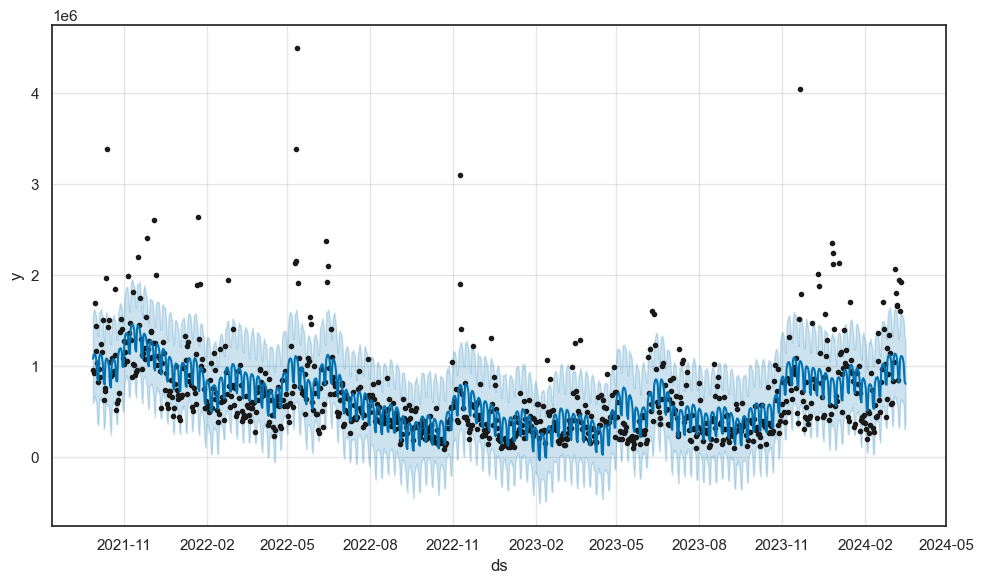

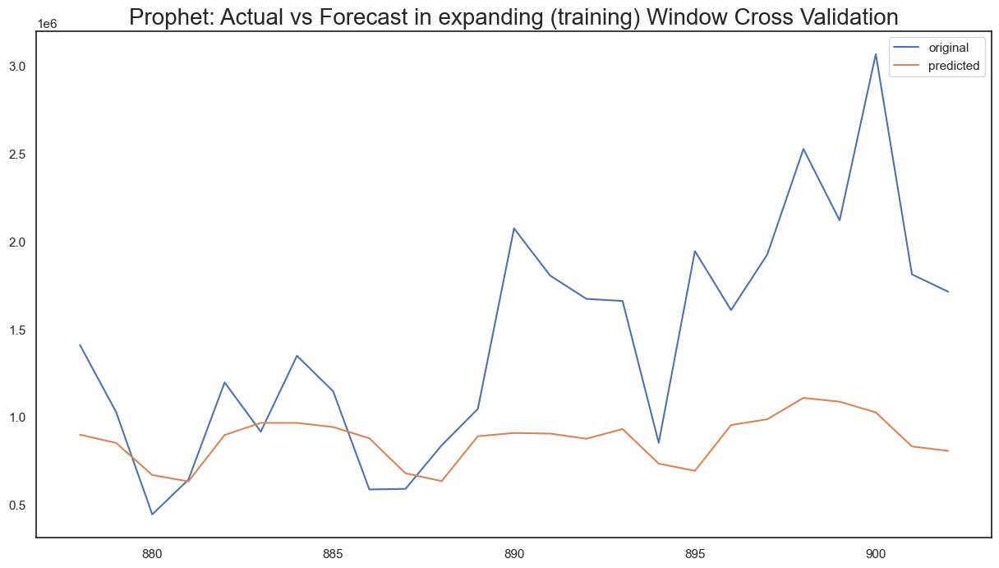

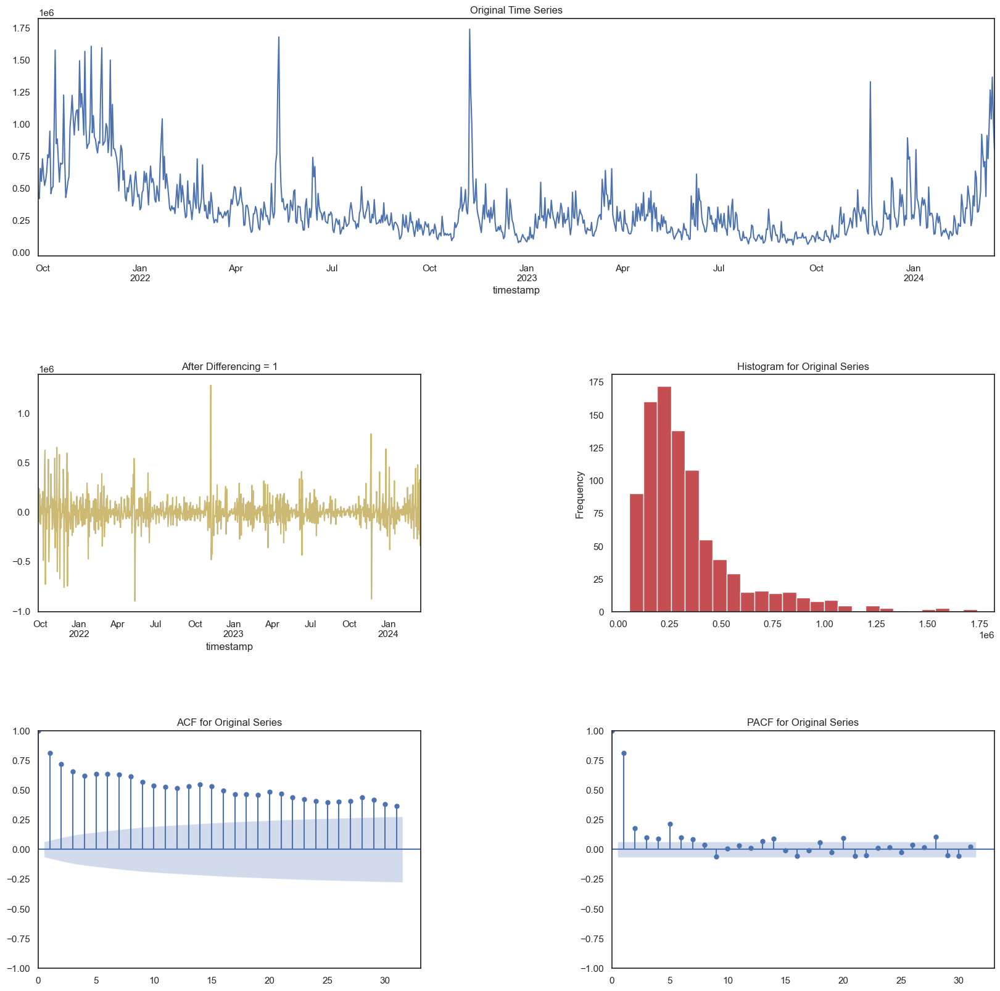

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:49:32 - cmdstanpy - INFO - Chain [1] start processing
19:49:32 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 123,143.41
    Std Deviation of actuals = 96,942.62
    Normalized RMSE (as pct of std dev) = 127%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:49:33 - cmdstanpy - INFO - Chain [1] start processing
19:49:34 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 199,760.22
    Std Deviation of actuals = 137,856.00
    Normalized RMSE (as pct of std dev) = 145%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:49:35 - cmdstanpy - INFO - Chain [1] start processing
19:49:35 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 396,879.62
    Std Deviation of actuals = 193,657.26
    Normalized RMSE (as pct of std dev) = 205%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:49:36 - cmdstanpy - INFO - Chain [1] start processing
19:49:37 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 464,625.94
    Std Deviation of actuals = 188,939.19
    Normalized RMSE (as pct of std dev) = 246%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:49:39 - cmdstanpy - INFO - Chain [1] start processing
19:49:39 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 721,770.64
    Std Deviation of actuals = 197,822.00
    Normalized RMSE (as pct of std dev) = 365%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 351805.46
    MSE (Mean Squared Error = 189882401184.15
    MAPE (Mean Absolute Percent Error) = 46%
    RMSE (Root Mean Squared Error) = 435754.9784
    Normalized RMSE (MinMax) = 38%
    Normalized RMSE (as Std Dev of Actuals)= 136%
Time Taken = 12 seconds


19:49:44 - cmdstanpy - INFO - Chain [1] start processing
19:49:44 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 381235.97


--------------------------------------------------
Total time taken: 32 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name      rmse
0  Prophet 381235.97
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+-----

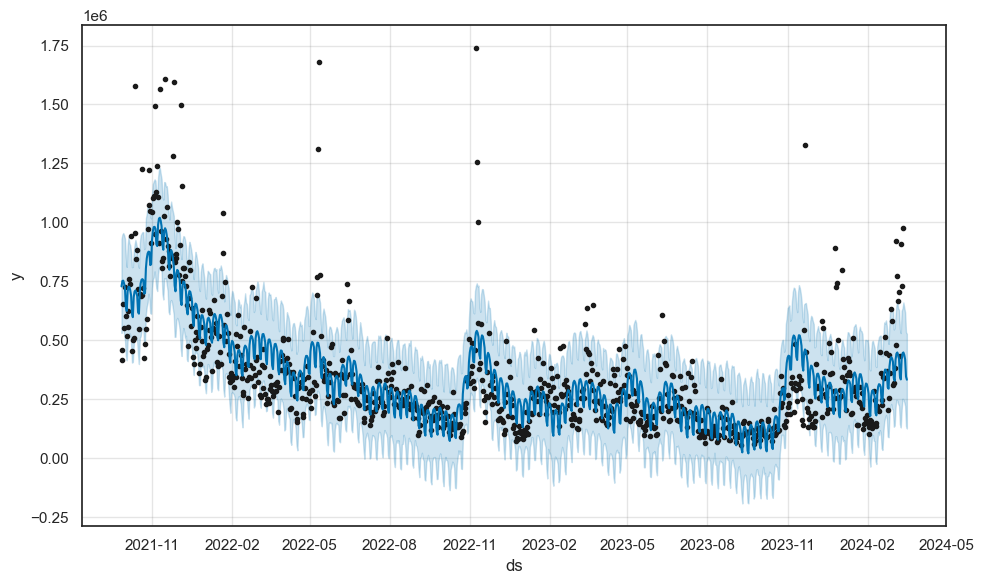

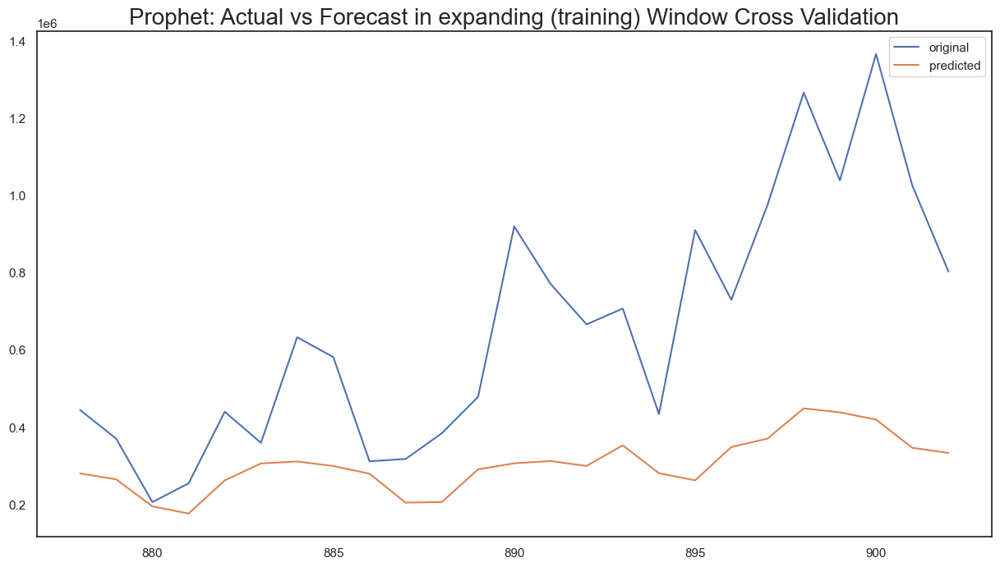

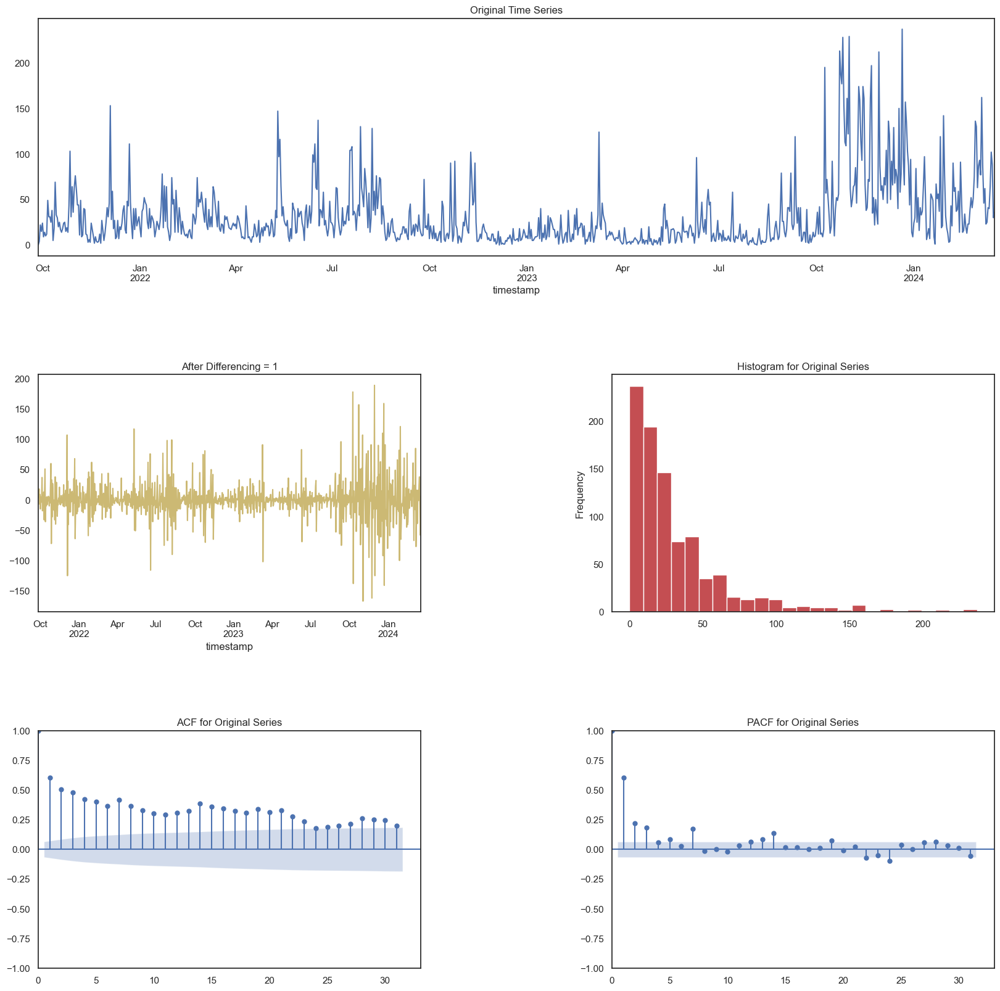

19:49:54 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:49:54 - cmdstanpy - INFO - Chain [1] done processing
19:49:55 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 29.00
    Std Deviation of actuals = 10.48
    Normalized RMSE (as pct of std dev) = 277%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:49:55 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 37.16
    Std Deviation of actuals = 29.47
    Normalized RMSE (as pct of std dev) = 126%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:49:56 - cmdstanpy - INFO - Chain [1] start processing
19:49:56 - cmdstanpy - INFO - Chain [1] done processing
19:49:57 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 41.26
    Std Deviation of actuals = 38.18
    Normalized RMSE (as pct of std dev) = 108%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:49:57 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 45.26
    Std Deviation of actuals = 14.02
    Normalized RMSE (as pct of std dev) = 323%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:49:58 - cmdstanpy - INFO - Chain [1] start processing
19:49:59 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 26.03
    Std Deviation of actuals = 28.14
    Normalized RMSE (as pct of std dev) = 93%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 31.34
    MSE (Mean Squared Error = 1330.26
    MAPE (Mean Absolute Percent Error) = 67%
    RMSE (Root Mean Squared Error) = 36.4727
    Normalized RMSE (MinMax) = 26%
    Normalized RMSE (as Std Dev of Actuals)= 99%
Time Taken = 6 seconds


19:50:00 - cmdstanpy - INFO - Chain [1] start processing
19:50:00 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 35.74


--------------------------------------------------
Total time taken: 16 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet 35.74
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+-----------------

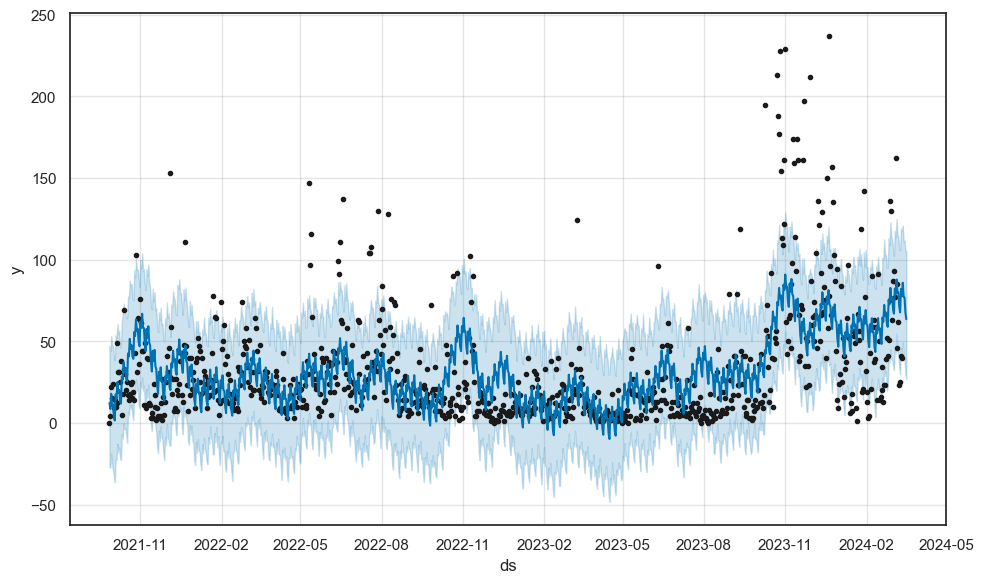

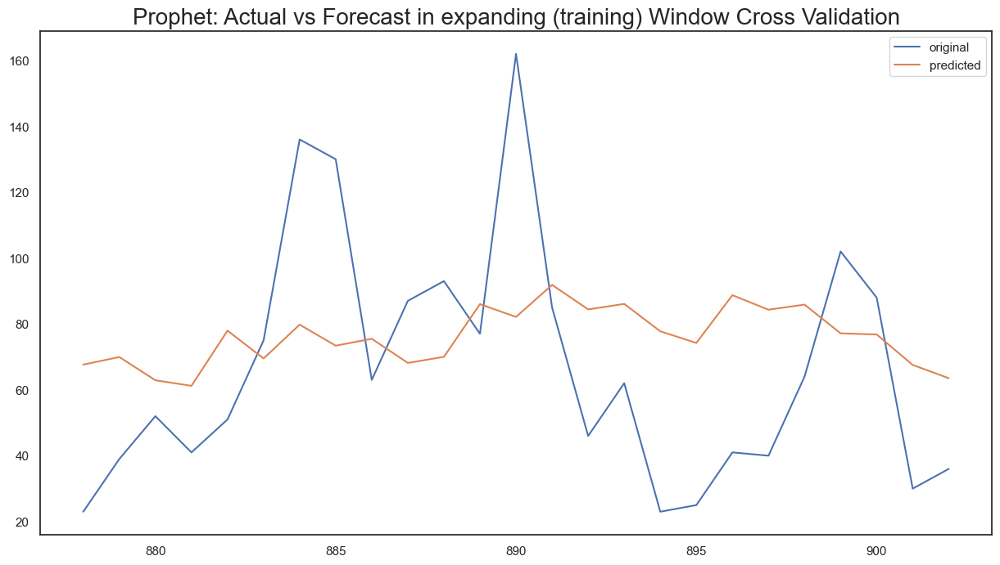

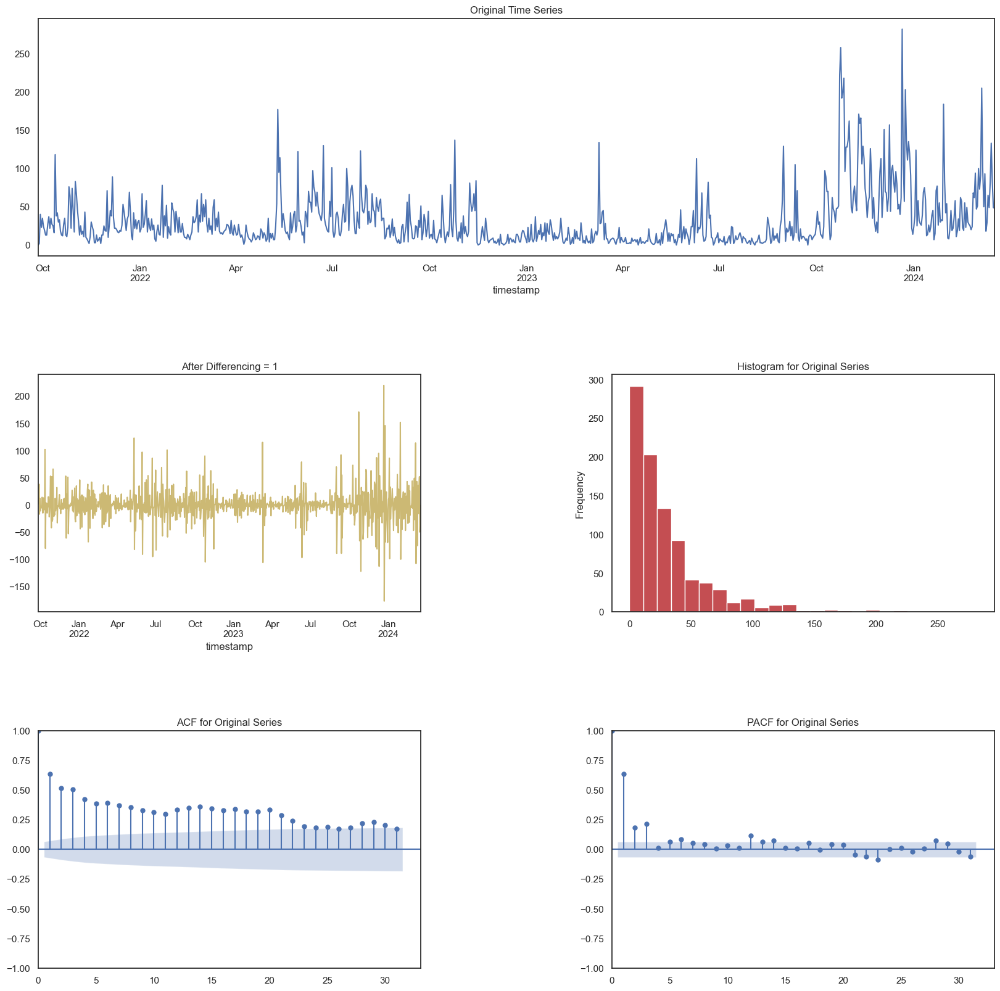

19:50:06 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:50:07 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 36.56
    Std Deviation of actuals = 17.75
    Normalized RMSE (as pct of std dev) = 206%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:50:08 - cmdstanpy - INFO - Chain [1] start processing
19:50:08 - cmdstanpy - INFO - Chain [1] done processing
19:50:09 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 24.03
    Std Deviation of actuals = 22.03
    Normalized RMSE (as pct of std dev) = 109%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:50:09 - cmdstanpy - INFO - Chain [1] done processing
19:50:10 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 59.56
    Std Deviation of actuals = 53.47
    Normalized RMSE (as pct of std dev) = 111%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:50:10 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 37.71
    Std Deviation of actuals = 26.60
    Normalized RMSE (as pct of std dev) = 142%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:50:11 - cmdstanpy - INFO - Chain [1] start processing
19:50:11 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 26.69
    Std Deviation of actuals = 30.97
    Normalized RMSE (as pct of std dev) = 86%
Cross Validation window: 5 completed


19:50:12 - cmdstanpy - INFO - Chain [1] start processing



-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 29.47
    MSE (Mean Squared Error = 1519.10
    MAPE (Mean Absolute Percent Error) = 69%
    RMSE (Root Mean Squared Error) = 38.9756
    Normalized RMSE (MinMax) = 21%
    Normalized RMSE (as Std Dev of Actuals)= 94%
Time Taken = 6 seconds


19:50:12 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 36.91


--------------------------------------------------
Total time taken: 12 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet 36.91
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+-----------------

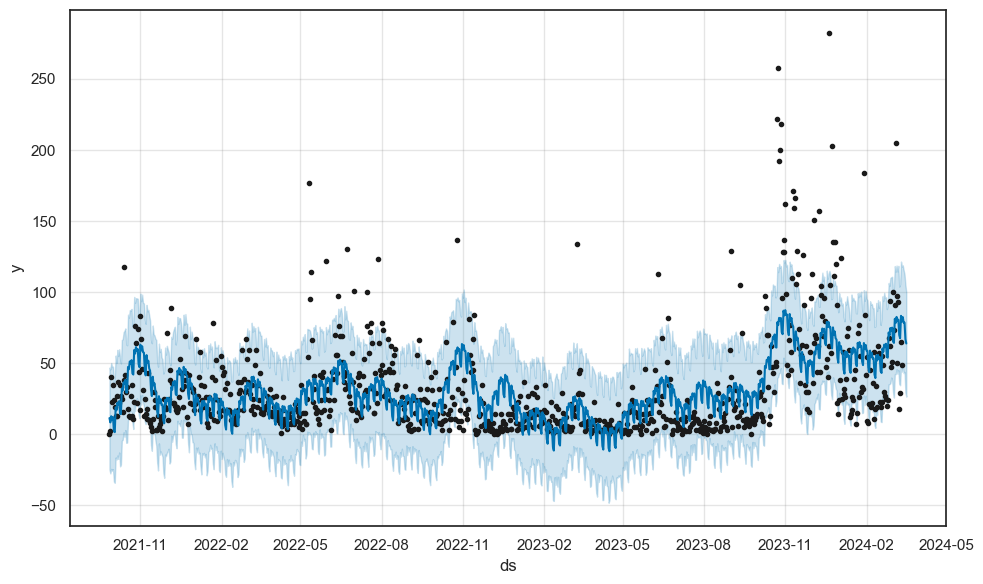

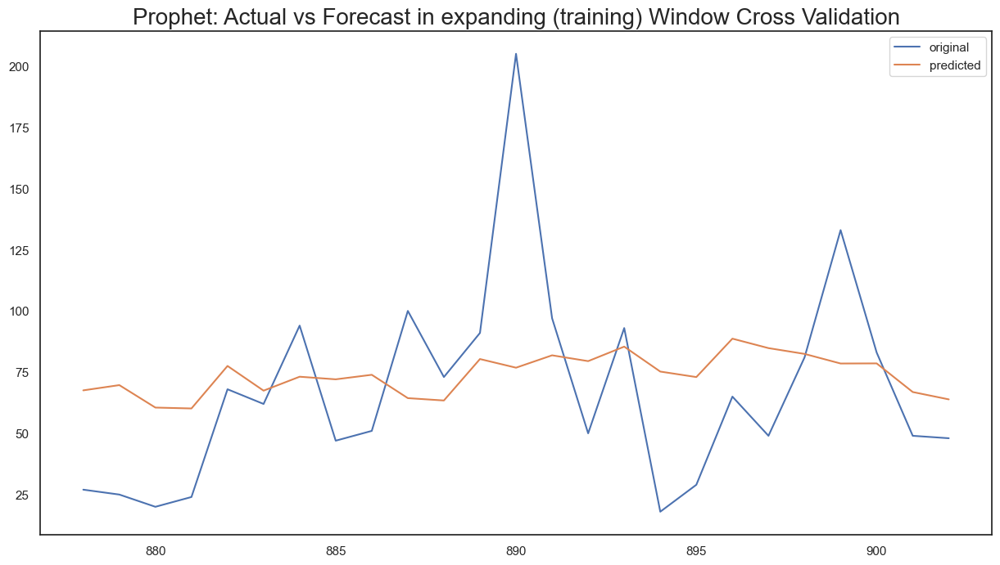

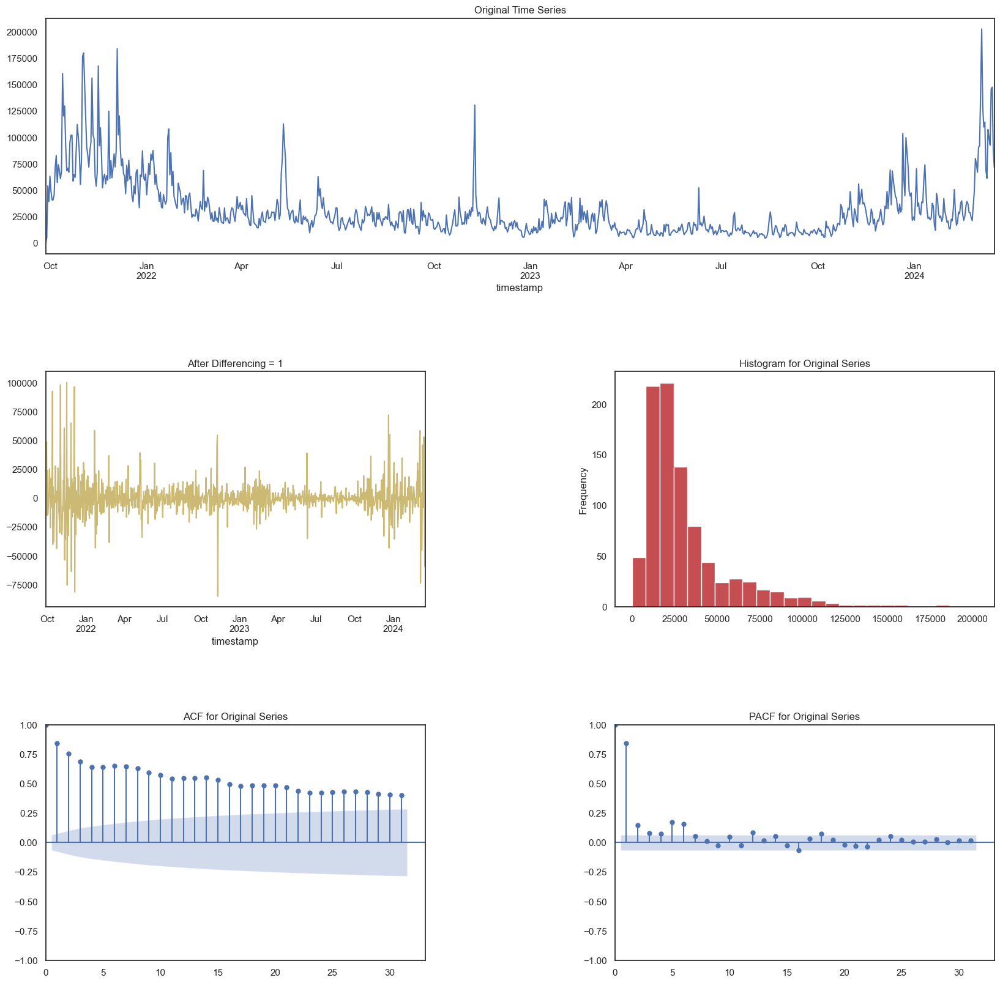

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:50:17 - cmdstanpy - INFO - Chain [1] start processing
19:50:17 - cmdstanpy - INFO - Chain [1] done processing
19:50:18 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 3,012.69
    Std Deviation of actuals = 4,807.93
    Normalized RMSE (as pct of std dev) = 63%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:50:18 - cmdstanpy - INFO - Chain [1] done processing
19:50:19 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 45,613.88
    Std Deviation of actuals = 13,785.56
    Normalized RMSE (as pct of std dev) = 331%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:50:19 - cmdstanpy - INFO - Chain [1] done processing
19:50:20 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 105,456.10
    Std Deviation of actuals = 37,848.36
    Normalized RMSE (as pct of std dev) = 279%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:50:20 - cmdstanpy - INFO - Chain [1] done processing
19:50:21 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 43,380.14
    Std Deviation of actuals = 21,196.05
    Normalized RMSE (as pct of std dev) = 205%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:50:21 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 60,251.94
    Std Deviation of actuals = 31,462.07
    Normalized RMSE (as pct of std dev) = 192%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 47411.59
    MSE (Mean Squared Error = 3744564922.18
    MAPE (Mean Absolute Percent Error) = 45%
    RMSE (Root Mean Squared Error) = 61192.8503
    Normalized RMSE (MinMax) = 34%
    Normalized RMSE (as Std Dev of Actuals)= 136%
Time Taken = 5 seconds


19:50:22 - cmdstanpy - INFO - Chain [1] start processing
19:50:22 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 51542.95


--------------------------------------------------
Total time taken: 10 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name     rmse
0  Prophet 51542.95
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+--------

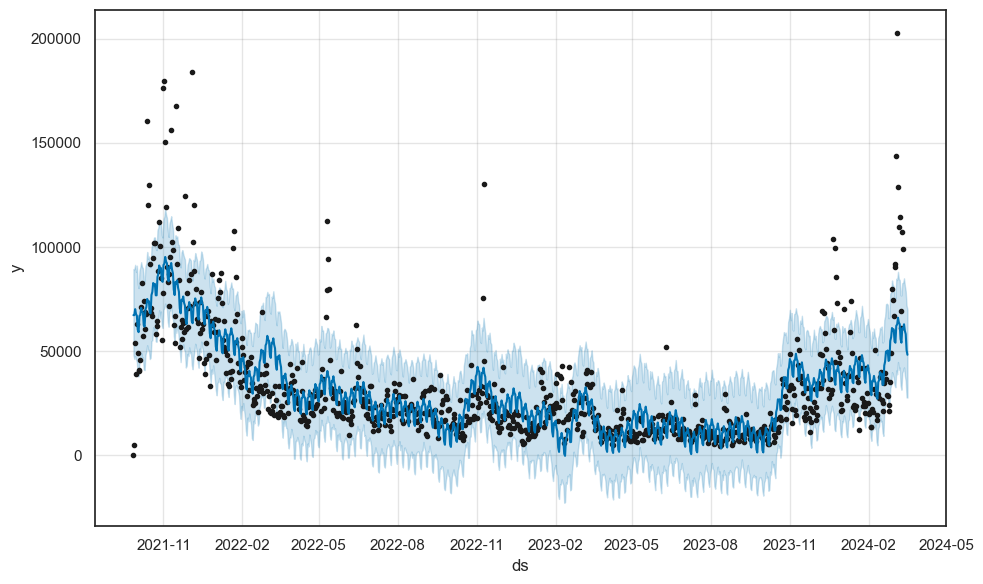

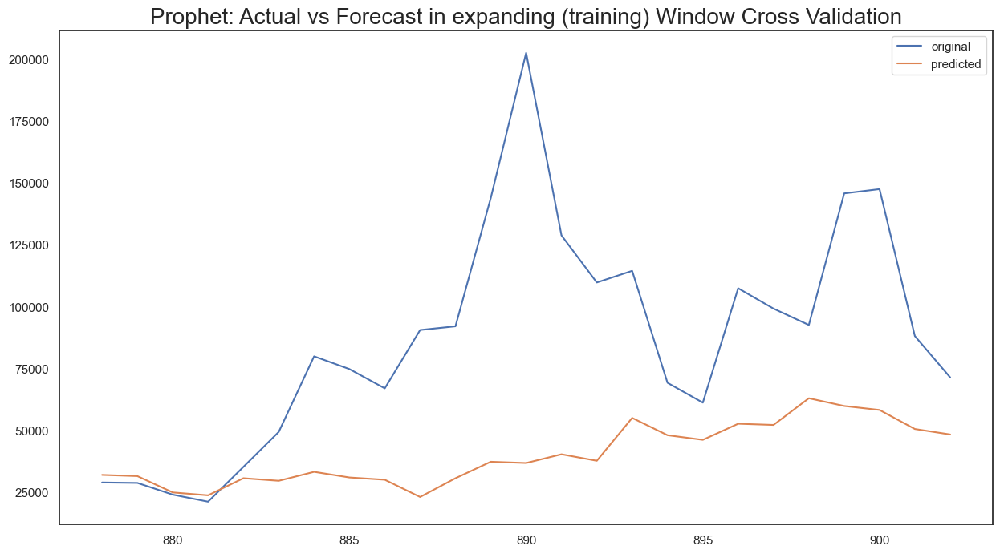

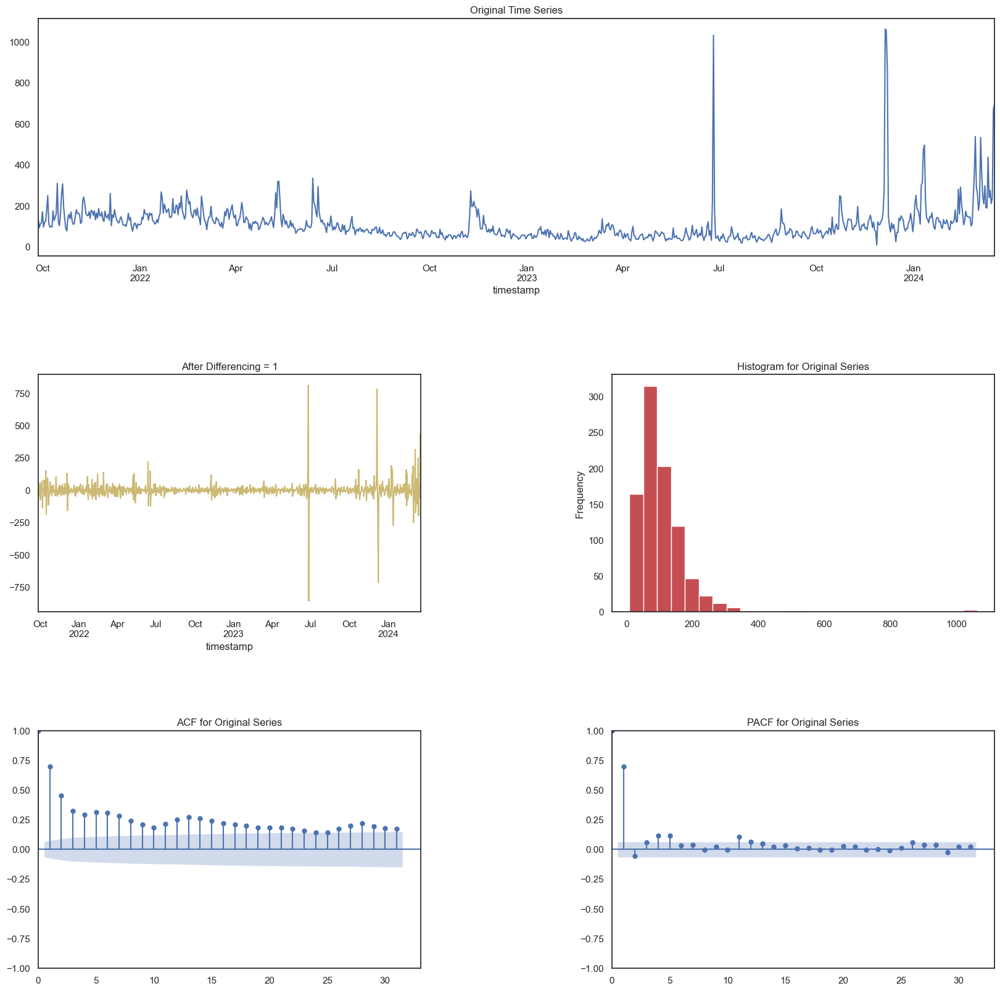

19:50:27 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:50:28 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 47.89
    Std Deviation of actuals = 47.28
    Normalized RMSE (as pct of std dev) = 101%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:50:29 - cmdstanpy - INFO - Chain [1] start processing
19:50:29 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 185.91
    Std Deviation of actuals = 120.66
    Normalized RMSE (as pct of std dev) = 154%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:50:30 - cmdstanpy - INFO - Chain [1] start processing
19:50:30 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 168.89
    Std Deviation of actuals = 122.68
    Normalized RMSE (as pct of std dev) = 138%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:50:31 - cmdstanpy - INFO - Chain [1] start processing
19:50:31 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 106.31
    Std Deviation of actuals = 92.17
    Normalized RMSE (as pct of std dev) = 115%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:50:32 - cmdstanpy - INFO - Chain [1] start processing
19:50:32 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 306.36
    Std Deviation of actuals = 216.71
    Normalized RMSE (as pct of std dev) = 141%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 119.60
    MSE (Mean Squared Error = 34107.82
    MAPE (Mean Absolute Percent Error) = 32%
    RMSE (Root Mean Squared Error) = 184.6830
    Normalized RMSE (MinMax) = 31%
    Normalized RMSE (as Std Dev of Actuals)= 114%
Time Taken = 6 seconds


19:50:33 - cmdstanpy - INFO - Chain [1] start processing
19:50:34 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 163.07


--------------------------------------------------
Total time taken: 12 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name   rmse
0  Prophet 163.07
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+--------------

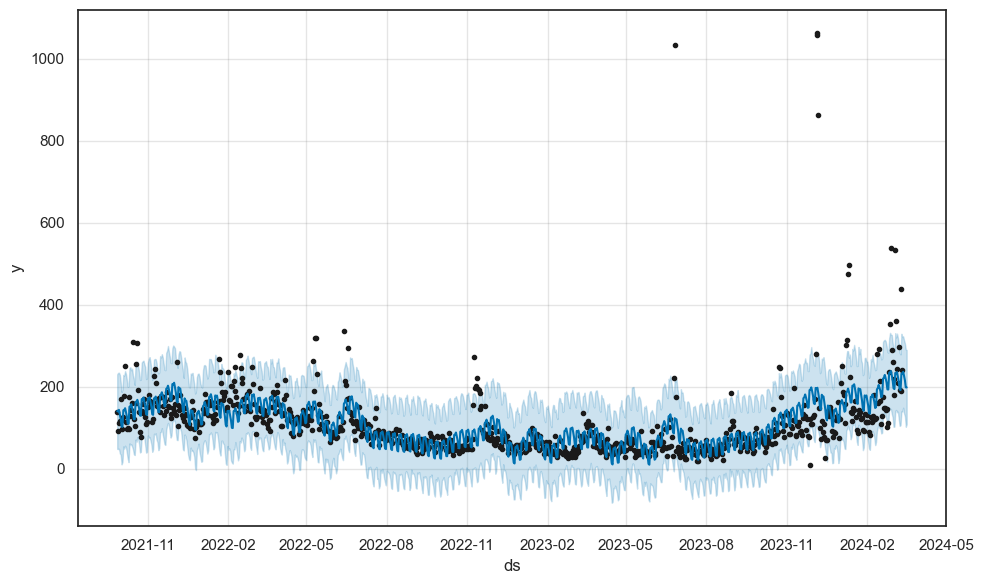

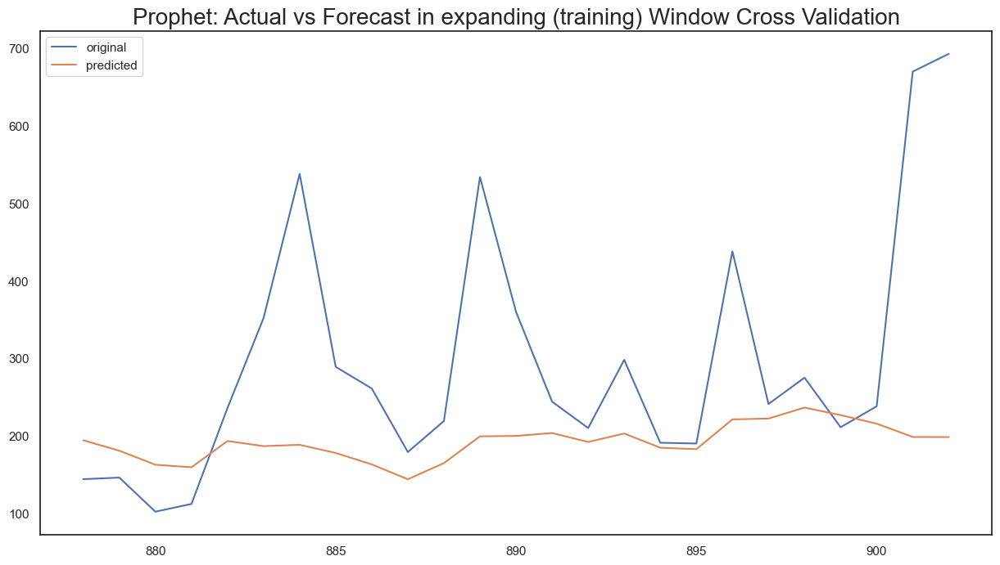

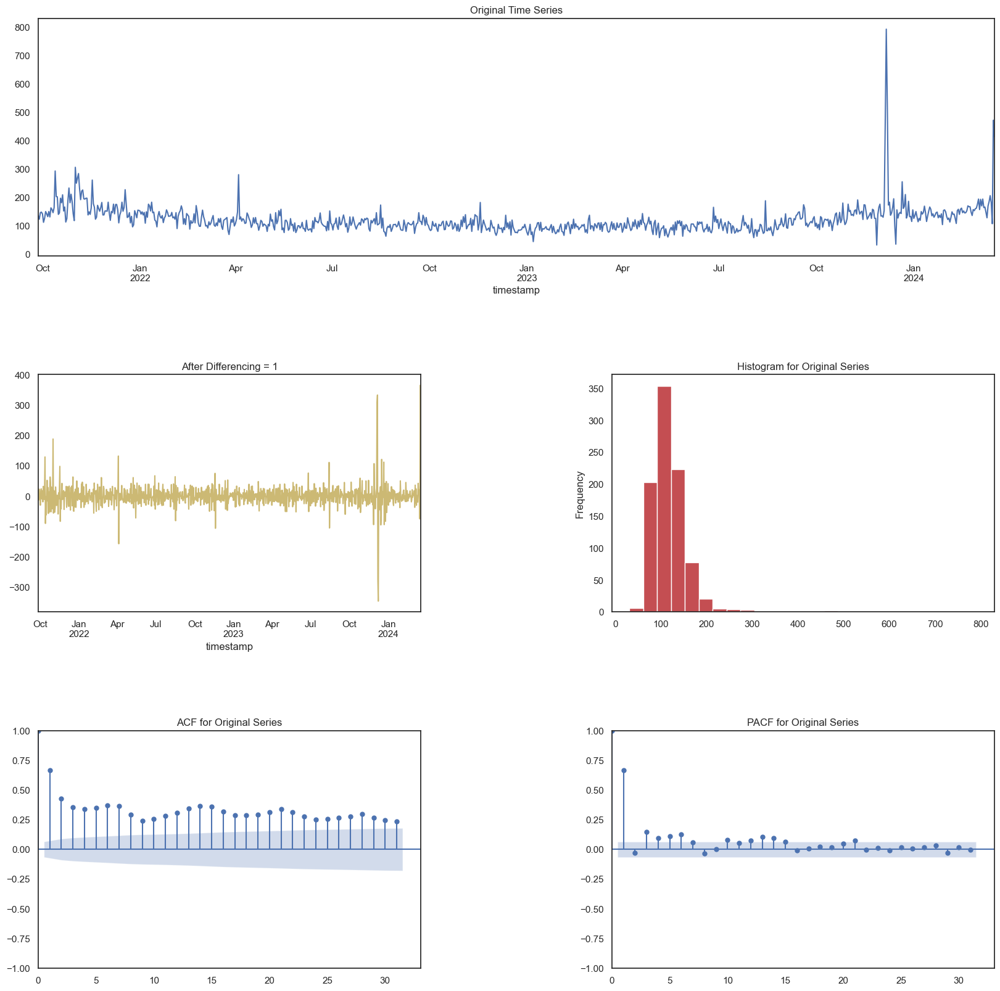

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:50:47 - cmdstanpy - INFO - Chain [1] start processing
19:50:47 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 6.84
    Std Deviation of actuals = 11.85
    Normalized RMSE (as pct of std dev) = 58%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:50:47 - cmdstanpy - INFO - Chain [1] start processing
19:50:48 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 25.35
    Std Deviation of actuals = 14.56
    Normalized RMSE (as pct of std dev) = 174%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:50:48 - cmdstanpy - INFO - Chain [1] start processing
19:50:49 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 19.34
    Std Deviation of actuals = 15.19
    Normalized RMSE (as pct of std dev) = 127%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:50:49 - cmdstanpy - INFO - Chain [1] start processing
19:50:49 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 14.77
    Std Deviation of actuals = 19.63
    Normalized RMSE (as pct of std dev) = 75%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:50:50 - cmdstanpy - INFO - Chain [1] start processing
19:50:50 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 193.18
    Std Deviation of actuals = 141.25
    Normalized RMSE (as pct of std dev) = 137%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 38.96
    MSE (Mean Squared Error = 7720.28
    MAPE (Mean Absolute Percent Error) = 15%
    RMSE (Root Mean Squared Error) = 87.8651
    Normalized RMSE (MinMax) = 24%
    Normalized RMSE (as Std Dev of Actuals)= 109%
Time Taken = 5 seconds


19:50:51 - cmdstanpy - INFO - Chain [1] start processing
19:50:52 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 51.90


--------------------------------------------------
Total time taken: 18 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet 51.90
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+-----------------

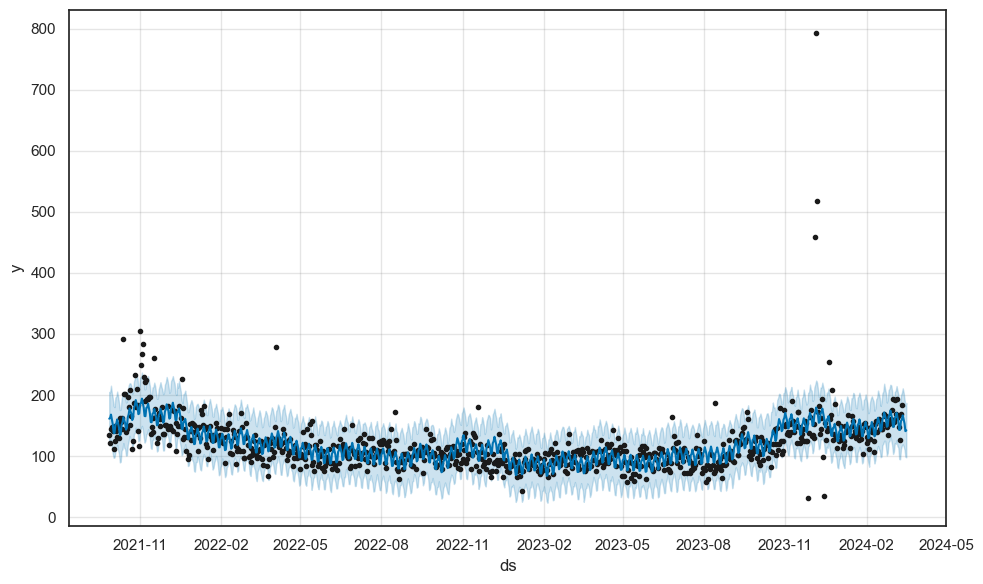

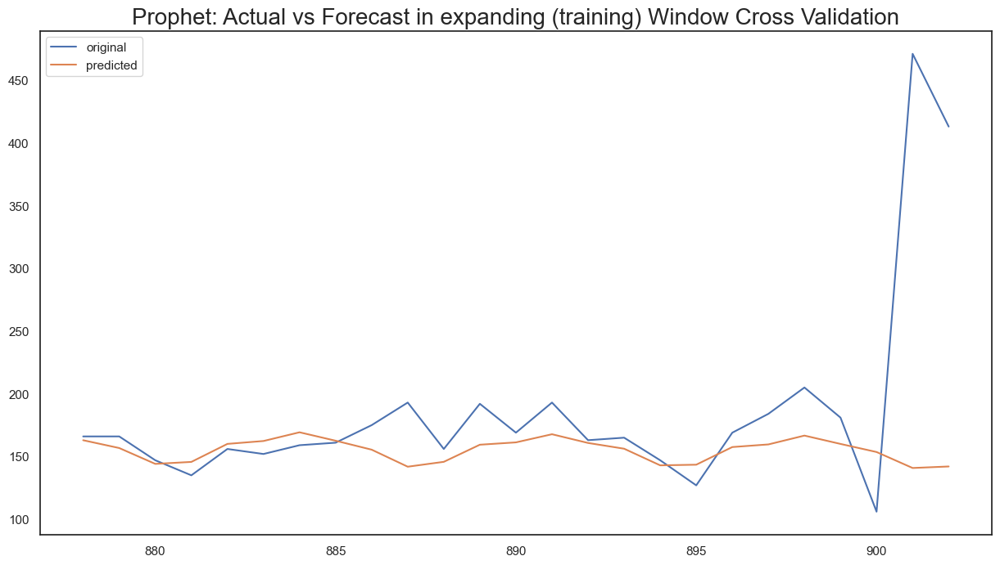

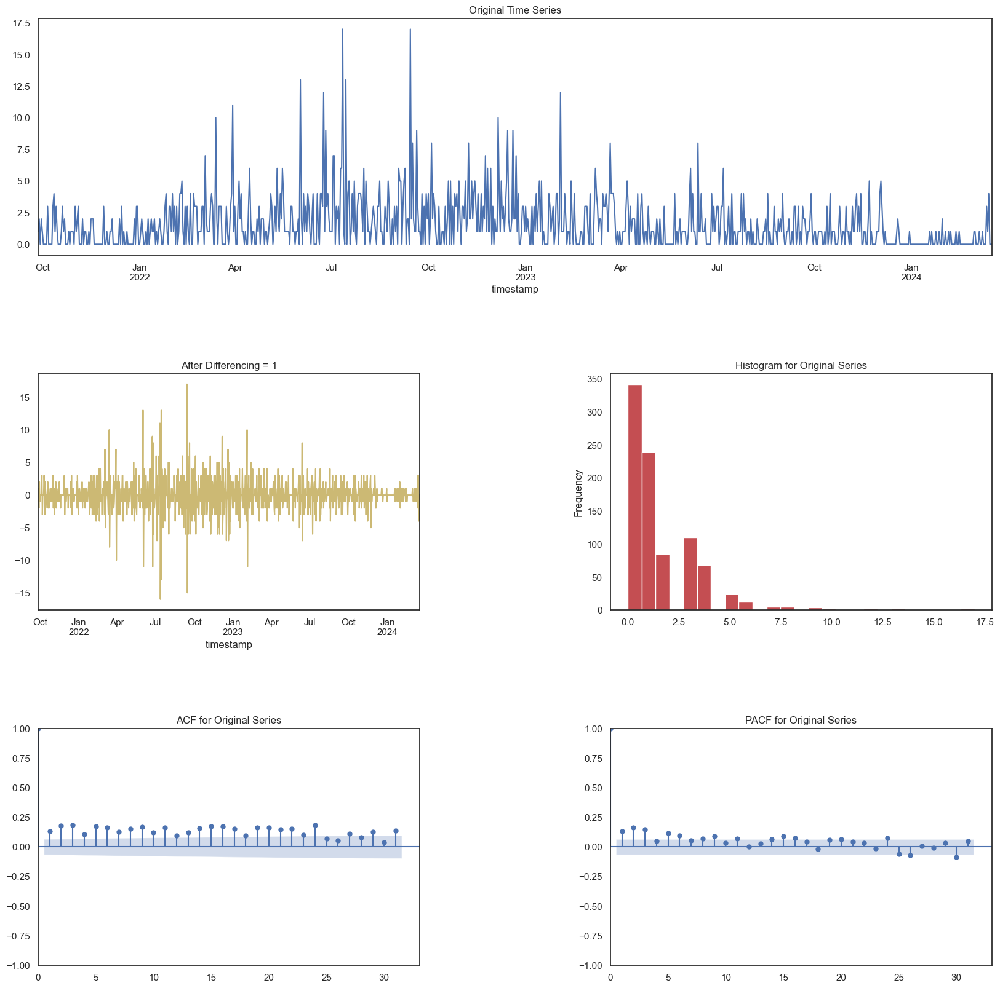

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:51:03 - cmdstanpy - INFO - Chain [1] start processing
19:51:03 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 0.35
    Std Deviation of actuals = 0.00
    Normalized RMSE (as pct of std dev) = inf%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:51:04 - cmdstanpy - INFO - Chain [1] start processing
19:51:04 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 0.44
    Std Deviation of actuals = 0.49
    Normalized RMSE (as pct of std dev) = 91%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:51:05 - cmdstanpy - INFO - Chain [1] start processing
19:51:05 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 0.58
    Std Deviation of actuals = 0.40
    Normalized RMSE (as pct of std dev) = 144%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:51:06 - cmdstanpy - INFO - Chain [1] start processing
19:51:06 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 0.90
    Std Deviation of actuals = 1.17
    Normalized RMSE (as pct of std dev) = 77%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:51:07 - cmdstanpy - INFO - Chain [1] start processing
19:51:07 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 1.43
    Std Deviation of actuals = 1.55
    Normalized RMSE (as pct of std dev) = 92%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 0.58
    MSE (Mean Squared Error = 0.70
    MAPE (Mean Absolute Percent Error) = inf%
    RMSE (Root Mean Squared Error) = 0.8364
    Normalized RMSE (MinMax) = 21%
    Normalized RMSE (as Std Dev of Actuals)= 83%
Time Taken = 5 seconds


19:51:08 - cmdstanpy - INFO - Chain [1] start processing
19:51:08 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 0.74


--------------------------------------------------
Total time taken: 17 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet  0.74
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------------

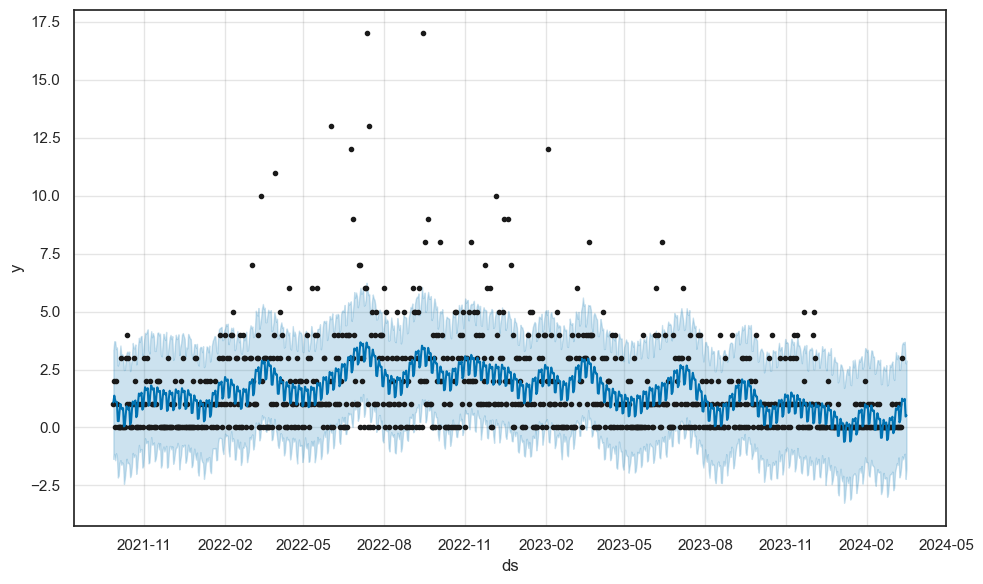

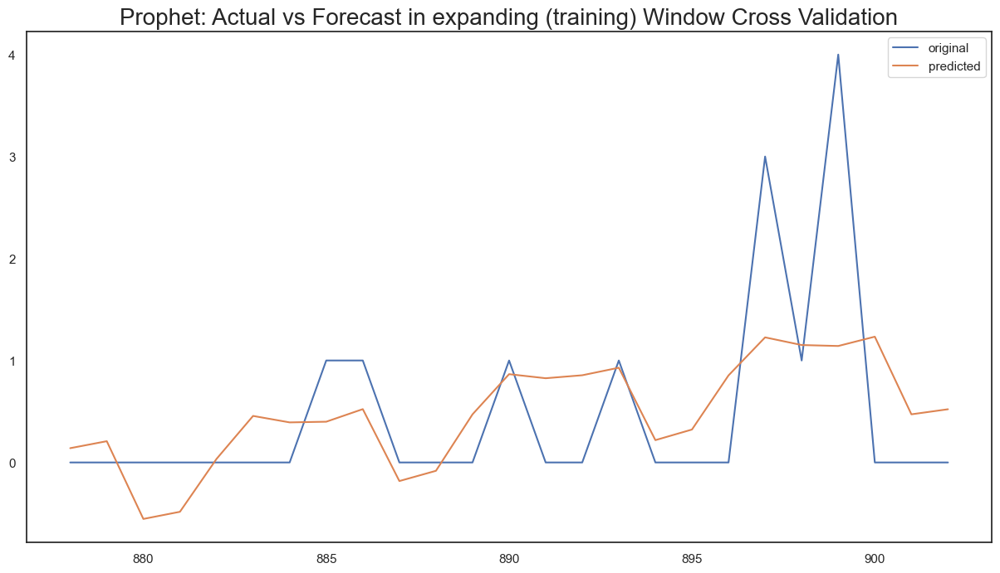

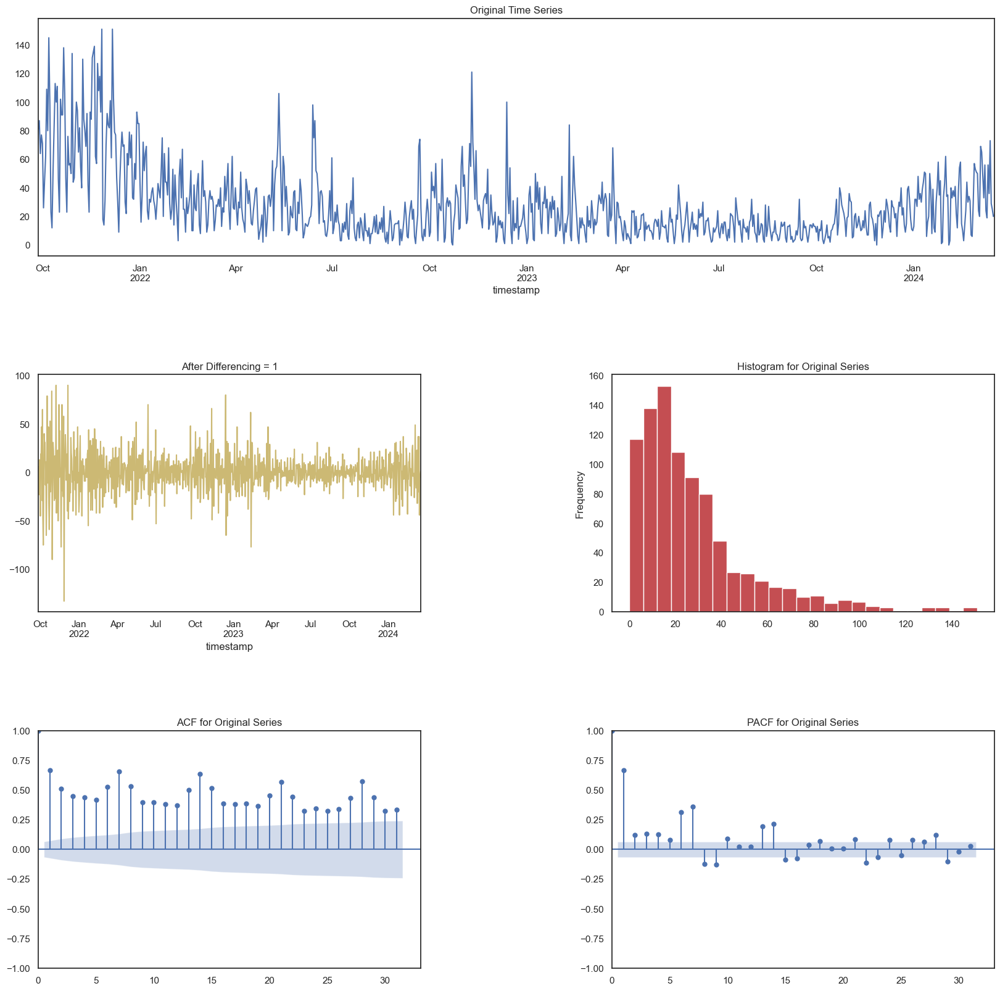

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:51:18 - cmdstanpy - INFO - Chain [1] start processing
19:51:18 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 8.33
    Std Deviation of actuals = 12.27
    Normalized RMSE (as pct of std dev) = 68%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:51:19 - cmdstanpy - INFO - Chain [1] start processing
19:51:19 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 28.58
    Std Deviation of actuals = 11.75
    Normalized RMSE (as pct of std dev) = 243%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:51:20 - cmdstanpy - INFO - Chain [1] start processing
19:51:20 - cmdstanpy - INFO - Chain [1] done processing
19:51:21 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 28.65
    Std Deviation of actuals = 18.64
    Normalized RMSE (as pct of std dev) = 154%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:51:21 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 14.92
    Std Deviation of actuals = 15.55
    Normalized RMSE (as pct of std dev) = 96%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:51:22 - cmdstanpy - INFO - Chain [1] start processing
19:51:22 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 18.01
    Std Deviation of actuals = 19.96
    Normalized RMSE (as pct of std dev) = 90%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 17.30
    MSE (Mean Squared Error = 450.78
    MAPE (Mean Absolute Percent Error) = 47%
    RMSE (Root Mean Squared Error) = 21.2316
    Normalized RMSE (MinMax) = 32%
    Normalized RMSE (as Std Dev of Actuals)= 112%
Time Taken = 5 seconds


19:51:23 - cmdstanpy - INFO - Chain [1] start processing
19:51:23 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 19.70


--------------------------------------------------
Total time taken: 15 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet 19.70
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+-----------------

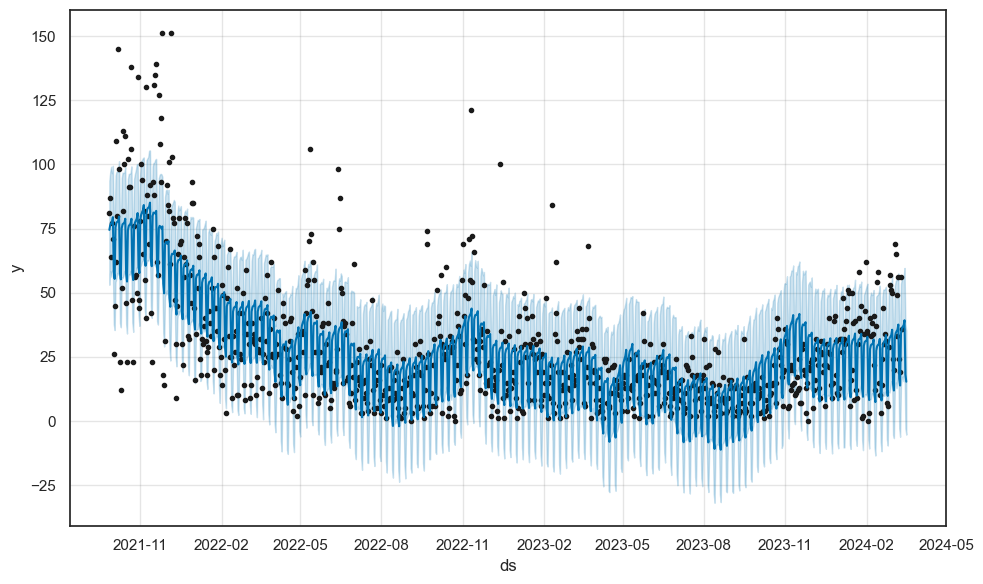

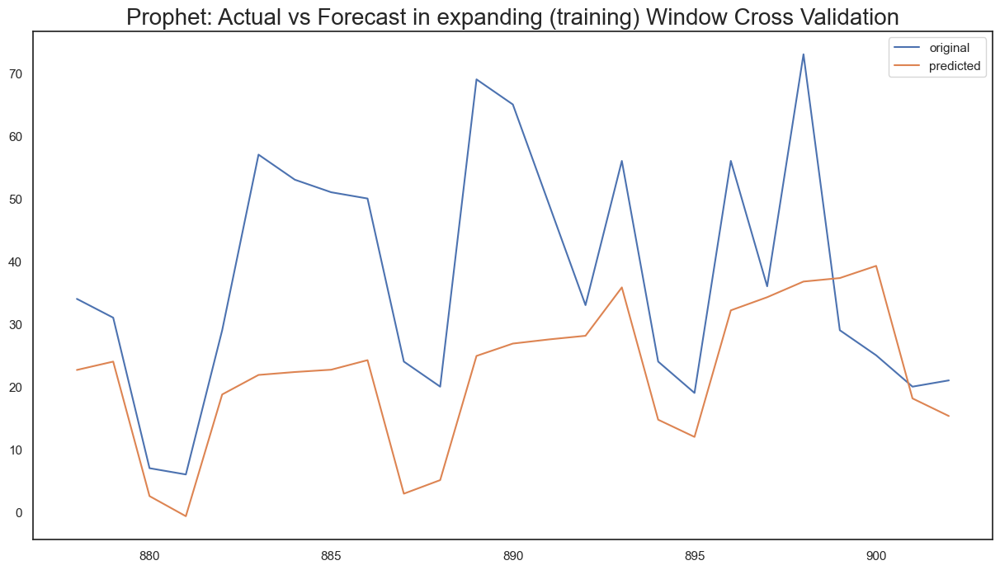

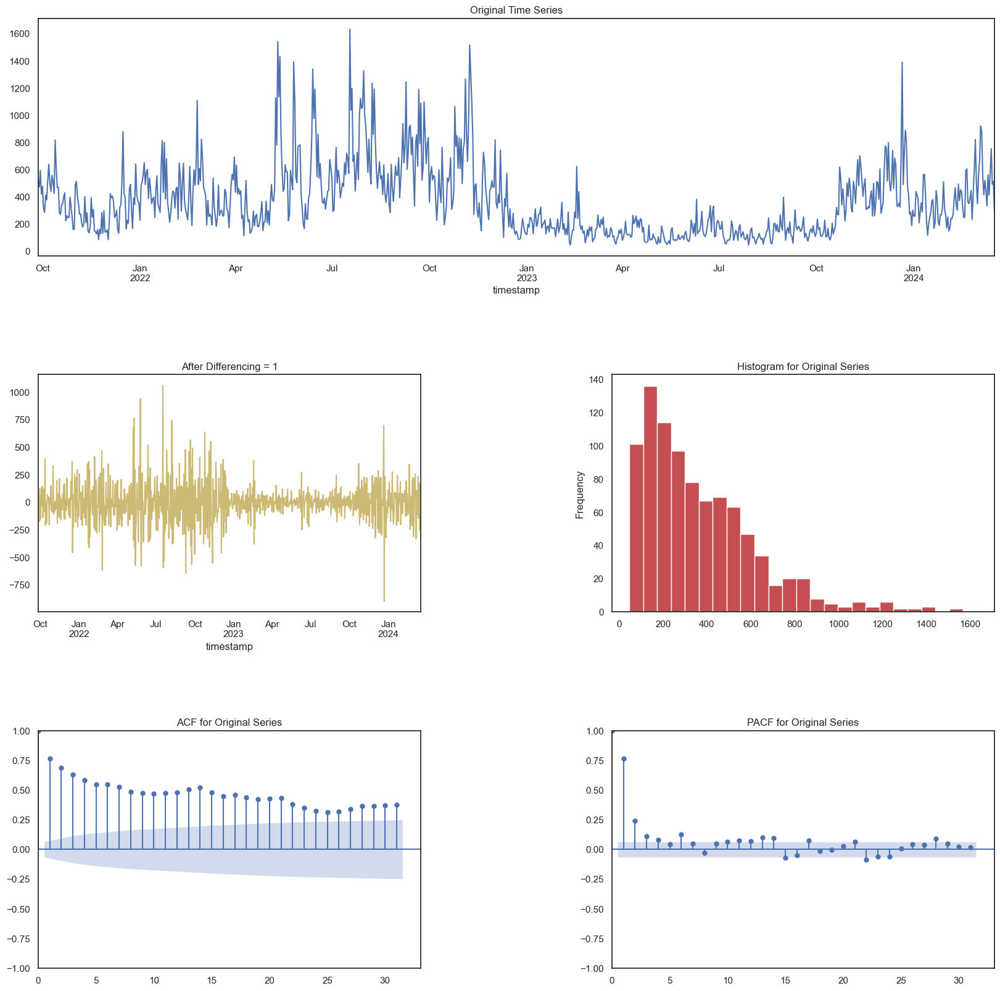

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:51:36 - cmdstanpy - INFO - Chain [1] start processing
19:51:36 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 148.05
    Std Deviation of actuals = 75.82
    Normalized RMSE (as pct of std dev) = 195%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:51:37 - cmdstanpy - INFO - Chain [1] start processing
19:51:37 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 176.64
    Std Deviation of actuals = 152.53
    Normalized RMSE (as pct of std dev) = 116%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:51:38 - cmdstanpy - INFO - Chain [1] start processing
19:51:38 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 299.83
    Std Deviation of actuals = 192.62
    Normalized RMSE (as pct of std dev) = 156%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:51:39 - cmdstanpy - INFO - Chain [1] start processing
19:51:39 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 66.24
    Std Deviation of actuals = 80.99
    Normalized RMSE (as pct of std dev) = 82%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:51:40 - cmdstanpy - INFO - Chain [1] start processing
19:51:40 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 176.64
    Std Deviation of actuals = 147.85
    Normalized RMSE (as pct of std dev) = 119%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 147.77
    MSE (Mean Squared Error = 35722.12
    MAPE (Mean Absolute Percent Error) = 28%
    RMSE (Root Mean Squared Error) = 189.0030
    Normalized RMSE (MinMax) = 28%
    Normalized RMSE (as Std Dev of Actuals)= 107%
Time Taken = 6 seconds


19:51:41 - cmdstanpy - INFO - Chain [1] start processing
19:51:42 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 173.48


--------------------------------------------------
Total time taken: 18 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name   rmse
0  Prophet 173.48
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+--------------

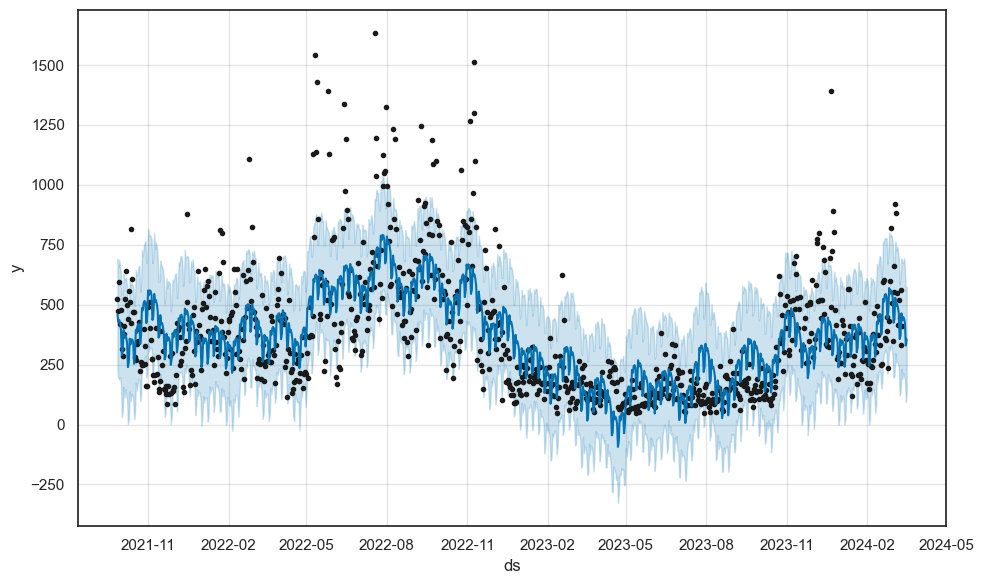

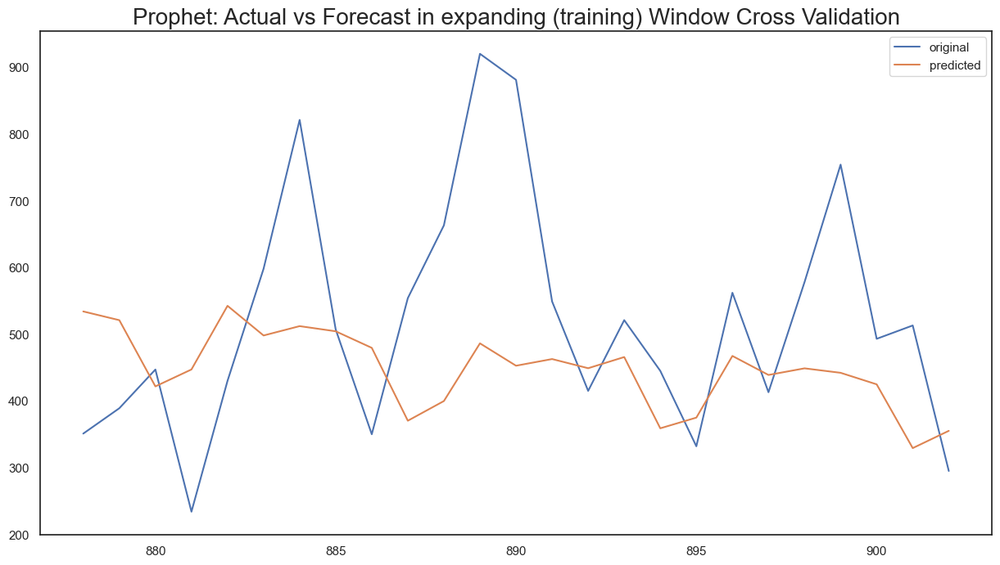

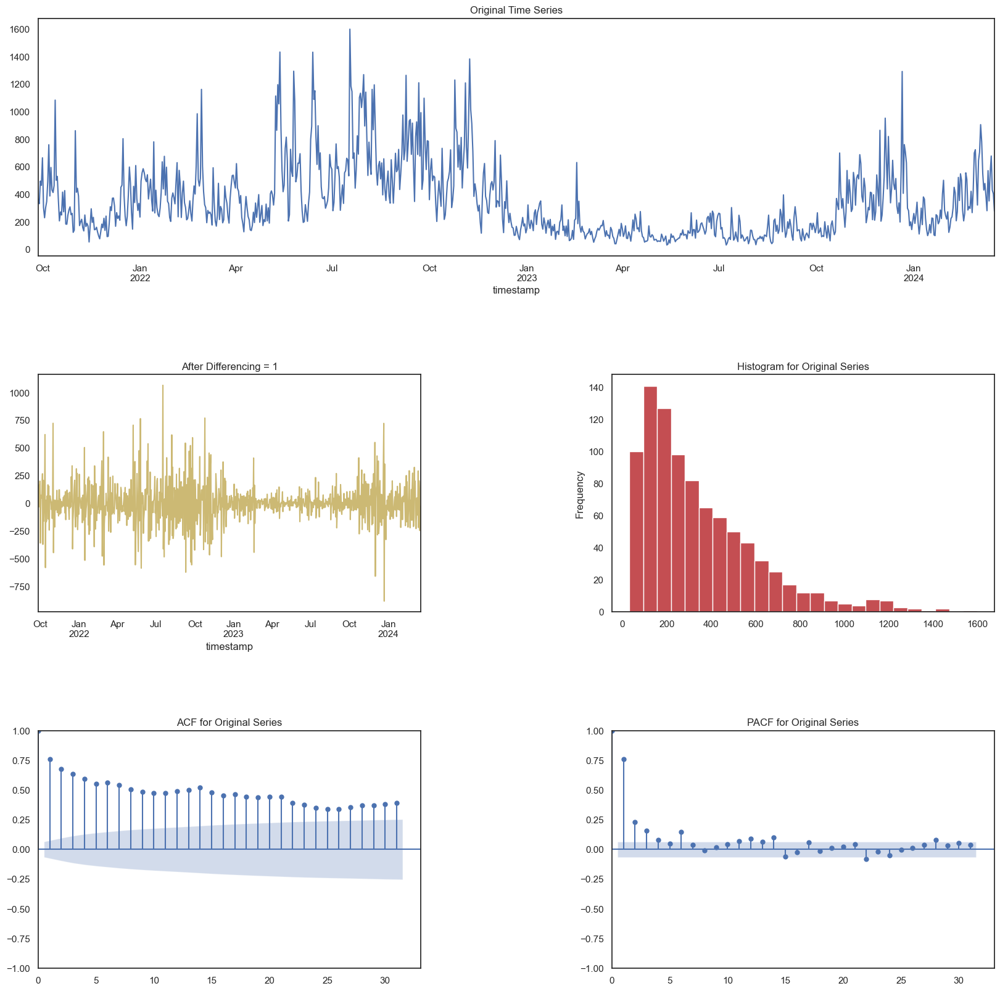

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:51:50 - cmdstanpy - INFO - Chain [1] start processing
19:51:50 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 107.54
    Std Deviation of actuals = 66.84
    Normalized RMSE (as pct of std dev) = 161%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:51:51 - cmdstanpy - INFO - Chain [1] start processing
19:51:51 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 240.18
    Std Deviation of actuals = 148.69
    Normalized RMSE (as pct of std dev) = 162%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:51:52 - cmdstanpy - INFO - Chain [1] start processing
19:51:52 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 317.15
    Std Deviation of actuals = 167.61
    Normalized RMSE (as pct of std dev) = 189%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:51:53 - cmdstanpy - INFO - Chain [1] start processing
19:51:53 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 80.30
    Std Deviation of actuals = 101.34
    Normalized RMSE (as pct of std dev) = 79%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:51:54 - cmdstanpy - INFO - Chain [1] start processing
19:51:54 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 149.31
    Std Deviation of actuals = 136.42
    Normalized RMSE (as pct of std dev) = 109%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 156.25
    MSE (Mean Squared Error = 39715.62
    MAPE (Mean Absolute Percent Error) = 29%
    RMSE (Root Mean Squared Error) = 199.2878
    Normalized RMSE (MinMax) = 31%
    Normalized RMSE (as Std Dev of Actuals)= 112%
Time Taken = 6 seconds


19:51:56 - cmdstanpy - INFO - Chain [1] start processing
19:51:56 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 178.90


--------------------------------------------------
Total time taken: 14 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name   rmse
0  Prophet 178.90
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (903, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+--------------

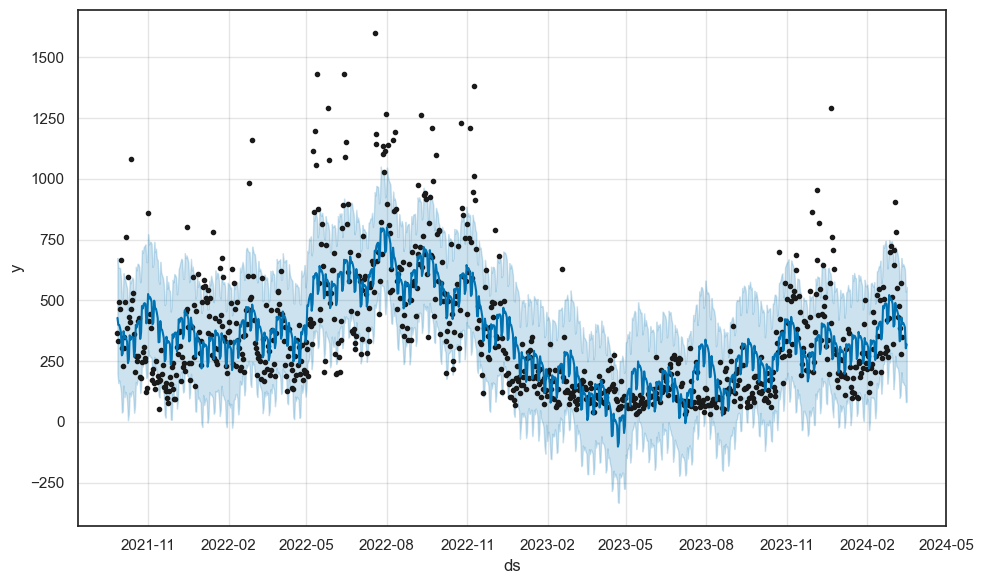

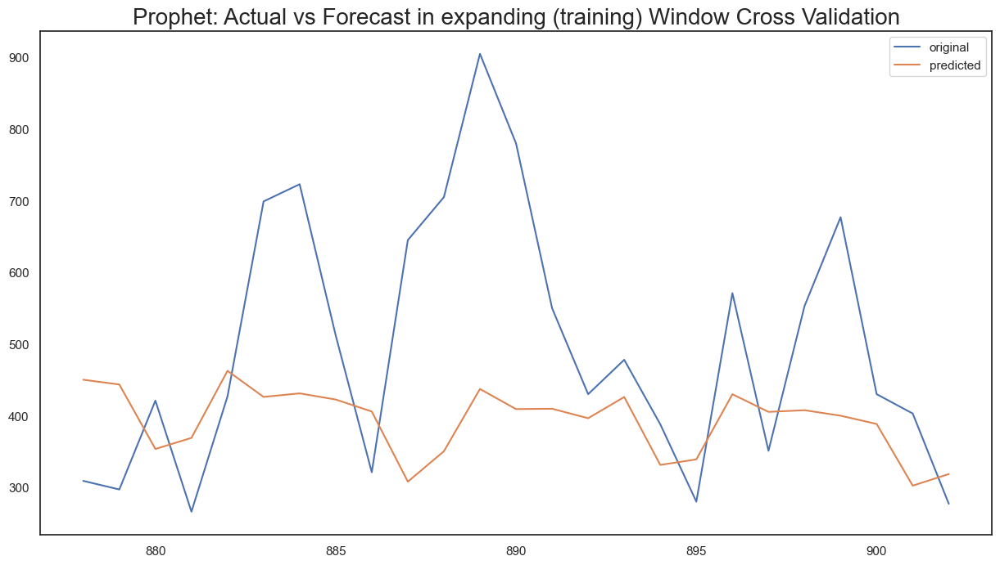

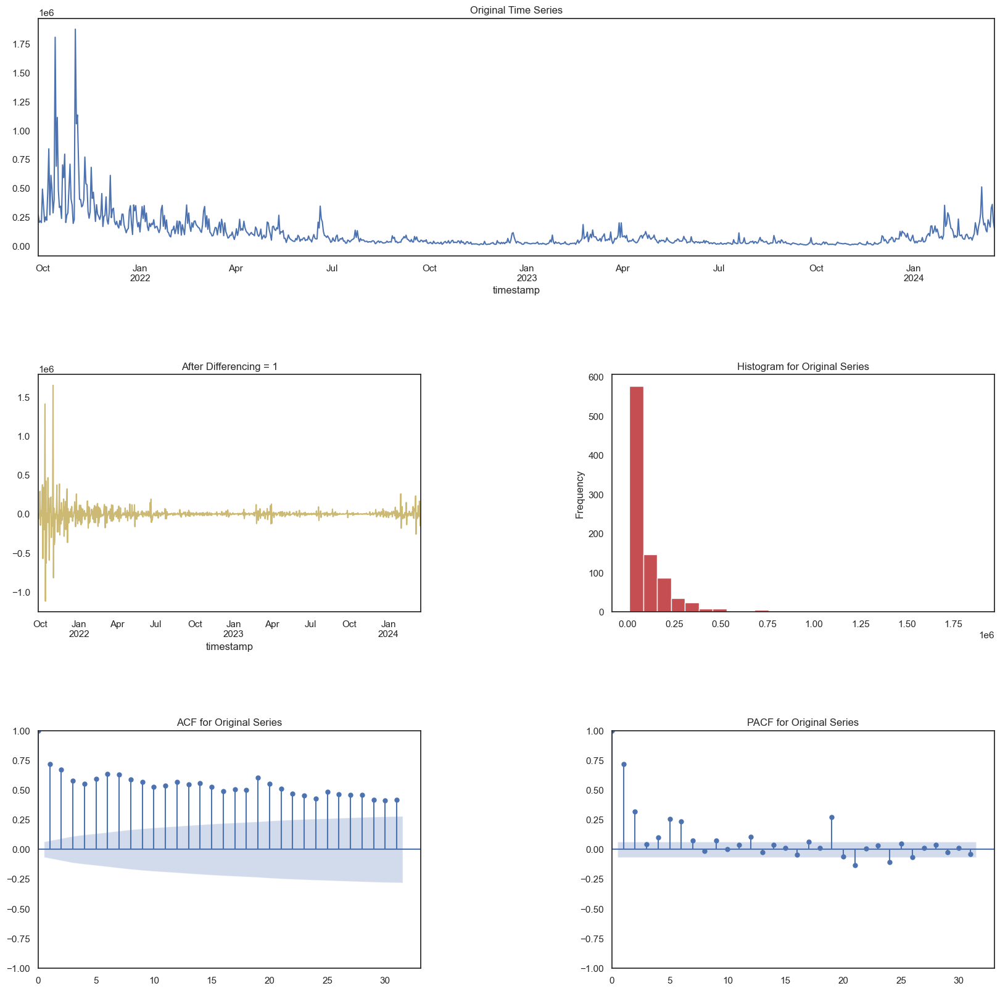

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 5, 'cv': 10}
    Fit-Predict data (shape=(903, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 878 Test Shape: 5


19:52:08 - cmdstanpy - INFO - Chain [1] start processing
19:52:08 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 79,816.36
    Std Deviation of actuals = 10,947.15
    Normalized RMSE (as pct of std dev) = 729%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 883 Test Shape: 5


19:52:09 - cmdstanpy - INFO - Chain [1] start processing
19:52:09 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 36,157.92
    Std Deviation of actuals = 38,887.53
    Normalized RMSE (as pct of std dev) = 93%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 888 Test Shape: 5


19:52:09 - cmdstanpy - INFO - Chain [1] start processing
19:52:10 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 187,253.35
    Std Deviation of actuals = 117,501.32
    Normalized RMSE (as pct of std dev) = 159%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 893 Test Shape: 5


19:52:10 - cmdstanpy - INFO - Chain [1] start processing
19:52:11 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 32,138.37
    Std Deviation of actuals = 39,107.03
    Normalized RMSE (as pct of std dev) = 82%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 898 Test Shape: 5


19:52:12 - cmdstanpy - INFO - Chain [1] start processing
19:52:12 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 115,517.40
    Std Deviation of actuals = 85,774.12
    Normalized RMSE (as pct of std dev) = 135%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 75730.53
    MSE (Mean Squared Error = 11423801689.22
    MAPE (Mean Absolute Percent Error) = 48%
    RMSE (Root Mean Squared Error) = 106882.1860
    Normalized RMSE (MinMax) = 23%
    Normalized RMSE (as Std Dev of Actuals)= 101%
Time Taken = 6 seconds


19:52:13 - cmdstanpy - INFO - Chain [1] start processing
19:52:14 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 90176.68


--------------------------------------------------
Total time taken: 18 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name     rmse
0  Prophet 90176.68


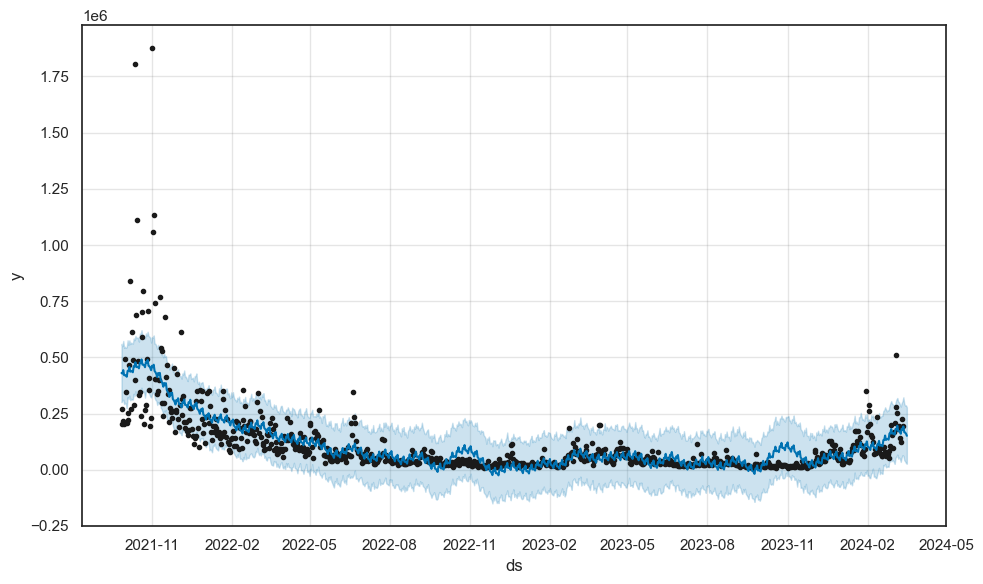

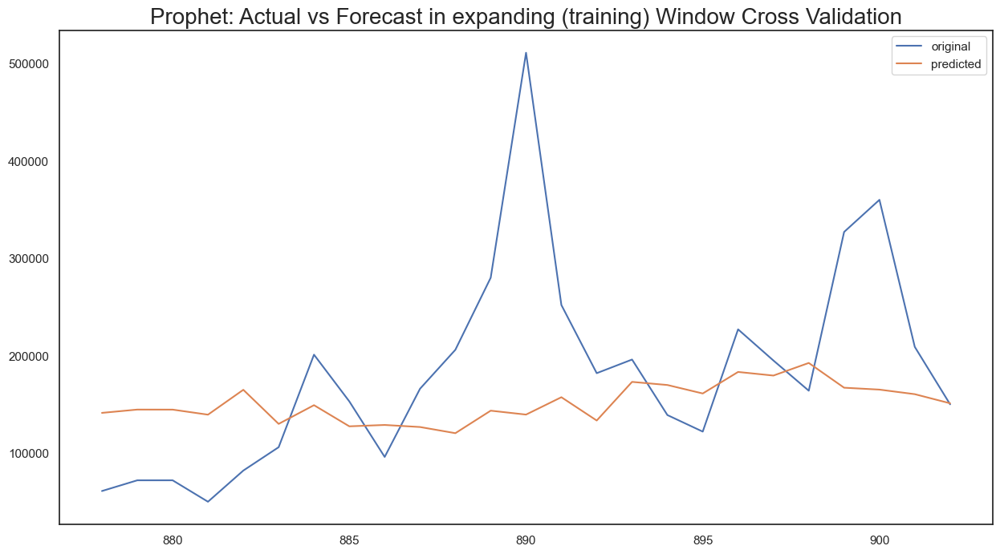

In [8]:
# Crear un diccionario para almacenar los modelos
trained_models = {}

# Iterar sobre cada columna seleccionada
for column in columns_to_model:
    # Excluir 'Open_time' del bucle de iteración
    if column != 'Open_time':
        # Seleccionar solo la columna actual y la columna de tiempo (Open_time)
        data = feature_dataset[['Open_time', column]]
        
        # Renombrar las columnas para que auto_ts pueda identificar la columna de tiempo
        data.columns = ['timestamp', 'target']
        
        # Convertir la columna de tiempo a tipo datetime
        data['timestamp'] = pd.to_datetime(data['timestamp'])
        
        # Entrenar el modelo utilizando auto_timeseries
        model = auto_timeseries(score_type='rmse', time_interval='D',
                                non_seasonal_pdq=None, seasonality=True,
                                model_type='prophet', verbose=2, forecast_periods=n_days_to_predict, cv=10)
        
        model.fit(data, 'timestamp', 'target')
        
        # Guardar el modelo en el diccionario
        trained_models[column] = model

#### Guardo el mejor modelo para cada columna

In [9]:
for column, model in trained_models.items():
    # Guarda el modelo en un archivo usando dill
    with open(f"auto_timeseries_models_prophet/{column}.pkl", "wb") as file:
        dill.dump(model, file)

#### Vuelvo a armar el mejor modelo para cada columna

In [11]:
loaded_models = {}

# Itera sobre los archivos guardados
for column in columns_to_model:
    if column != 'Open_time':
        # Cargar el modelo desde el archivo
        with open(f"auto_timeseries_models_prophet/{column}.pkl", "rb") as file:
            loaded_model = dill.load(file)
        
        # Guardar el modelo cargado en el diccionario
        loaded_models[column] = loaded_model

#### Prediccion N dias en el futuro

In [12]:
def calcular_indicadores_tecnicos(predictions_next_day, feature_dataset, n_days_to_predict):
    # Concatenar la columna Close de predictions_next_day y feature_dataset
    concatenated_df = pd.concat([feature_dataset['Close'], predictions_next_day['Close']], axis=0)

    # Calcular los indicadores sobre el nuevo dataset
    close_prices = np.array(concatenated_df, dtype=np.double)
    sma_20 = talib.SMA(close_prices, timeperiod=20)
    ema_20 = talib.EMA(close_prices, timeperiod=20)
    upper_band, middle_band, lower_band = talib.BBANDS(close_prices, timeperiod=20, nbdevup=2, nbdevdn=2)
    rsi = talib.RSI(close_prices, timeperiod=14)

    # Crear un DataFrame para almacenar los indicadores técnicos
    indicadores = pd.DataFrame({
        'SMA_20': sma_20,
        'EMA_20': ema_20,
        'Upper_Band': upper_band,
        'Middle_Band': middle_band,
        'Lower_Band': lower_band,
        'RSI': rsi
    })

    # Obtener los últimos 5 registros del dataset con los indicadores
    ultimos_indicadores = indicadores.tail(n_days_to_predict)
    ultimos_indicadores.index = predictions_next_day.index

    # Unir los DataFrames por sus índices
    resultado = pd.concat([predictions_next_day, ultimos_indicadores], axis=1)


    return resultado

In [13]:
def hacer_predicciones_para_N_dias_siguientes(trained_models, n_days_to_predict):
    predictions = {}

    for feature, model in trained_models.items():
        
        # Realizar la predicción para la característica actual
        prediction = model.predict(testdata=n_days_to_predict, model='best')
        # display(prediction)
        # Obtener solo el valor 'yhat' de la predicción
        prediction_yhat = prediction['yhat']
        prediction_open_time = prediction.index
        
        # Almacenar la predicción en el diccionario
        predictions[feature] = prediction_yhat
        predictions['Open_time'] = prediction_open_time

    # Convertir el diccionario de predicciones en un DataFrame de pandas
    predictions_df = pd.DataFrame(predictions)

    return predictions_df

In [14]:
predictions_next_day = hacer_predicciones_para_N_dias_siguientes(loaded_models, n_days_to_predict)
display(predictions_next_day)

predictions_next_day = calcular_indicadores_tecnicos(predictions_next_day, feature_dataset, n_days_to_predict)
display(predictions_next_day)

Predicting using forecast period=5 as input for Prophet model
Building Forecast dataframe. Forecast Period = 5
Predicting using forecast period=5 as input for Prophet model
Building Forecast dataframe. Forecast Period = 5
Predicting using forecast period=5 as input for Prophet model
Building Forecast dataframe. Forecast Period = 5
Predicting using forecast period=5 as input for Prophet model
Building Forecast dataframe. Forecast Period = 5
Predicting using forecast period=5 as input for Prophet model
Building Forecast dataframe. Forecast Period = 5
Predicting using forecast period=5 as input for Prophet model
Building Forecast dataframe. Forecast Period = 5
Predicting using forecast period=5 as input for Prophet model
Building Forecast dataframe. Forecast Period = 5
Predicting using forecast period=5 as input for Prophet model
Building Forecast dataframe. Forecast Period = 5
Predicting using forecast period=5 as input for Prophet model
Building Forecast dataframe. Forecast Period = 5
P

,Open,Open_time,High,Low,Close,Number of trades,Close_BTCUSDT,Volume_BTCUSDT,Number_of_trades_BTCUSDT,Close_ETHUSDT,Volume_ETHUSDT,Number_of_trades_ETHUSDT,Close_BNBUSDT,Volume_BNBUSDT,Number_of_trades_BNBUSDT,buy_1000x_high_coinbase,sell_1000x_high_coinbase,total_trades_coinbase,Tweets_Utilizados,Tweets_Utilizados_coin,Tweets_Utilizados_referentes,Tweets_Utilizados_whale_alert,Buy_1000x_high,sell_1000x_high,total_trades_binance
903,11.05,903,12.02,11.15,11.53,286555.96,64447.57,58734.15,2106110.80,3456.81,671183.95,1541321.67,431.28,1342784.27,564636.81,75.46,79.13,64944.74,283.39,184.83,1.00,34.47,498.34,455.17,182626.23
904,11.24,904,12.21,11.41,11.76,280560.86,64826.62,57306.78,2003996.04,3487.94,685310.21,1578597.11,433.51,1384375.90,589032.50,70.85,74.55,64252.31,284.52,188.26,1.34,36.19,480.88,439.56,178539.14
905,11.45,905,12.56,11.52,12.01,312817.30,65224.33,51010.64,1770563.91,3518.27,728678.35,1637690.08,435.36,1395786.62,598418.36,78.83,77.23,66546.50,290.56,196.67,1.18,36.91,507.79,455.87,192534.55
906,11.68,906,12.69,11.85,12.15,292664.68,65289.22,36983.09,1467491.44,3537.58,699481.77,1606421.24,435.79,1373652.18,584883.77,70.50,73.40,63739.58,280.97,191.03,1.13,36.85,513.58,459.57,168828.30
907,11.81,907,12.86,11.98,12.33,286081.36,65471.65,31587.38,1223775.77,3554.70,683990.87,1586995.15,436.57,1321189.12,566588.20,70.18,72.82,62105.64,270.25,185.01,1.13,38.45,504.55,455.78,167687.78


,Open,Open_time,High,Low,Close,Number of trades,Close_BTCUSDT,Volume_BTCUSDT,Number_of_trades_BTCUSDT,Close_ETHUSDT,Volume_ETHUSDT,Number_of_trades_ETHUSDT,Close_BNBUSDT,Volume_BNBUSDT,Number_of_trades_BNBUSDT,buy_1000x_high_coinbase,sell_1000x_high_coinbase,total_trades_coinbase,Tweets_Utilizados,Tweets_Utilizados_coin,Tweets_Utilizados_referentes,Tweets_Utilizados_whale_alert,Buy_1000x_high,sell_1000x_high,total_trades_binance,SMA_20,EMA_20,Upper_Band,Middle_Band,Lower_Band,RSI
903,11.05,903,12.02,11.15,11.53,286555.96,64447.57,58734.15,2106110.80,3456.81,671183.95,1541321.67,431.28,1342784.27,564636.81,75.46,79.13,64944.74,283.39,184.83,1.00,34.47,498.34,455.17,182626.23,10.14,10.10,12.05,10.14,8.23,64.08
904,11.24,904,12.21,11.41,11.76,280560.86,64826.62,57306.78,2003996.04,3487.94,685310.21,1578597.11,433.51,1384375.90,589032.50,70.85,74.55,64252.31,284.52,188.26,1.34,36.19,480.88,439.56,178539.14,10.31,10.26,12.16,10.31,8.47,65.36
905,11.45,905,12.56,11.52,12.01,312817.30,65224.33,51010.64,1770563.91,3518.27,728678.35,1637690.08,435.36,1395786.62,598418.36,78.83,77.23,66546.50,290.56,196.67,1.18,36.91,507.79,455.87,192534.55,10.50,10.43,12.23,10.50,8.77,66.73
906,11.68,906,12.69,11.85,12.15,292664.68,65289.22,36983.09,1467491.44,3537.58,699481.77,1606421.24,435.79,1373652.18,584883.77,70.50,73.40,63739.58,280.97,191.03,1.13,36.85,513.58,459.57,168828.30,10.67,10.59,12.33,10.67,9.02,67.51
907,11.81,907,12.86,11.98,12.33,286081.36,65471.65,31587.38,1223775.77,3554.70,683990.87,1586995.15,436.57,1321189.12,566588.20,70.18,72.82,62105.64,270.25,185.01,1.13,38.45,504.55,455.78,167687.78,10.82,10.76,12.53,10.82,9.11,68.51


In [15]:
predictions_next_day.to_csv('auto_timeseries_models_prophet/predicciones.csv', index=False)

Si predice maso menos bien para estas variables hacer lo siguiente:
- Volver a ejecutar el codigo, extendiendolo para los otras variables (menos los indicadores)
- Tengo forma de validar que los modelos generados generen predicciones en todas las columnas?
- tengo forma de tunear la libreria para que performe mejor?
- existe alguna otra libreria de auto ml pra series que funcione mejor? 


- Armar el clasificador (LSTM o CONV), entrenandolo sobre los datos del dataset original ( sin los ultimos 5 registros)
- Probar como predice el target (Tendencia) para los ultimos 5 registros con los datos generados por los modelos